# Twitter Sentiment Analysis of Twitter users based on different covid 19 vaccines.

# Importing Python Libraries

In [1]:
import re
import csv
import tweepy
import pandas as pd
import json
from tweepy import OAuthHandler
from datetime import datetime, timedelta
import warnings 
warnings.filterwarnings("ignore", category=DeprecationWarning)
import numpy as np 
import string
from textblob import TextBlob
import requests
from IPython.display import display
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize,RegexpTokenizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.stem import WordNetLemmatizer
from nltk.classify import NaiveBayesClassifier
from wordcloud import WordCloud
from collections import Counter
nltk.download('punkt')
nltk.download('stopwords')
stopwords = stopwords.words()
import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
from plotly.subplots import make_subplots

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jaseb\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jaseb\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Accessing Twitter API to scrape tweets from twiiter

# We save our twitter api tokens inorder to access the twitter API to fetch tweets

In [2]:
access_token =  '1437775477930958851-kHBLkp64OZYv8JtrVdon5cbHVQ29rt'
access_token_secret = '2zrnpjdomfZFBXUVN87Pdq9miC3lSQRpkVp5llDXA3C8T'
consumer_key = 'Z8xLSZcc8RIYGBtPf4zEcd1Bi'
consumer_secret = 'xWPh313XZLUmB6wUnIA6EaZ6RrL9382iU81nwnMYKFXYsZCWsG'

In [3]:
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth,wait_on_rate_limit=True,wait_on_rate_limit_notify=True)

# Extracting tweets based on search keyword

Function to extract tweets from twitter API using tweepy library.

Here we extract tweets based on keywords where the keywords are covid 19 vaccines.
We would be extracting fields 'tweet id','time of tweet','user id','text','location','source','screen_name' and write those
into a CSV file with the keyword as the filename.

In [4]:
def extractTweets(keyWord):
    csvFile = open(keyWord + ".csv", 'w', encoding='UTF8', newline='')
    fileCSV = csv.writer(csvFile)
    header = ['tweet id','time of tweet','user id','text','location','source','screen_name']
    fileCSV.writerow(header)
    for tweet in tweepy.Cursor(api.search,
              q=keyWord,
              lang="en").items(2000):
      print(tweet.text)
      text = cleaningTweets(tweet.text)
      fileCSV.writerow([tweet.id,tweet.created_at,tweet.user.id,text,tweet.user.location,tweet.source,tweet.user.screen_name])
    csvFile.close()

# EDA

In this function we implement our Exploratory Data Analysis.

We would be exploring the dynamics of the data sets we created by fetching tweets from twitter.

In [5]:
def eda(keyWord):
    df = readCSV(keyWord)
    print('Data Frame head:')
    display(df.head())
    print('Data Frame Tail:')
    display(df.tail())
    print('Shape of DataFrame:')
    print(df.shape)
    print('\n')
    print('Total tweets in this data: {}'.format(df.shape[0]))
    print('Total Unique Users in this data: {}'.format(df['user id'].nunique()) )
    print('Info of DataFrame:')
    print(df.info())
    print('\n')
    print('Data Types of DataFrame:')
    print(df.dtypes)
    print('\n')
    print('Describe Dataframe:')
    print(df.describe())
    print('\n')
    print('Checking Null Values in DataFrame:')
    print(df.isnull().sum())
    df = handleNull(df)
    print('Data Frame after Handling Null/Missing values:')
    display(df.head())
    df.to_csv(keyWord+'.csv')
    

# Handling null values

In this function we would be identifying and handling the Null/missing values

In [6]:
def handleNull(df):
    df["location"].fillna("location Unknown", inplace = True)
    df1 = df.dropna()
    #df1 = df1.drop(columns=['Unnamed: 0','Unnamed: 0.1'])
    df1.drop(df1.columns.difference(['tweet id','time of tweet','user id','text','location','Sentiment','source','screen_name']), 1, inplace = True)
    return df1

# Cleaning Tweets for Sentiment Analysis 

In this function we would be cleaning our tweets using re and NLTK libraries.
We need the tweets to be structured and clean from unwanted data so that it can be processed easily for
sentiment analysis.

In [7]:
def cleaningTweets(tweet):
    #Make text lowercase, remove text in square brackets,remove links,remove punctuation
    #and remove words containing numbers
    #tweet = str(tweet).lower()
    tweet = re.sub("#[A-Za-z0-9_]+","", tweet)
    tweet = re.sub('\[.*?\']', '', tweet)
    tweet = re.sub("@[\w]*: | *RT*","",tweet)
    tweet = re.sub('https?://\S+|www\.\S+', '', tweet)
    tweet = re.sub('<.*?>+', '', tweet)
    tweet = re.sub("(?<=[a-z])'(?=[a-z])", "", tweet)
    tweet = re.sub('[%s]' % re.escape(string.punctuation), '', tweet)
    tweet = re.sub('\n', '', tweet)
    tweet = re.sub('\w*\d\w*', '', tweet)
    rePattern = re.compile(pattern = "["
        u"\U0001F600-\U0001F64F"  
        u"\U0001F300-\U0001F5FF"  
        u"\U0001F680-\U0001F6FF" 
        u"\U0001F1E0-\U0001F1FF"  
        u"\U00002500-\U00002BEF"  
        u"\U00002702-\U000027B0"
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642"
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  
        u"\u3030"
        "]+", flags = re.UNICODE)
    tweet = rePattern.sub(r'',tweet)
    return tweet

# NLTK Sentiment Analyzer

Here we would be implementing sentiment analysis using Vader model and save the new column as sentiment into the existing
CSV file.

In [8]:
def analyzeSentiment(keyWord):
    tweetDF = readCSV(keyWord)
    #sentimentDF = tweetDF[['text']]
    tweetDF = tweetDF.assign(Sentiment = tweetDF.text.apply(lambda text: sentimentAnalyzer(text)))
    tweetDF1 = handleNull(tweetDF)
    tweetDF1.to_csv(keyWord+'.csv')
    printCSV(keyWord)
    
def sentimentAnalyzer(text):
    sa = SentimentIntensityAnalyzer()
    scores = sa.polarity_scores(text)
    return 'Negative' if scores['neg'] > scores['pos'] else 'Positive'

Function to read and print the CSV file by passing the keyword which is the csv file name.

In [9]:
def readCSV(keyWord):
    tweetDF = pd.read_csv(keyWord+'.csv')
    #tweetDF.head()
    return tweetDF

def printCSV(keyWord):
    tweetDF = pd.read_csv(keyWord+'.csv')
    #print(tweetDF.head())
    display(tweetDF)

# Find Frequently used Words

This function is used for finding the top 50 words from the cleaned tweets.

In [10]:
def frequentWords(keyWord):
    df = readCSV(keyWord)
    df['After Stop word removal'] = df['text'].apply(stopwordRemoval)
    frequentWords = Counter(" ".join(df['After Stop word removal']).split()).most_common(50)
    frequentWordDF = pd.DataFrame(frequentWords, columns = ['Word', 'Frequency of Word'])
    print(frequentWordDF)
    print("\n")
    print('\033[1m' + 'Frequent Words Word Cloud' + '\033[0m')
    data_freq = frequentWordDF['Word']
    plt.figure(figsize = (20,20))
    wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,collocations=False).generate(" ".join(data_freq))
    plt.imshow(wc)
    return df

This function is used for removing stop words from our cleaned tweets

In [11]:
def stopwordRemoval(tweets):
    tweets = str(tweets).lower()
    tokens = word_tokenize(tweets)
    tokenSW = [word for word in tokens if not word in stopwords]
    tweetSW = (" ").join(tokenSW)
    tweet = tweetSW
    return tweet

# Visulaization

From here we would be implementing different visualization techniques inorder to analyse the twitter data we have

Function to generate a Barplot to identify the distribution of sentiment

In [12]:
def visual(df,keyWord):
    dist = df.groupby(["Sentiment"]).size()
    fig, ax = plt.subplots(figsize=(12,8))
    ax.set_xlabel( "Sentiment" , size = 12 )
    ax.set_ylabel( "Tweets" , size = 12 )
    ax.set_title( keyWord , size = 24 )
    sns.barplot(dist.keys(), dist.values);
    plt.show()

Function to create word loud which showcases the most frequent words used in negative and positive tweets respectively

In [13]:
def wordCloud(df):
    print('\033[1m' + 'Negative Words Word Cloud' + '\033[0m')
    data_neg = df['text'].where(df["Sentiment"]=="Negative")
    data_neg = data_neg.dropna()
    plt.figure(figsize = (20,20))
    wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,collocations=False).generate(" ".join(data_neg))
    plt.imshow(wc)

    data_pos = df['text'].where(df["Sentiment"]=="Positive")
    data_pos = data_pos.dropna()
    plt.figure(figsize = (20,20))
    wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,collocations=False).generate(" ".join(data_pos))
    plt.imshow(wc)
    print("\n")
    print('\033[1m' + 'Positive Words Word Cloud' + '\033[0m')

Function to display most common source from where the tweets where tweeted

In [14]:
def tweetSource(df):
    source_df=df['source'].value_counts().to_frame().reset_index().rename(columns={'index':'source','source':'count'})[:15]
    display(source_df.head(10))
    fig = go.Figure(go.Bar(
    x=source_df['source'],y=source_df['count'],
    marker={'color': source_df['count'], 
    'colorscale': 'blues'},  
    text=source_df['count'],
    textposition = "outside",
    ))
    fig.update_layout(title_text='Top Sources ',xaxis_title="Sources",yaxis_title="Count ",
                  template="plotly_dark",title_x=0.5)
    fig.show()
    
        
    df['source'] = df['source'].fillna('NA')
    df = df['source'].value_counts().to_frame()

    total = df['source'].sum()
    df['percentage'] = 100 * df['source']/total    
    field = 'source'
    percent_limit = 0.5
    otherdata = df[df['percentage'] < percent_limit] 
    others = otherdata['percentage'].sum()  
    maindata = df[df['percentage'] >= percent_limit]

    df = maindata
    other_label = "Others(<" + str(percent_limit) + "% each)"
    df.loc[other_label] = pd.Series({field:otherdata['source'].sum()}) 
    
    labels = df.index.tolist()   
    datavals = df[field].tolist()
    
    trace=go.Pie(labels=labels,values=datavals)
    
    layout = go.Layout(
        title = 'Number of tweets per source',
        height=1000,
        width=1000
        )
    
    fig = go.Figure(data=[trace], layout=layout)
    iplot(fig)

Function to display most common location from where the tweets where tweeted

In [15]:
def tweetLocation(df):
    location_df=df['location'].value_counts().to_frame().reset_index().rename(columns={'index':'location','location':'count'})[:15]
    display(location_df.head(10))
    fig = go.Figure(go.Bar(
    x=location_df['location'],y=location_df['count'],
    marker={'color': location_df['count'], 
    'colorscale': 'blues'},  
    text=location_df['count'],
    textposition = "outside",
    ))
    fig.update_layout(title_text='Top Sources ',xaxis_title="Sources",yaxis_title="Count ",
                  template="plotly_dark",title_x=0.5)
    fig.show()
    
    
    
    df['location'] = df['location'].fillna('NA')
    df = df['location'].value_counts().to_frame()

    total = df['location'].sum()
    df['percentage'] = 100 * df['location']/total    
    field = 'location'
    percent_limit = 0.5
    otherdata = df[df['percentage'] < percent_limit] 
    others = otherdata['percentage'].sum()  
    maindata = df[df['percentage'] >= percent_limit]

    df = maindata
    other_label = "Others(<" + str(percent_limit) + "% each)"
    df.loc[other_label] = pd.Series({field:otherdata['location'].sum()}) 
    
    labels = df.index.tolist()   
    datavals = df[field].tolist()
    
    trace=go.Pie(labels=labels,values=datavals)
    
    layout = go.Layout(
        title = 'Number of tweets per location',
        height=1000,
        width=1000
        )
    
    fig = go.Figure(data=[trace], layout=layout)
    iplot(fig)

Function to display most unique users who tweeted

In [16]:
def tweetUser(df):
    userid_df=df['screen_name'].value_counts().to_frame().reset_index().rename(columns={'index':'screen_name','screen_name':'count'})[:15]
    display(userid_df.head(10))
    fig = go.Figure(go.Bar(
    x=userid_df['screen_name'],y=userid_df['count'],
    marker={'color': userid_df['count'], 
    'colorscale': 'blues'},  
    text=userid_df['count'],
    textposition = "outside",
    ))
    fig.update_layout(title_text='Top Sources ',xaxis_title="Sources",yaxis_title="Count ",
                  template="plotly_dark",title_x=0.5)
    fig.show()

Function to display N-Grams

In [17]:
def ngram_df(df,nrange,n=None):
    vec = CountVectorizer(stop_words = 'english',ngram_range=nrange).fit(df)
    bag_of_words = vec.transform(df)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    total_list=words_freq[:n]
    df1 = pd.DataFrame(total_list,columns=['text','count'])
    return df1

In [18]:
def displayNgram(unigram_df,bigram_df,trigram_df):
    fig = make_subplots(
        rows=3, cols=1,subplot_titles=("Unigram","Bigram",'Trigram'),
        specs=[[{"type": "scatter"}],
               [{"type": "scatter"}],
               [{"type": "scatter"}]
              ])

    fig.add_trace(go.Bar(
        y=unigram_df['text'][::-1],
        x=unigram_df['count'][::-1],
        marker={'color': "blue"},  
        text=unigram_df['count'],
        textposition = "outside",
        orientation="h",
        name="Months",
        ),row=1,col=1)

    fig.add_trace(go.Bar(
        y=bigram_df['text'][::-1],
        x=bigram_df['count'][::-1],
        marker={'color': "blue"},  
        text=bigram_df['count'],
         name="Days",
        textposition = "outside",
        orientation="h",
        ),row=2,col=1)

    fig.add_trace(go.Bar(
        y=trigram_df['text'][::-1],
        x=trigram_df['count'][::-1],
        marker={'color': "blue"},  
        text=trigram_df['count'],
         name="Days",
        orientation="h",
        textposition = "outside",
        ),row=3,col=1)

    fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
    fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
    fig.update_layout(title_text='Top N Grams',xaxis_title=" ",yaxis_title=" ",
                  showlegend=False,title_x=0.5,height=1200,template="plotly_dark")
    fig.show()

Function to display data distribution using violin plot

In [19]:
def violinPLot(df):
    df['text_length']=df['text'].str.split().map(lambda x: len(x))
    fig = go.Figure(data=go.Violin(y=df['text_length'], box_visible=True, line_color='black',
                               meanline_visible=True, fillcolor='royalblue', opacity=0.6,
                               x0='Tweet Text Length'))

    fig.update_layout(yaxis_zeroline=False,title="Distribution of Text length",template='ggplot2')
    fig.show()

Function to display how many tweets were tweeted per day

In [3]:
def tweetsPerDay(df):
    
    df['time of tweet'] = pd.to_datetime(df['time of tweet'], errors='coerce')
    df['tweet_date']=df['time of tweet'].dt.date
    tweet_date=df['tweet_date'].value_counts().to_frame().reset_index().rename(columns={'index':'date','tweet_date':'count'})
    tweet_date['date']=pd.to_datetime(tweet_date['date'],infer_datetime_format=True,errors ='coerce')
    tweet_date=tweet_date.sort_values('date',ascending=False)
    fig=go.Figure(go.Scatter(x=tweet_date['date'],
                                y=tweet_date['count'],
                               mode='markers+lines',
                               name="Submissions",
                               marker_color='dodgerblue'))

    df1=df.dropna(subset=['tweet_date'])

    fig.update_layout(
        title_text='Tweets per Day : ({} - {})'.format(df1['tweet_date'].sort_values()[0].strftime("%d/%m/%Y"),
                                                       df1['tweet_date'].sort_values().iloc[-1].strftime("%d/%m/%Y")),template="plotly_dark",
        title_x=0.5)

    fig.show()

# Model Preparation

Function to convert the text into numerical format using countVectorization technique so that the ML model can process the data

In [21]:
def countVector(df):
    token = RegexpTokenizer(r'[a-zA-Z0-9]+')
    cv = CountVectorizer(stop_words='english',ngram_range = (1,1),tokenizer = token.tokenize)
    text_counts  = cv.fit_transform(df['After Stop word removal'].values.astype('U')) 

    with open("cv", 'wb') as file:  
        pickle.dump(cv, file)
    return text_counts 

Function to build the 3 classification models which are Naive Bayes,Random Forrest classification and SVM

After the model is build we save the model as pickle file

In [24]:
from sklearn.naive_bayes import ComplementNB
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from sklearn import metrics
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn import preprocessing
from yellowbrick.classifier import ClassificationReport
from math import *
import pickle

def modelPreparation(df):
    text_counts  = countVector(df)
    le = preprocessing.LabelEncoder()
    df['Sentiment']= le.fit_transform(df['Sentiment'])
    #display(df)
    x_train, x_test, y_train, y_test = train_test_split(text_counts , df['Sentiment'], test_size = 0.20, random_state = 0)
    
    # Naive Bayes Classification
    print("Naive Bayes:")
    cnb = ComplementNB()
    cnb.fit(x_train, y_train)        
    print ("Train accuracy {:.2f}%".format(cnb.score(x_train,y_train)*100))
    print ("Test accuracy {:.2f}%".format(cnb.score(x_test,y_test)*100))
    y_pred = cnb.predict(x_test)
    #confusionMatrix(y_test,y_pred)
    print("Accuracy Score:")
    print(accuracy_score(y_test, y_pred))
    print("Confusion Matrix:")
    plot_confusion_matrix(cnb, x_test,y_test)
    plt.show()
    print("Classification Report:")
    classes = ["Positive", "Negative"]
    visualizer = ClassificationReport(cnb, classes=classes, support=True)
    visualizer.fit(x_train, y_train)
    visualizer.score(x_test,y_test)
    visualizer.show()    
    
    print("\n")
    # Random Forest Classification
    print("Random Forest Classification:")
    clf = RandomForestClassifier(max_depth=2, random_state=0)
    clf.fit(x_train, y_train)
    print ("Train accuracy {:.2f}%".format(clf.score(x_train,y_train)*100))
    print ("Test accuracy {:.2f}%".format(clf.score(x_test,y_test)*100))
    y_pred = clf.predict(x_test)
    #confusionMatrix(y_test,y_pred)
    print("Accuracy Score:")
    print(accuracy_score(y_test, y_pred))
    print("Confusion Matrix:")
    plot_confusion_matrix(clf, x_test,y_test)
    plt.show()
    print("Classification Report:")
    classes = ["Positive", "Negative"]
    visualizer = ClassificationReport(clf, classes=classes, support=True)
    visualizer.fit(x_train, y_train)
    visualizer.score(x_test,y_test)
    visualizer.show()    
    
    print("\n")
    # SVM
    print("SVM:")
    svmclf = svm.SVC()
    svmclf.fit(x_train, y_train)
    print ("Train accuracy {:.2f}%".format(svmclf.score(x_train,y_train)*100))
    print ("Test accuracy {:.2f}%".format(svmclf.score(x_test,y_test)*100))
    y_pred = svmclf.predict(x_test)
    #confusionMatrix(y_test,y_pred)
    print("Accuracy Score:")
    print(accuracy_score(y_test, y_pred))
    print("Confusion Matrix:")
    plot_confusion_matrix(svmclf, x_test,y_test)
    plt.show()
    print("Classification Report:")
    classes = ["Positive", "Negative"]
    visualizer = ClassificationReport(svmclf, classes=classes, support=True)
    visualizer.fit(x_train, y_train)
    visualizer.score(x_test,y_test)
    visualizer.show()  
    
    # Saving the models in pickle file
    modelFile = "ComplementNB.pkl"  

    with open(modelFile, 'wb') as file:  
        pickle.dump(cnb, file)
        
    with open("RandomForestClassification.pkl", 'wb') as file:  
        pickle.dump(clf, file)
        
    with open("SVM.pkl", 'wb') as file:  
        pickle.dump(svmclf, file)
        
    return modelFile

# Test Model

Function to test the model that we created using  the test data set

In [25]:
def testModel(modelFile,df):
    with open(modelFile, 'rb') as file:
        cnb = pickle.load(file)
    with open("RandomForestClassification.pkl", 'rb') as file:
        clf = pickle.load(file)
    with open("SVM.pkl", 'rb') as file:
        svmclf = pickle.load(file)
    with open("cv", 'rb') as file:
        cv = pickle.load(file)
    print(cnb)
    #df = cleaningTweets(df)
    df['text'] = df['text'].apply(cleaningTweets)
    df['After Stop word removal'] = df['text'].apply(stopwordRemoval)
    text_counts  = cv.transform(df['After Stop word removal'].values.astype('U'))
    
    print("Naive Bayes:")
    print(cnb.predict(text_counts))
    print("\n")
    print("Random Forest Classification:")
    print(clf.predict(text_counts))
    print("\n")
    print("SVM:")
    print(svmclf.predict(text_counts))
        

# Confusion Matrix

In [26]:
def confusionMatrix(y_test,y_pred):
    confusionMatrix = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:",confusionMatrix)

# Search tweets related to different Covid 19 vaccines

# Tweets related to Moderna

In [76]:
keyWord = input("\nEnter Covid vaccine name:")
extractTweets(keyWord)


Enter Covid vaccine name:#Moderna
Boosted!
#Moderna #Booster https://t.co/iFw6XjWvzN
RT @SmashAuthor1ty: Nothing to do with @pfizer / #vaccines 
It MUST be #COVID19
It MUST be #Delta
It Must be #Omicron
(sarcasm)
#novavax #P…
RT @manoe1987: Schande .... #VaccinatieSchade #VaccineSideEffects #childs #vaccins #slachtoffers #BigPharma #Pfizer #moderna https://t.co/v…
RT @SmashAuthor1ty: #Australia: Northern Territory tyrant Michael Gunner @fanniebay has been served and the document has been stamped by th…
#OrangeCounty Woman's Death After 2nd Dose of #ModernaVaccine Spurs Concern From #Family 30/04/2021… https://t.co/18xI9ht4DY
The anti-Brexit brigade are pretty quiet now we are seeing fascism descend over Europe. 

Weird.

#BrexitBritain… https://t.co/8cKX7iNIzL
RT @Bvweir: #COVIDVaccines 

#Moderna may be leading #Pfizer in vaccine efficacy 

 https://t.co/GPaDyQQjpw
Gotdang even Trevor Noah can smell something ain't right. 

#CovidVaccine #COVID19 #omicron #trevornoah #bigpharma… http

RT @SmashAuthor1ty: Nothing to do with @pfizer / #vaccines 
It MUST be #COVID19
It MUST be #Delta
It Must be #Omicron
(sarcasm)
#novavax #P…
Moderna CEO says vaccines likely less effective against Omicron - FT
https://t.co/SzTWHey3OX
#Moderna #CEO #Vaccine #Omicron
@Vastuulisuus
For wife and me, sore arm like tetanus shot, added fatigue for 24 hrs. Small price to pay for added protection.… https://t.co/cZDvmSYQmE
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @GothicFunktion: @_4h09_ @ianlevinestory @UnsignedArtsSC @245rocks @AFallingRobin @AlchemicJourney @AscendingDawn @BluebeatShelter @blue…
@_4h09_ @ianlevinestory @UnsignedArtsSC @245rocks @AFallingRobin @AlchemicJourney @AscendingDawn @BluebeatShelter… https://t.co/gCkahamFGT
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
Guess who got their boo

RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
"The #Moderna study reported one death from COVID-19 in the vaccinated group and three in the unvaccinated group (.… https://t.co/PFzd5MfdIN
RT @Operator1N: India is refusing to buy any vaccines from Pfizer/Moderna mRNA. #pfizergates #Moderna
RT @MicrobesInfo: SARS-CoV-2 #vaccine from #Moderna better at stopping #infections than #Pfizer ... 

| #COVID19 | #Immunization | #mRNA |…
Follow the 💵. Instead of protecting our country and citizens it appears the #fda is instead prioritizing money inst… https://t.co/zUxIsFg9Tt
@Scotus @FoxNews I think we need an investigation into a

RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @Bvweir: #COVIDVaccines 

#Moderna may be leading #Pfizer in vaccine efficacy 

 https://t.co/GPaDyQQjpw
OFC THE SECOND I GET IN BED MY ARMS AND LEGS START ACHING BITCH THE FIRST 12 hours we’re going so well I was so hap… https://t.co/Y5SN06w7ES
Latest government guidelines on heart issues #myocarditis #Pericarditis #Myopericarditis resulting from vaccination… https://t.co/N4rZqPCa7J
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
@Debbie55330469 @moderna_tx You will be okay! Bett

RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
@michaelpurvis64 No #Cardiologists are sure that #Pfizer &amp; #ModeRNA are killing people https://t.co/QqkEe7e14f… https://t.co/vOUrWJejxA
I read this week that #Moderna will need to make new #vaccine to fight #Omnicron because what we have will likely n… https://t.co/9IbUkguk14
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
Thousands facing heart problems due to ‘post-pandemic stress disorder’ | Evening Standard 🤣🤣🤣, #gtfoh so this why s… https://t.co/PkUEt7u6Sp
RT @BodyPROHIV: Af

RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
@CDCgov I was fully vaxxed 7mo ago with #Moderna I spent this week N hell with #COVID19 fevers of 102.7-cough-chest… https://t.co/yF6LZMK92H
RT @RobertM31441195: #Vaccinations work 
Make sure you have a #COVID19Vaccine when it's offered.
#COVID19 #AstraZeneca #AstraZenecaVaccine…
@GovCanHealth You already have a vaccine better at dealing with covid in #COVAXIN.  but because the people who you… https://t.co/3ghslrCKs3
Booster shot at @cvspharmacy today! #covidvacccine #moderna https://t.co/Y09IAXUXQa
RT @Farnakyboy: The FDA warns about increased risk from #Pfizer’s drug #xeljanz. It is in circulation since 8 years and has full FDA approv…
RT @Farnakyboy: The FDA warns about increased risk from #Pfizer’s drug #xeljanz. It is in circulation since 8 years and has full FDA approv…
Just got my booster shot. Did not have any side effects for the first or 

RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
The Maven’s finally boosted, baby! #Moderna #BoosterShots https://t.co/JEBVOw8PKf
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
NACI "strongly recommends" booster shots for Canadians 50 years of age and older.
#NACI #COVID19 #boostershots… https://t.co/msVyMn5a42
RT @Maryljacb: @LucioMalan 😂 morte #moderna https://t.co/KlHJ153w5w
I HAVE A #QUESTION IF ANYONE KNOWS... CAN I GET A #BOOSTER IN A DIFFERENT STATE THAN I GOT MY ORIGINAL #Moderna… https://t.co/vdHZc0sgLW
RT @Maryljacb: @L

RT @burgh_da: #Moderna #Pzifer #Making #1000Dollars EVERY SECOND!!!

$60,000  EVERY MIN

$3,600,000 EVERY HOUR 

$86,400,000 EVERYDAY 

#WA…
RT @Operator1N: India is refusing to buy any vaccines from Pfizer/Moderna mRNA. #pfizergates #Moderna
@TheDailyShow I completely agree with you @Trevornoah The #moderna is the CEO a scientist ?? Is he in the Labs? He… https://t.co/oH0AzdyxgP
Today a German newsoutlet wrote: #BioNTech says an adapted #vaccine could be ready in 100 days, whereas #Moderna sa… https://t.co/IW2p0N08bZ
$MRNA #Moderna #Options Power, #Options #maxpain Chart, Open Interest Chart Update #OptionsTrading #OptionsFlow… https://t.co/7PUJ4ozndS
@vonderLeyen + #macron20h ⬆️
look like 2 #Manchurian politicians 
@WHO stubbornly IGNORE 
reality of #Pfizer/… https://t.co/eKhRIDvQBv
Inadequate at preventing infection from the above variants due to their high transmissibility. Based on… https://t.co/cEoAGJbxbm
#Moderna #Pzifer #Making #1000Dollars EVERY SECOND!!!

$60,000  EVERY MIN



#BOOSTER done ✅ #AstraZeneca #Moderna https://t.co/MVx0s2etbl
6 #Vaccines Show Promise as #Boosters, Including #Pfizer and #Moderna

https://t.co/JlNIX65lic
RT @Susi72607213: What on earth is going on? So many lies. This is an attempt to cover up the reality of the collateral damage of the V. #p…
6 Vaccines Show Promise as Boosters, Including Pfizer and Moderna
#moderna #Pfizer #NewsUpdate #covidvacccination 
https://t.co/rrlylcfTq7
Moderna booster acquired, symptoms minimal.  Stay educated.
#VaccineSideEffects #vaccine #vaccinated #BOOSTER #Moderna #modernabooster
Huge thanks to the staff and volunteers working for Royal Devon and Exeter #NHS - received #Moderna booster jab thi… https://t.co/HHlRVY9GK1
Had my 6-month #covid #booster about 26 hours ago. First 2 were AZ, booster was #Moderna. Sore arm started ~10 minu… https://t.co/plQmR5wpNo
6 #Vaccines Show Promise as #Boosters, Including #Pfizer and #Moderna

https://t.co/eQsFndQx5V
As someone in the 2x #AstraZeneca + #Moderna club, 

RT @Farnakyboy: 😊 I see protests and white red flags. No, this is not #Belarus!  People in  #Austria seem to have had enough from the force…
✅3rd vaccinated #moderna
What is becoming increasingly clear is that #Pfizer &amp; #Moderna #CovidVaccines are dud. They don't work well.
Alread… https://t.co/3Ejd4xyBRp
@sophieelsworth @maz314Wa @DanielAndrewsMP #Pfizer #ModeRNA provide no immunity 2 #DeltaVariant or #OmicronVarient… https://t.co/3gGMtB0bFg
RT @elephunk101: Province in Vietnam suspends @Pfizer after 120 students hospitalized 🤦‍♂️🤯
#vaccines #BloodClots #AstraZeneca #covid #Nova…
RT @JohnBasham: BREAKING: New Study Of 566 Patients Who Received Either The @pfizer Or #Moderna Experimental Shots Shows SIGNIFICANT SIGNS…
RT @Farnakyboy: 😊 I see protests and white red flags. No, this is not #Belarus!  People in  #Austria seem to have had enough from the force…
RT @HaminMediaGroup: IT'S #OMICRON.. YEAH PAL. #Moderna #pfizer follow the money 💵 💉. Bow down to #WHO #Plandemic #Agenda #TheN

Why is better than @WHO she is a brave lady to speak the truth against #Pfizer #Moderna #AstraZeneca how the medias… https://t.co/Y2mWZTzNRY
RT @ChiefRoseAnne: 1/ At the Kapuskasing Friendship Centre to get my #moderna #booster shot…fully vaccinated as of April 29th &amp; am grateful…
RT @mjkinnavy: @POTUS Provide EUA for covaxin and my kids will get vaccinated tomorrow.   Quit playing with people’s lives to protect #Mode…
More on #Moderna co-founder comments on #OmicronVarient vaccine efficacy here, said he thought should be "somewhat… https://t.co/CNLx7NcZyJ
Me after the booster shot today. #moderna https://t.co/8hYIEciTxA
This.

The Govt of India expecting big pharma to take ownership of their hastily rushed vaccines. 

Well done India… https://t.co/WYtpiYh3C2
RT @elephunk101: ICMR official explains why #Covaxin may have edge against #Omicron

#Vaccigen #HealthCanada @WHO $ocgn $ocugen #ocgn #ocug…
RT @HaminMediaGroup: IT'S #OMICRON.. YEAH PAL. #Moderna #pfizer follow the money 💵 💉.

I got boosted 💉 not letting Omarion get me! 

#moderna #booster #vaccine #vaccinated #science https://t.co/FgpsfUCz5n
Booster acquired. Seriously folxs. Do the thing. #Booster #Moderna https://t.co/Rslb3csH6W
this third dose is like whoa ouchies. it helps to keep moving but the fatigue is like the longhorns football season #Moderna
After having received my first two shots of #moderna in June, finally got the good bio stuff #biontech #booster… https://t.co/t4MrwZseLx
Just got my #Moderna booster yesterday.  Yay.  But this is how I’ll be for the next 24 hours. https://t.co/TBKn1195zx
“#Moderna exec says company could have #Omicron booster ready in March” ,
MARCH😳
2022😳 
🤔🤔🤔🤑🤑🤑 https://t.co/mbTjWybBUe
As #Moderna stick dropped, I  sold Dec 3 call spreads shown in pic below. Expecting to make $600 profit &amp; reduce my… https://t.co/183Qf708bH
RT @tenthousandjoys: #Covid #Moderna I’m about yo get my booster and had Covid arm (redness etc.) with 2nd dose. Anyone else have Covid arm…
RT @PS

RT @jjaranaz94: "#PedaZitosDeVuelta (III)" con #RaquelEspuelas:

https://t.co/ouLWfsA5ZD

#EstadoDeAlarma #FinToqueDeQueda #Covid19 #Covid_…
RT @ChiefRoseAnne: 1/ At the Kapuskasing Friendship Centre to get my #moderna #booster shot…fully vaccinated as of April 29th &amp; am grateful…
@ttindia Which #Vaccine were they both treated with? #Moderna or #Pfizer or #Sinovac?

@sputnikvaccine… https://t.co/EsFDL8fHsh
RT @jjaranaz94: "#PedaZitosDeVuelta (III)" con #RaquelEspuelas:

https://t.co/ouLWfsA5ZD

#EstadoDeAlarma #FinToqueDeQueda #Covid19 #Covid_…
RT @TrasElValle_OBC: "#PedaZitosDeVuelta (III)" con #RaquelEspuelas:

https://t.co/PJs6oBZWWK

#FinEstadoDeAlarma #ToqueDeQueda #Covid19 #C…
RT @jjaranaz94: "En 'stand-by(e)'" (#TEVDAdeVerano):

https://t.co/OqJWFKOCTI

#EstadoDeAlarma #ToqueDeQueda #Mascarilla #Covid19 #Covid_19…
RT @TrasElValle_OBC: "En 'stand-by(e)'"(#TEVDAdeVerano):

https://t.co/VX3ucLi3jf

#FinEstadoDeAlarma #FinToqueDeQueda #Mascarilla #Covid19…
got my #moderna booste

Check out IG's analysis of three major markets &amp; the way they’ve reacted in response to Omicron #LearnToTrade… https://t.co/e46QfMizgA
Boosted baby!  #COVID19Vaccine #Moderna https://t.co/AO4F6bbrXt
RT @ChiefRoseAnne: 1/ At the Kapuskasing Friendship Centre to get my #moderna #booster shot…fully vaccinated as of April 29th &amp; am grateful…
RT @CenturyCollege: #RollUpYourSleevesMinnesota!  @CenturyCollege  &amp; @mnhealth  are hosting a FREE vaccination clinic on Thursday, December…
Protect yourself this winter by getting your #COVID19 booster shot. If you got a #Pfizer or #Moderna vaccine more t… https://t.co/9s5y4h39q0
I wonder if the #EU are deliberately holding back on #valneva and #Novavax until stockpiles of mRNA vaccines are us… https://t.co/gUcUk8m0Rd
TOURISM is GREAT !!
&gt;
SNAPPY #tourism &gt;1 week in #Greece
#student tourism &gt;collect couple of PhD in #France
LONG TE… https://t.co/kNg6y0Ztut
Booster intus ✅ #moderna #Impfpflicht
Waiting to get my Covid booster right

Exclusive -- Rand Paul: 'Vaccine Hesitancy' a 'Response to Misinformation' ⁦@drbeen_medical⁩👨🏼‍⚕️succinctly put, ⁦… https://t.co/KCjmGtSNls
“Shut up, and get your 3rd shot!” Meanwhile at the border - “Welcome to America! Enjoy these freebies - no jabs nec… https://t.co/j7FaHvp8LU
RT @elephunk101: ICMR official explains why #Covaxin may have edge against #Omicron

#Vaccigen #HealthCanada @WHO $ocgn $ocugen #ocgn #ocug…
RT @medical_xpress: Researchers carry out the first head-to-head comparison of the #Pfizer and #Moderna vaccines @nejm https://t.co/oPp5Mwr…
RT @elephunk101: ICMR official explains why #Covaxin may have edge against #Omicron

#Vaccigen #HealthCanada @WHO $ocgn $ocugen #ocgn #ocug…
RT @stevekerrigan: I got my #COVID19 #Moderna #Booster this morning @KennedyCHC 

If you’re eligible for a vaccine or booster PLEASE GET IT…
Just scheduled my covid booster and flu shot 💪🏻 #Moderna
RT @stevekerrigan: I got my #COVID19 #Moderna #Booster this morning @KennedyCHC 

If you’re eligib

RT @ChiefRoseAnne: 1/ At the Kapuskasing Friendship Centre to get my #moderna #booster shot…fully vaccinated as of April 29th &amp; am grateful…
If #politicians weren’t allowed to hold #shares in #Pfizer #Moderna and the vast array of companies involved in thi… https://t.co/75PmB3CWR6
Alehop, #vacuna #covid19 #moderna pinchada. Brazos KO pero ¿are you ready #covid? 😊💪🏻😊💪🏻 @Mutua_Terrassa
Got the #BoosterShot yesterday. #Moderna. Already feeling the chills, the body aches and headache. But I feel much… https://t.co/CdWwp09UdB
Zack #Moderna #Booster drin!
RT @ChiefRoseAnne: 1/ At the Kapuskasing Friendship Centre to get my #moderna #booster shot…fully vaccinated as of April 29th &amp; am grateful…
Of course, #pfizer &amp; #Moderna "vaccines" Never killed anybody ; they protect 97℅ against infection , 93% against ho… https://t.co/NBWfZjBntY
RT @carlesdijous: #Moderna exec says company could have #Omicron #booster ready in March. https://t.co/dNuMJeF2Lx #vaccine
$MRNA's price moved above i

RT @RobertM31441195: #Vaccinations work 
Make sure you have a #COVID19Vaccine when it's offered.
#COVID19 #AstraZeneca #AstraZenecaVaccine…
RT @iRatneshMishra: @POTUS @JoeBiden @KamalaHarris @VP 
With respect, how long people will suffer in US? Why not allowing #COVAXIN for US p…
RT @CivilNetTV: #Moderna co-founder &amp; chairman @NoubarAfeyan speaks to @CivilNetTV's @molon_labe97 abt the #OmicronVariant, how the world s…
I don’t trust the Moderna $mrna CEO. Some slimefuck bullshit to instill fear and boost his stock price. A misguided… https://t.co/7qmDlvj1XS
Moderna exec says company could have Omicron booster ready in March https://t.co/dMoJNAxIak 
#Moderna #Omicron… https://t.co/bTqTPkoQBv
#Omicron #covid #moderna #pfizer #biontech https://t.co/hUehb9rWBM
COVID-19: UK government secures 114 million more… https://t.co/Q7vQMIfCTf
RT @semper_vincit: 1/
Stephane Bancel, CEO of Moderna and Albert Bourla, CEO of Pfizer milking SARS-2 coronavirus 
Bourla is a veterinarian…
RT @WandS_Headl

The @CDC, @FDA should stop killing people by lying about Ivermectin in order to protect the profits of… https://t.co/ZuztjDHBYr
#Moderna eyes March 2022 for release of #omicron booster 
 @NikkeiAsia  https://t.co/YuP0gzQDcM
@steeletalk Pfizer (1st shot) + Moderna (2nd shot) + Moderna (booster shot - if offered choice) 

From all I have r… https://t.co/Eoen1lanTN
RT @womanofchrist4: Any questions? Are we awake yet? #Moderna #vaccine
Vax level 3 achievement unlocked! #Moderna #Booster #vaccinated
Any questions? Are we awake yet? #Moderna #vaccine https://t.co/MwU2pxUAr3
#trump #donaldjtrumpjr #repmtg #seanhannity #TuckerCarlson #TedCruz #Covid #Vaccine #virus #Pfizer #Moderna… https://t.co/8BZ9OKy7VX
@moderna_tx If you shared the vaccine recipe I bet more vaccines would be delivered. #Covid_19 #omicron #vaccinated… https://t.co/kqZvNcUkC9
@JerasIkehorn ...

For me, no real side
effects until 24 hrs
after the shot, &amp; only
mild at that. Some chills
mostl… https://t.co/rsM7Zbhs5B
#Moder

RT @ChiefRoseAnne: 1/ At the Kapuskasing Friendship Centre to get my #moderna #booster shot…fully vaccinated as of April 29th &amp; am grateful…
@BBCYaldaHakim @DrMargaretH Meanwhile #Moderna in #Germany is reaching its expiration date and people are persuaded… https://t.co/LQGwgI03Zz
Thank you Lord
#1stdose
#moderna https://t.co/DjpA09OCv4
RT @3DiMMUNE: if #Moderna's took lipid part from another company and then took RNA part from NIH, what did they scientists actually do? in…
RT @ChiefRoseAnne: 1/ At the Kapuskasing Friendship Centre to get my #moderna #booster shot…fully vaccinated as of April 29th &amp; am grateful…
RT @ChiefRoseAnne: 1/ At the Kapuskasing Friendship Centre to get my #moderna #booster shot…fully vaccinated as of April 29th &amp; am grateful…
RT @ChiefRoseAnne: 1/ At the Kapuskasing Friendship Centre to get my #moderna #booster shot…fully vaccinated as of April 29th &amp; am grateful…
14.the World Wide revolution has begun
 #Covid19  #Pfizer #FDA #NIH #Moderna #Fauc

#Moderna could have #Omicron #booster ready in March, exec says https://t.co/Rg3O4QBEHe
#vaccination #B11529
BOOSTED AND BLESSED 🙌🏻
#COVIDBooster #Moderna #BeGoneOmicron #VaccinesWork https://t.co/mcP1eFtUXY
2nd #Moderna Vaccine kills 49 year old after surviving #COVID19. He was forced to #vaccinate in order to receive a… https://t.co/BMsrSyJhZh
*FANTASTIC* Broadcast!🖤💙🤎💚💜#WearAMask😷&amp; #Get💉#JandJ because it *IS* THE Tried &amp; True #AdenoVirus option for YOUR 1)… https://t.co/Dip28kKSZF
#CoronavirusUpdates 
#Moderna could have a #COVID19 booster shot targeting the #OmicronVariant tested and ready to… https://t.co/tNzY1NAcTI
RT @jjaranaz94: "#PedaZitosDeVuelta III" con #RaquelEspuelas:

https://t.co/ouLWfsA5ZD

#FinEstadoDeAlarma #ToqueDeQueda #Covid19 #Covid_19…
Guys here’s the WHO on the #Pfizer and #Moderna 100% safe and efficacious injection. Myocarditis might decrease you… https://t.co/pHhrEcP0FA
RT @jjaranaz94: "En 'stand-by(e)'" (#TEVDAdeVerano):

https://t.co/OqJWFKOCTI

#F

World stock prices and the price of oil reacted with sharp drops after #Moderna warned that current vaccines could… https://t.co/XB2FJmdGZd
we live in corporatist society, not a capitalist one.

under corporatism corporations are protected &amp; regulated by… https://t.co/eXxGyetNid
Omicron variant.
#america
#usa
#us
#uk
#japan
#china #world #england #WHO 
#anon #variants #omicron #corona
#france… https://t.co/KP63M4uyqo
RT @ManDessins#Omicron #vaccins #Pfizer #Moderna #BioNtech #GrippeAviaire #DessinDePresse @Midilibre… https://t.co/fVNYLID2wQ
Horrible! #moderna junk 

Exclusive: Forced to Get Vaccine to Remain on Lung Transplant List, 49-Year-Old Who Survi… https://t.co/w0XoRH0MkP
RT @genuine2thebone: #Moderna Warns of Material Drop in #Vaccine Efficacy Against #Omicron  #VAERS 
https://t.co/qsqqaam51i via @medscape
#russianroulette, anyone? #sajidjavid? #moderna? #vaccineinjury, anyone? #COVID19 #OmicronVarient ? https://t.co/kmQH3S4Ipo
#Covid19 #vaccine booster shots are now availa

Moderna CEO says vaccines likely less effective against Omicron - FT
https://t.co/SzTWHey3OX
#Moderna #CEO #Vaccine #Omicron
@Vastuulisuus
Protected by #Moderna. https://t.co/fn6ZehSWkT
No one understands the new #variant, but there is allegedly a #vaccination in production that could be available by… https://t.co/DK92oigfdR
@MysterySolvent A little less severe than my second shot. Chills. Achy. Terrible headache. Totally worth it. #Moderna
@sailorrooscout What about protection with the #Moderna vaccine? And those with two Moderna and a Pfizer booster?
RT @Fatih_S_Mehmed: 🔃🔄🔃 #Plandemi #Plandemic #Slave #Köle #Kobay #Tester #AB #EU #Phase3 #Phase4 #AstraZeneca #Moderna #BioNTech #SputnikV…
Milder, but I still had a headache and chills.  Reminded myself it's way less than getting #Covid.  Got the… https://t.co/irYuJrPiYa
RT @JudeJack: #Moderna boss concerned vaccines will not cope with #OmicronVariant. Govt response not adequate to save lives. Where are the…
They wanna start forcing unv

RT @africabnn: Worldwide stocks and oil prices fell again Tuesday after a short reprieve from the huge sell-off caused by the discovery of…
RT @WIONews: "Jabs less effective against Omicron"

While experts are trying to understand the new variant, #Omicron, drugmaker #Moderna ha…
@africabnn 
Worldwide stocks and oil prices fell again Tuesday after a short reprieve from the huge sell-off caused… https://t.co/kNP0JKSvYN
RT @BreakTheChainsM: There will always be another variant &amp; always another reason for the government to enslave you. Don't let them. 

#Man…
RT @africabnn: Worldwide stocks and oil prices fell again Tuesday after a short reprieve from the huge sell-off caused by the discovery of…
Had my #COVID19 booster yesterday afternoon. (#Moderna)
This morning I feel completely rotten. Did not feel anythin… https://t.co/diCqbAViPy
RT @C_Pohlmann: „What changed? Did these institutions suddenly solve the mRNA puzzle in January of 2020, or is something else going on?“ #B…
#Moderna Ch

Fully Vaccinated. ❤
#SecondDoseDone
#Moderna https://t.co/YnKM8MzWjf
Existing #Covid19 inoculations will struggle against the fast-spreading #OmicronVariant, the head of vaccine manufa… https://t.co/OCbN0TpvfJ
RT @WIONews: "Jabs less effective against Omicron"

While experts are trying to understand the new variant, #Omicron, drugmaker #Moderna ha…
#Moderna @moderna_tx making $$ off if a fake crisis &amp; our politicans are OK with it.  Because they're probably bein… https://t.co/wAdSdCmnCp
RT @JudeJack: #Moderna boss concerned vaccines will not cope with #OmicronVariant. Govt response not adequate to save lives. Where are the…
Buckle up, folks. Here we go again. Until the ignorant wake up, this will never end.  #omicron #newvariant #variant… https://t.co/BlR66x0wft
RT @FreedomPodcast1: Also interesting to note that the #Boosters being given in the UK are almost exclusively the mRNA vaccines ..

So even…
How many more #Covid_19 injected people are going to test positive until they real

#Nasdaq stocks to buy:
#Cumberland Pharma ( $CPIX)
#Immunogen Inc ( $IMGN)
#Ardelyx Inc ( $ARDX)
#Petros Pharma (… https://t.co/zNG56sq10L
RT @TaniDaReal: Hybrid booster vaccination for the hybrid 😉 💉💉💉 #Pfizer #Moderna #Pfiderna https://t.co/w83yOmc3MN
The #RIDICULOUS part: 

1) it is not a #Booster --&gt; it is MORE of the SAME concoction designed for first #Variant -… https://t.co/tadGW6Ic8m
Doesn’t #Moderna owe us half their #Covid income since we own 1/2 the patent???  Asking for hundreds of millions of… https://t.co/v6k9P7y6Dr
RT @CNBCJulianna: Markets reacting badly to new @FT interview w/ #Moderna CEO where he says there's no world where the effectiveness of the…
Sound off, if you are vaccinated. 
Type  :
1 - for one dose
2- fully vaccinated 
3- fully + booster… https://t.co/ojWhzBIMkB
RT @jonny_w82: @justrobshadows I suffered chronic #fatigue for months after my two #moderna jabs. I won’t have another even if it makes me…
Just got my Covid Booster. Thank you #Moderna and #Walm

If XRP and SEC case gets settled in December. I’ll get the vaccine. Promise. #Booster #Moderna #Pfizer #XRPArmy… https://t.co/DDtjnaDhgj
RT @AlexWitzleben: #Moderna chief predicts existing vaccines will struggle with #Omicron It would take months before pharma companies can m…
RT @BigBadDenis: Moderna CEO says vaccines likely less effective.

#Moderna #OmicronVariant #COVID19 
https://t.co/6AepNk0xaH
RT @BigBadDenis: Moderna CEO says vaccines likely less effective.

#Moderna #OmicronVariant #COVID19 
https://t.co/6AepNk0xaH
RT @BigBadDenis: Moderna CEO says vaccines likely less effective.

#Moderna #OmicronVariant #COVID19 
https://t.co/6AepNk0xaH
Moderna CEO says vaccines likely less effective.

#Moderna #OmicronVariant #COVID19 
https://t.co/6AepNk0xaH
@LauraNoonanFT @JamieSmythF We will need all new vaccines and all new boosters and all new lockdowns and all new ma… https://t.co/iiHlV5AdQJ
RT @htTweets: #Moderna's CEO set off fresh alarm bells in financial markets after he warned th

RT @ourmindsetlive: Moderna say vaccines likely LESS effective against Omicron 😩. Happening now https://t.co/ZcHqccoXJg #Moderna #Omicron #…
RT @TaniDaReal: Hybrid booster vaccination for the hybrid 😉 💉💉💉 #Pfizer #Moderna #Pfiderna https://t.co/w83yOmc3MN
Me and Duffy are off to get my Covid booster shot. Duffy wanted come along to keep my company since he knows I have… https://t.co/EMY0gAq4Bs
$AUTL ADDING, #ASH21 + #Blackstone + #Moderna = 🚀🚀
RT @CNBCJulianna: Markets reacting badly to new @FT interview w/ #Moderna CEO where he says there's no world where the effectiveness of the…
RT @JudeJack: #Moderna boss concerned vaccines will not cope with #OmicronVariant. Govt response not adequate to save lives. Where are the…
RT @TaniDaReal: Hybrid booster vaccination for the hybrid 😉 💉💉💉 #Pfizer #Moderna #Pfiderna https://t.co/w83yOmc3MN
RT @CNBCJulianna: Markets reacting badly to new @FT interview w/ #Moderna CEO where he says there's no world where the effectiveness of the…
RT @G0DDAMNITJE

RT @CNBCJulianna: Markets reacting badly to new @FT interview w/ #Moderna CEO where he says there's no world where the effectiveness of the…
Will the #Moderna #OmicronVariant  Booster Push The Stock to $500? Technical Analysis &amp; Price Prediction!! 🚀 (2/3 )… https://t.co/CPPHQSGgVU
Will the #Moderna #OmicronVariant  Booster Push The Stock to $500? Technical Analysis &amp; Price Prediction!! 🚀 (3/3 )… https://t.co/NDgCNoVGIS
Vaccine makers split on protection against #Omicron variant 

“#Oxford and #BioNTech predict existing jabs will pre… https://t.co/it19MKnL5q
RT @CNBCJulianna: Markets reacting badly to new @FT interview w/ #Moderna CEO where he says there's no world where the effectiveness of the…
Too hear the boss of #Moderna say they’re not optimistic that their #vaccine will stand up to #Omikron #COVID19… https://t.co/UrkI8X0xoc
#Moderna chief predicts existing #CovidVaccines will struggle with #Omicron #covidvariant #COVID19 @washingtonpost… https://t.co/Zks8oGk8s5
RT @Review

In [77]:
eda(keyWord)

Data Frame head:


,tweet id,time of tweet,user id,text,location,source,screen_name
0,1467260109298429953,2021-12-04 22:30:45,7350052,Boosted,"Mountain View, CA",Twitter for Android,yonatanb
1,1467259875818418178,2021-12-04 22:29:49,1356004950803943425,Nothing to do with pfizer It MUST be It MUS...,NaN,Twitter for iPhone,j07060574
2,1467258332155158529,2021-12-04 22:23:41,1354163397412204544,Schande,NaN,Twitter Web App,Alayca8
3,1467257898015379460,2021-12-04 22:21:57,1083629018379898880,Northern Territory tyrant Michael Gunner fan...,NaN,Twitter for Android,go_howl
4,1467255946137112576,2021-12-04 22:14:12,148193361,Womans Death After Dose of Spurs Concern Fr...,NaN,Twitter Web App,idreamquest


Data Frame Tail:


,tweet id,time of tweet,user id,text,location,source,screen_name
1995,1465743909976301569,2021-11-30 18:05:55,4852429895,Markets reacting badly to new FT interview w ...,"Vancouver, WA",Twitter for Android,ckkoch3
1996,1465743524771602443,2021-11-30 18:04:23,21717525,Too hear the boss of say they’re not optimist...,"st. charles, mo",Twitter for iPhone,2stepnmonkey
1997,1465742929897697283,2021-11-30 18:02:01,34761502,chief predicts existing will struggle with ...,"Chicago, IL",Twitter Web App,ctmock
1998,1465742666998726657,2021-11-30 18:00:58,1374151989169373190,Stocks and oil prices jumped off the edgeeaso...,NaN,Twitter for iPhone,JOERIVE94059613
1999,1465742425129951235,2021-11-30 18:00:00,1084518784004542464,CEO said that there is going to be a drop in ...,NaN,TweetDeck,Opoyis


Shape of DataFrame:
(2000, 7)


Total tweets in this data: 2000
Total Unique Users in this data: 1745
Info of DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   tweet id       2000 non-null   int64 
 1   time of tweet  2000 non-null   object
 2   user id        2000 non-null   int64 
 3   text           2000 non-null   object
 4   location       1377 non-null   object
 5   source         2000 non-null   object
 6   screen_name    2000 non-null   object
dtypes: int64(2), object(5)
memory usage: 109.5+ KB
None


Data Types of DataFrame:
tweet id          int64
time of tweet    object
user id           int64
text             object
location         object
source           object
screen_name      object
dtype: object


Describe Dataframe:
           tweet id       user id
count  2.000000e+03  2.000000e+03
mean   1.466442e+18  5.213785e

,tweet id,time of tweet,user id,text,location,source,screen_name
0,1467260109298429953,2021-12-04 22:30:45,7350052,Boosted,"Mountain View, CA",Twitter for Android,yonatanb
1,1467259875818418178,2021-12-04 22:29:49,1356004950803943425,Nothing to do with pfizer It MUST be It MUS...,location Unknown,Twitter for iPhone,j07060574
2,1467258332155158529,2021-12-04 22:23:41,1354163397412204544,Schande,location Unknown,Twitter Web App,Alayca8
3,1467257898015379460,2021-12-04 22:21:57,1083629018379898880,Northern Territory tyrant Michael Gunner fan...,location Unknown,Twitter for Android,go_howl
4,1467255946137112576,2021-12-04 22:14:12,148193361,Womans Death After Dose of Spurs Concern Fr...,location Unknown,Twitter Web App,idreamquest


In [78]:
analyzeSentiment(keyWord)

,Unnamed: 0,tweet id,time of tweet,user id,text,location,source,screen_name,Sentiment
0,0,1467260109298429953,2021-12-04 22:30:45,7350052,Boosted,"Mountain View, CA",Twitter for Android,yonatanb,Positive
1,1,1467259875818418178,2021-12-04 22:29:49,1356004950803943425,Nothing to do with pfizer It MUST be It MUS...,location Unknown,Twitter for iPhone,j07060574,Negative
2,2,1467258332155158529,2021-12-04 22:23:41,1354163397412204544,Schande,location Unknown,Twitter Web App,Alayca8,Positive
3,3,1467257898015379460,2021-12-04 22:21:57,1083629018379898880,Northern Territory tyrant Michael Gunner fan...,location Unknown,Twitter for Android,go_howl,Positive
4,4,1467255946137112576,2021-12-04 22:14:12,148193361,Womans Death After Dose of Spurs Concern Fr...,location Unknown,Twitter Web App,idreamquest,Negative
...,...,...,...,...,...,...,...,...,...
1995,1995,1465743909976301569,2021-11-30 18:05:55,4852429895,Markets reacting badly to new FT interview w ...,"Vancouver, WA",Twitter for Android,ckkoch3,Negative
1996,1996,1465743524771602443,2021-11-30 18:04:23,21717525,Too hear the boss of say they’re not optimist...,"st. charles, mo",Twitter for iPhone,2stepnmonkey,Negative
1997,1997,1465742929897697283,2021-11-30 18:02:01,34761502,chief predicts existing will struggle with ...,"Chicago, IL",Twitter Web App,ctmock,Negative
1998,1998,1465742666998726657,2021-11-30 18:00:58,1374151989169373190,Stocks and oil prices jumped off the edgeeaso...,location Unknown,Twitter for iPhone,JOERIVE94059613,Negative


           Word  Frequency of Word
0             …                350
1             ’                297
2      billions                288
3       booster                229
4       vaccine                210
5      vaccines                158
6           ceo                158
7           amp                147
8       imagine                145
9       product                144
10      moderna                143
11      selling                142
12     globally                142
13      dollars                142
14     work…and                142
15      knowing                142
16        work…                141
17          got                126
18          get                125
19         says                102
20         shot                 97
21          new                 95
22   vaccinated                 79
23      variant                 75
24       pfizer                 71
25      omicron                 65
26        covid                 63
27      markets     

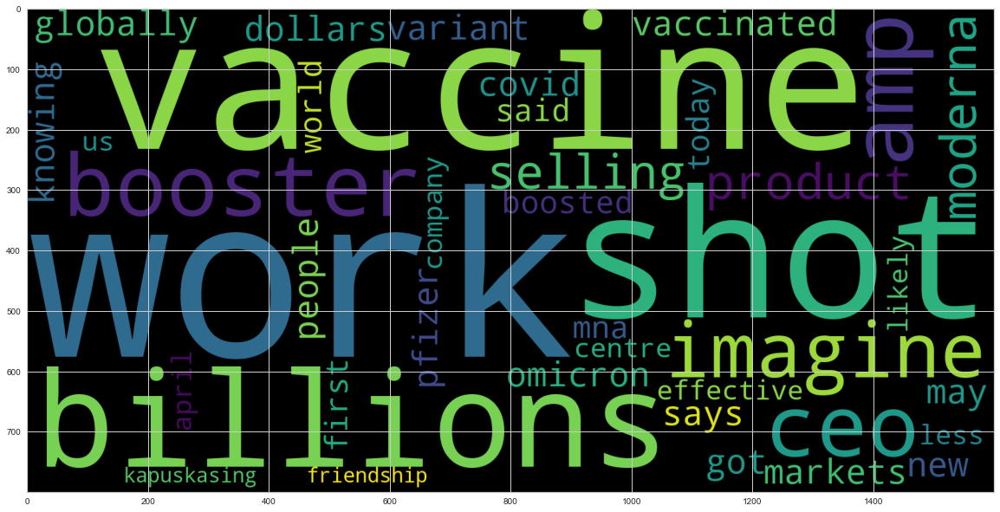

In [79]:
df = frequentWords(keyWord)

C:\Users\jaseb\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



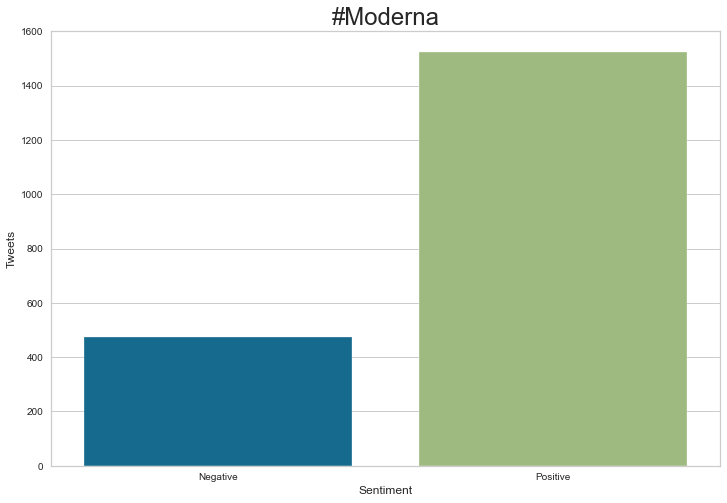

In [80]:
visual(df,keyWord)

Negative Words Word Cloud


Positive Words Word Cloud


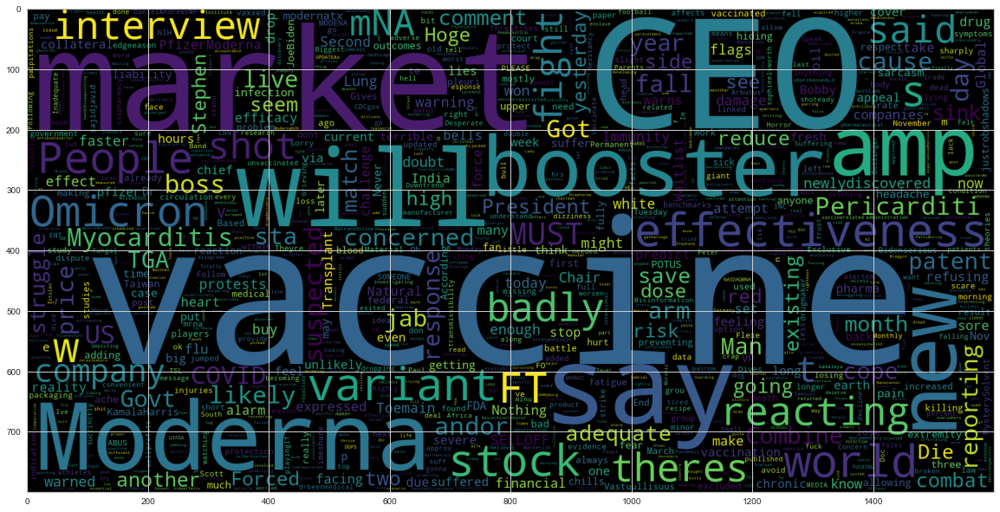

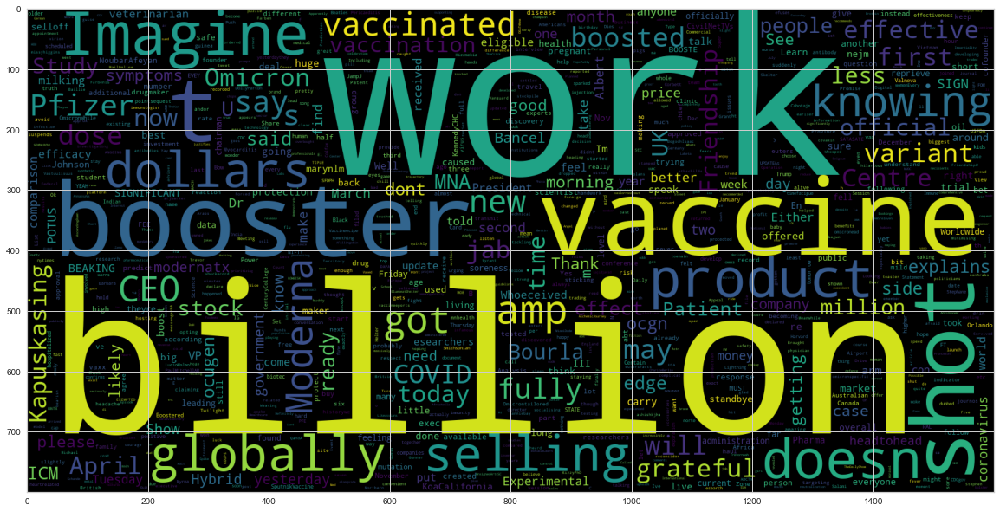

In [81]:
wordCloud(df)

In [82]:
tweetSource(df)

,source,count
0,Twitter for iPhone,594
1,Twitter Web App,588
2,Twitter for Android,549
3,Twitter for iPad,67
4,TweetDeck,47
5,Hootsuite Inc.,14
6,Instagram,13
7,Retweetteuse,10
8,Buffer,9
9,Tickeron,9


In [83]:
tweetLocation(df)

,location,count
0,location Unknown,623
1,United States,22
2,Australia,19
3,USA,18
4,Canada,15
5,"New York, NY",12
6,United Kingdom,12
7,Earth,11
8,London,11
9,India,11


In [84]:
tweetUser(df)

,screen_name,count
0,TrasElValle_OBC,15
1,jjaranaz94,11
2,AsianTigersJp,11
3,4Tchat,10
4,Tickeron,9
5,unreasonablelea,8
6,FiorediNotte33,7
7,vaccineflstate,7
8,Vastuullisuus,7
9,FluoridePoison,6


In [85]:
tweetsPerDay(df)

In [86]:
unigram_df=ngram_df(df['text'],(1,1),20)
bigram_df=ngram_df(df['text'],(2,2),20)
trigram_df=ngram_df(df['text'],(3,3),20)
displayNgram(unigram_df,bigram_df,trigram_df)

In [87]:
violinPLot(df)

Naive Bayes:
Train accuracy 92.56%
Test accuracy 77.50%
Accuracy Score:
0.775
Confusion Matrix:


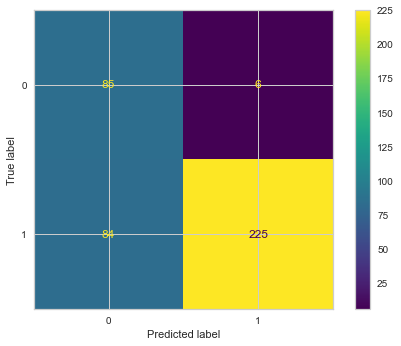

Classification Report:


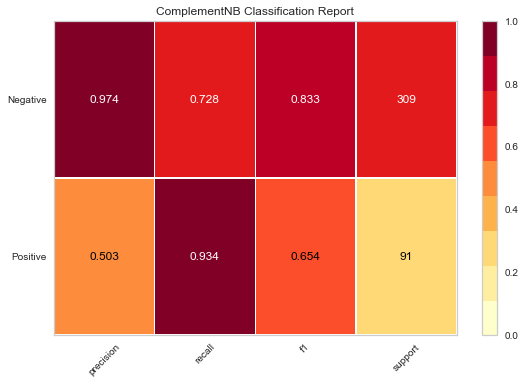



Random Forest Classification:
Train accuracy 76.00%
Test accuracy 77.25%
Accuracy Score:
0.7725
Confusion Matrix:


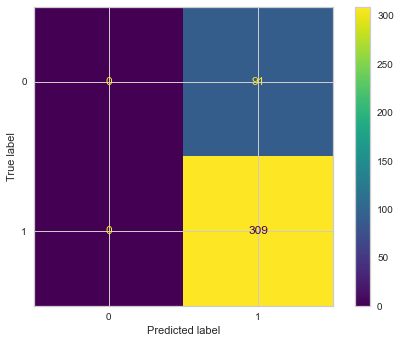

Classification Report:


C:\Users\jaseb\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



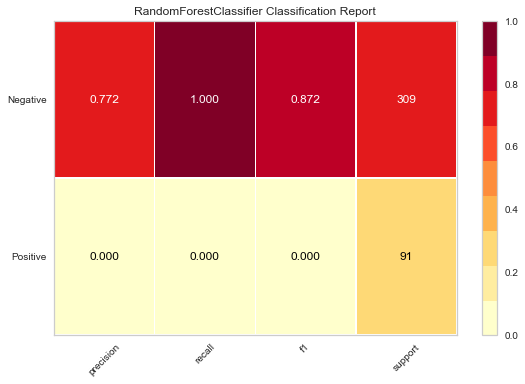



SVM:
Train accuracy 97.69%
Test accuracy 88.50%
Accuracy Score:
0.885
Confusion Matrix:


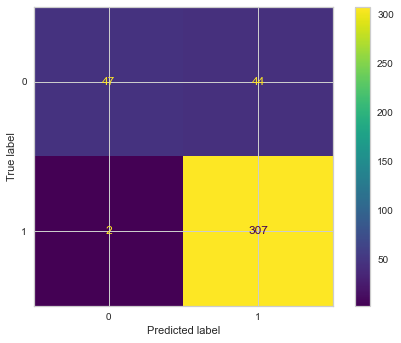

Classification Report:


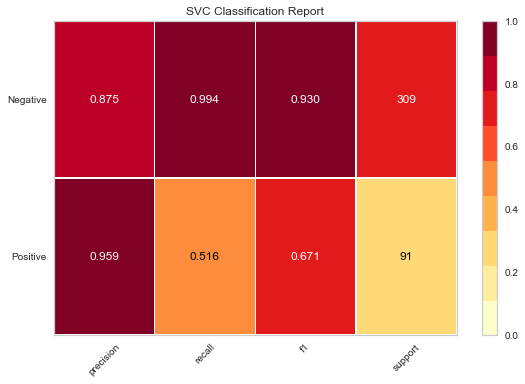

In [88]:
modelFile = modelPreparation(df)

In [89]:
testdf = df.iloc[0:10]
testdf

,Unnamed: 0,tweet id,time of tweet,user id,text,location,source,screen_name,Sentiment,After Stop word removal,tweet_date,text_length
0,0,1467260109298429953,2021-12-04 22:30:45,7350052,Boosted,"Mountain View, CA",Twitter for Android,yonatanb,1,boosted,2021-12-04,1
1,1,1467259875818418178,2021-12-04 22:29:49,1356004950803943425,Nothing to do with pfizer It MUST be It MUS...,location Unknown,Twitter for iPhone,j07060574,0,nothing pfizer must must must sarcasm …,2021-12-04,16
2,2,1467258332155158529,2021-12-04 22:23:41,1354163397412204544,Schande,location Unknown,Twitter Web App,Alayca8,1,schande,2021-12-04,1
3,3,1467257898015379460,2021-12-04 22:21:57,1083629018379898880,Northern Territory tyrant Michael Gunner fan...,location Unknown,Twitter for Android,go_howl,1,northern territory tyrant michael gunner fanni...,2021-12-04,17
4,4,1467255946137112576,2021-12-04 22:14:12,148193361,Womans Death After Dose of Spurs Concern Fr...,location Unknown,Twitter Web App,idreamquest,0,womans death dose spurs concern …,2021-12-04,9
5,5,1467253815325954049,2021-12-04 22:05:44,1458964768174350336,The antiBrexit brigade are pretty quiet now we...,🏴󠁧󠁢󠁥󠁮󠁧󠁿,Twitter for iPhone,_mike_drop_,1,antibrexit brigade pretty quiet seeing fascism...,2021-12-04,15
6,6,1467253633309945859,2021-12-04 22:05:01,2964161673,may be leading in vaccine efficacy,"North Carolina, USA",Twitter for iPhone,iche_me,1,may leading vaccine efficacy,2021-12-04,6
7,7,1467253214454198272,2021-12-04 22:03:21,18977284,Gotdang even Trevor Noah can smell something a...,USA,Twitter for Android,Don_Waan,1,gotdang even trevor noah smell something aint ...,2021-12-04,10
8,8,1467251118426128387,2021-12-04 21:55:01,1452080503582978048,Northern Territory tyrant Michael Gunner fan...,"Brisbane, Queensland",Twitter for iPhone,YesYoureAJoke,1,northern territory tyrant michael gunner fanni...,2021-12-04,17
9,9,1467245042041606152,2021-12-04 21:30:52,21697178,With the racing through the world I was lu...,"ÜT: 42.016272,-87.677505",Twitter for iPhone,Minion_Of_Pugs,1,racing world lucky enough get shot today,2021-12-04,15


In [90]:
testModel(modelFile,testdf)

ComplementNB()
Naive Bayes:
[1 0 1 1 0 0 1 1 1 0]


Random Forest Classification:
[1 1 1 1 1 1 1 1 1 1]


SVM:
[1 0 1 1 0 1 1 1 1 1]


<ipython-input-25-2cbef85a952f>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-25-2cbef85a952f>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Tweets related to Pfizer

In [28]:
keyWord = input("\nEnter Covid vaccine name:")
extractTweets(keyWord)


Enter Covid vaccine name:#Pfizer
Moderna vs. Pfizer... what first head-to-head vaccine analysis revealed... https://t.co/j1nr1nO0aL #CovidVaccine #Covid #Pfizer #Moderna
RT @miamalan: #VaccineRollOutSA stats: Fri, 3 Dec   

1. Jabs, 24 hrs: 147,147 (Thu: 153,240)
18+: 118,486
12-17: 28,661

2. All doses: 26,…
MODERNA INC: We entered a put option, $315.00 strike price, at 9:30 AM with a limit buy. We exited 4 hours later by… https://t.co/iyx4jMduck
RT @Fred_Parvaneh: Working on getting my #freetoaster 

#loyaltycard #pfizer #pfizervaccine #boostershot #omricon #covid19 https://t.co/zSH…
Working on getting my #freetoaster 

#loyaltycard #pfizer #pfizervaccine #boostershot #omricon #covid19 https://t.co/zSHajxHZWH
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @GrandviewKids: 💻 Grandview Kids &amp; @DurhamHealth will be hosting a virtual town hall this Monday, Dec. 6 from 8-9 p.m. and invite 

RT @miamalan: #VaccineRollOutSA stats: Fri, 3 Dec   

1. Jabs, 24 hrs: 147,147 (Thu: 153,240)
18+: 118,486
12-17: 28,661

2. All doses: 26,…
RT @chrismorrell: @peachypuk "Downing St Advisors" ... From #Pfizer the #WEF With shares in #GSK #JandJ 
the #UN etc the #Cabal
RT @Satoshi747: #beau #Omicron #COVID19 #Barca #Pfizer ....perhaps love will get us out of this sick divided  covid dictatorship...i hope s…
POLL: What does Big Pharma care more about?

#Pfizer #Moderna #AstraZeneca
@BogochIsaac I almost think this physician owns shares in #moderna and #Pfizer . We know so little about this… https://t.co/evCAr7MzTv
RT @jayghost71: Judge orders #pfizer and the #FDA to release documents concerning #Vaccine safety, The first document says thousands died a…
Nothing to do with @pfizer / #vaccines 
It MUST be #COVID19
It MUST be #Delta
It Must be #Omicron
(sarcasm)… https://t.co/hK4qj2jIXs
RT @amking0321: #Pfizer will NOT give shots to countries where they are held LIABLE for #VaccineSideEffect

RT @miamalan: #VaccineRollOutSA stats: Fri, 3 Dec   

1. Jabs, 24 hrs: 147,147 (Thu: 153,240)
18+: 118,486
12-17: 28,661

2. All doses: 26,…
RT @brendarossPPC: #Pfizer and #FDA by court order must release 500 Covid AE documents per month, 1st 3 months in Ontario:
1227 deaths
Amou…
RT @brendarossPPC: #Pfizer and #FDA by court order must release 500 Covid AE documents per month, 1st 3 months in Ontario:
1227 deaths
Amou…
🧐🧐🧐 #Pfizer and #FDA, I found a new excuse besides climate change 👀

#vaccinatieplicht #VaccineSideEffects… https://t.co/AsBwNMIv3Q
RT @miamalan: #VaccineRollOutSA stats: Fri, 3 Dec   

1. Jabs, 24 hrs: 147,147 (Thu: 153,240)
18+: 118,486
12-17: 28,661

2. All doses: 26,…
I will homeschool my children if i have to, they will NEVER be getting the pfizer vaccine 

#covid #pfizer #tga… https://t.co/Iszq5sshwd
#Pfizer and #FDA by court order must release 500 Covid AE documents per month, 1st 3 months in Ontario:
1227 deaths… https://t.co/i3yQthExdL
RT @miamalan: #VaccineRoll

@Scotus @FoxNews I think we need an investigation into all government officials that have stock in #Pfizer #Moderna… https://t.co/gN1c0Wn3mH
RT @silverbambino: Vichy #Macron seems to be planning a lot of #BoosterShots #Pfizer 
#Manifs4decembre
Food for thought: An Israeli doctor caugth #Omicron at  medical conference in London, Just one tested positive… https://t.co/BhLgYjuiBh
@POTUS @US_FDA I wonder y only certain drug companies r getting their vaccines approved. It appears their are some… https://t.co/kklSgwuUUf
RT @RightofcenterSw: Just a reminder to all my unvaxxed brothers and sisters. One day very soon we will be the ones who will have to care f…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
Just a reminder to all my unvaxxed brothers and sisters. One day very soon we will be the ones who will have to car… https://t.co/5FxA391y6c
#Pfizer 

I have just asked this question on my FB and a f

RT @WithyGrove: VIDEO: The Belgian Resistance 🇧🇪 : Firefighters demonstrating against mandatory jabs 💉 . https://t.co/Se9A3HGe38 #Belgium…
RT @NTbrians4Europe: #BorisJohnson on TV brandishing his #Pfizer #booster shot to praise the #NHS. Behind the scenes, he allows transgressi…
RT @UNICBeirut: Take the 3rd dose of #Pfizer this Saturday at the "Pfizer #Marathon".

Check the posters for more info about the timing &amp; l…
SARS-CoV-2 #vaccine from #Moderna better at stopping #infections than #Pfizer ... 

| #COVID19 | #Immunization |… https://t.co/flrCBsAcG4
🚌  The #COVID19 vaccine bus is offering the #Pfizer vaccine to anyone aged 16+ 

📣  The bus schedule may be subject… https://t.co/q1qjHLNOXj
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @mRNA_Death_Toll: 15 minutes after having the Pfizer toxic experimental shot Monique Morley started to have ‘heart palpitations’ yet doc…
RT @AreOhEssEye

Would @BorisJohnson or @sajidjavid like to comment on the #Pfizer #PfizerGates #Covid19 #Vaccine "Safety Report" fo… https://t.co/cRXJCnMIKI
RT @LakelifeMarie: Did you know Pfizer did zero studies on pregnant women before they started giving them vaccinations? They haven’t even b…
@MartinCJanssen We know that FDA wants to hide the #Pfizer mRNA data for 55 years. That should be telling in itself.
The vaccines are the virus!   #mRNA #Pfizer #Omicron #Delta
RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200 deaths during the 90 day period.👇
http…
RT @standtallnroar: And you’re being told by politicians to trust this company with your health… 

CHICAGO SUN TIMES Newspaper article feat…
RT @KondratieffWave: ...the death of a 5 year-old child due to #Pfizer CV19 vaccine: an unnecessary loss of life or a justifiable killing?…
#BlackLivesMatter #NickiMinaj #MAGA #2A #Alberta #Ontario #covid19 #corruption Wakey #science #sciencewins… https://t.c

@The_Real_Fly @thierrybaudet @MartinCJanssen @elonmusk @ellymelly @OzraeliAvi @ezralevant @holmenkollin… https://t.co/T11yJT2x9O
RT @JCConradson: 🚨BOMBSHELL🚨

"Confidential" PFIZER docs that were just released show #Pfizer's experimental #COVID19 vaccine caused OVER 1…
RT @JCConradson: Here is the chart showing a breakdown of the 42,000 adverse events

1223 fatal reactions to the #Pfizer #vaccination 

Whi…
RT @JCConradson: 🚨BOMBSHELL🚨

"Confidential" PFIZER docs that were just released show #Pfizer's experimental #COVID19 vaccine caused OVER 1…
@Peter_Fitz Facebook Fact Checker is an Inside Job By @thomsonreuters - #Pfizer #CEO is on Board of @Reuters… https://t.co/Ob5lGv2Fqt
A team of researchers from @harvardmed + @HarvardChanSPH recently published a study claiming the #Moderna vaccine i… https://t.co/S7xBlFR9Dj
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @JCConradson: Here is the char

RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @Puiyin: #Pfizer booster side effect... https://t.co/qtoMZI7U37
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
Booster shot! 💉💉

#PFizer https://t.co/g3m9PMK3xr
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
#Covid19 #Australia: #Pfizer vaccines could be approved for children as young as five before #Christmas |… https://t.co/ayNRvWIRs9
RT @maor_elad: What a mess! Came back from a conference in London. With a mask and 3 #Pfizer vaccines I managed to get #Omicron (case #3 in…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @SovernNation: Got my #COVID19 #Pfizer #Booster!

Hooray! The #Pfizer angels of mercy have brought forward the availability of the vax for kids 5-11. Christmas comes… https://t.co/v9qTsWSwjt
Guy in work told me that none of the @pfizer staff in #Netherlands are vaccinated? Very strange no? #Pfizer
RT @TheVoxWolf: Thoughts?
#VaccineDeaths #vaccines #Pfizer #BorisJohnson #vaccination https://t.co/qQBzvTu88R
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @AcademicLounge: #Pfizer Report&gt;side-effects
5.3.6 cumulative analysis of post-authorization adverse event
#pandemic #Pandemie #PassSani…
RT @LakelifeMarie: Did you know Pfizer did zero studies on pregnant women before they started giving them vaccinations? They haven’t even b…
RT @oldkhayyam: Why would #Pfizer need a “liability shield” if their vaccine is safe and effective?
The federal government has signed deals with #Pfizer and #Merck to purchase their #COVID19 antiviral medications, p…

@JoshuaShortTV @KDVR @KLNDenver

DEAD 15 y/o Male from COLORADO 2 Days after #Pfizer Jab 1.

Why didn't this make t… https://t.co/wtuhBoQCbr
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @The_SentineI: Horrendous. The murder machine marches on… #auspol #tga #pfizer

“COVID-19 vaccines for kids to be approved within days”…
RT @amking0321: #Pfizer will NOT give shots to countries where they are held LIABLE for #VaccineSideEffects https://t.co/UrPUcDbpMd
@JoshuaShortTV @KDVR DEAD 15 y/o Male from COLORADO 2 Days after #Pfizer Jab 1.

Why didn't this make the news? https://t.co/LFl2kpka2K
RT @JCConradson: 🚨BOMBSHELL🚨

"Confidential" PFIZER docs that were just released show #Pfizer's experimental #COVID19 vaccine caused OVER 1…
RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200 deaths during the 90 day period.👇
http…
RT @AlanAubutPPC: Here we go 

RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
Here we go .... CHILDREN DO NOT HAVE STROKES #Pfizer #Vaxtermination https://t.co/TxnrOMrWtz
RT @oldkhayyam: Why would #Pfizer need a “liability shield” if their vaccine is safe and effective?
Thousands facing heart problems due to ‘post-pandemic stress disorder’ | Evening Standard 🤣🤣🤣, #gtfoh so this why s… https://t.co/PkUEt7u6Sp
RT @BodyPROHIV: After the second dose of #Pfizer or #Moderna vaccines, both antibody levels and neutralization responses were significantly…
RT @GrandviewKids: 💻 Grandview Kids &amp; @DurhamHealth will be hosting a virtual town hall this Monday, Dec. 6 from 8-9 p.m. and invite Grandv…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200

RT @amking0321: #Pfizer will NOT give shots to countries where they are held LIABLE for #VaccineSideEffects https://t.co/UrPUcDbpMd
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200 deaths during the 90 day period.👇
http…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @maor_elad: What a mess! Came back from a conference in London. With a mask and 3 #Pfizer vaccines I managed to get #Omicron (case #3 in…
RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200 deaths during the 90 day period.👇
http…
@mattwridley Had first two jabs with #Pfizer then booster last week, also Pfizer. Have had no side effects  at all as far as I can tell.
RT @AreOhEssEyeEe: The #Pfiz

I'm glad I got my blogs done earlier. Today has been really hard to get through because of side-effects from the… https://t.co/Aq4E3EjCcT
RT @TheVoxWolf: Thoughts?
#VaccineDeaths #vaccines #Pfizer #BorisJohnson #vaccination https://t.co/qQBzvTu88R
RT @Jpana75: Ok.. we’ve seen international athletes dropping like flies; now we’ll start seeing the reports of completely normal heart cond…
RT @PaulJS2001: Pzfizer tried to make it 55 years before the trial data came out  here it is interesting #Pfizergate #Pfizer #PfizerLeak #V…
RT @LakelifeMarie: Did you know Pfizer did zero studies on pregnant women before they started giving them vaccinations? They haven’t even b…
RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200 deaths during the 90 day period.👇
http…
RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200 deaths during the 90 day period.👇
http…
RT @JeffereyJaxen: [1/2] After being sued...the

RT @goodvsevil2020: Pfizer documents saying THOUSANDS of people were killed by the jab in the first month! 
#Pfizer 
#FDA 
#Pfizergate http…
RT @JCConradson: Here is the chart showing a breakdown of the 42,000 adverse events

1223 fatal reactions to the #Pfizer #vaccination 

Whi…
RT @GrandviewKids: 💻 Grandview Kids &amp; @DurhamHealth will be hosting a virtual town hall this Monday, Dec. 6 from 8-9 p.m. and invite Grandv…
RT @JCConradson: 🚨BOMBSHELL🚨

"Confidential" PFIZER docs that were just released show #Pfizer's experimental #COVID19 vaccine caused OVER 1…
RT @Farnakyboy: 😊 I see protests and white red flags. No, this is not #Belarus!  People in  #Austria seem to have had enough from the force…
RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200 deaths during the 90 day period.👇
http…
#Pfizer is #Skynet. Retweet if you agree.
RT @goodvsevil2020: Pfizer documents saying THOUSANDS of people were killed by the jab in the first month! 


Rate limit reached. Sleeping for: 813


RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200 deaths during the 90 day period.👇
http…
#Moderna thanks for the ride, #Pfizer be gentle. #BoosterShots
The FDA warns about increased risk from #Pfizer’s drug #xeljanz. It is in circulation since 8 years and has full FD… https://t.co/lMXKOBzbFZ
RT @FluoridePoison: @JoshButler #Omicron was taken to #Israel by a TRIPLE Vaccinated person, #Pfizer sent 2 #Israeli doctors to Africa to c…
@JoshButler #Omicron was taken to #Israel by a TRIPLE Vaccinated person, #Pfizer sent 2 #Israeli doctors to Africa… https://t.co/xYolrSAYiW
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
“Based on everything I have seen so far,” Dr Albert Bourla #Pfizer CEO said yesterday, “I would say that annual vac… https://t.co/Yc9UsQV2ci
RT @Russ_Warrior: Over 42,000 Adverse Reaction Reports Revealed In First Batch Of #Pfizer Vax

RT @LakelifeMarie: Did you know Pfizer did zero studies on pregnant women before they started giving them vaccinations? They haven’t even b…
#Pfizer to #FDA: CUMULATIVE ANALYSIS OF POST-AUTHORIZATION ADVERSE EVENT REPORTS OF PF-07302048 (BNT162B2) RECEIVED… https://t.co/8A2AzFemmC
RT @rsbellmedia: TODAY ON THE RSB SHOW: #Canada hates kids, Jeff Rath, Govt overreach, Vaccine #exemptions, #Pfizer fraud, Post-pandemic #s…
RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200 deaths during the 90 day period.👇
http…
RT @LakelifeMarie: Did you know Pfizer did zero studies on pregnant women before they started giving them vaccinations? They haven’t even b…
RT @JCConradson: 🚨BOMBSHELL🚨

"Confidential" PFIZER docs that were just released show #Pfizer's experimental #COVID19 vaccine caused OVER 1…
RT @RNCrypto74: @BelvoirPLC That sounds reassuring.... or do they know things that can't see the light of day ?? #Pfizer #CovidVaccine #lia…
I wonder, wit

RT @LakelifeMarie: Did you know Pfizer did zero studies on pregnant women before they started giving them vaccinations? They haven’t even b…
RT @sarojpathi: Pfizer &amp; #Moderna vaccines used in UK as boosters give best overall boost response, according to a UK trial of 7 different…
RT @TheVoxWolf: Thoughts?
#VaccineDeaths #vaccines #Pfizer #BorisJohnson #vaccination https://t.co/qQBzvTu88R
RT @TheVoxWolf: Thoughts?
#VaccineDeaths #vaccines #Pfizer #BorisJohnson #vaccination https://t.co/qQBzvTu88R
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @FlorisStempel: #pfizer Court Orders FDA To Comply With FOIA and Release Information On Pfizer Vaccine - First Batch of Documents Shows…
RT @jayghost71: Judge orders #pfizer and the #FDA to release documents concerning #Vaccine safety, The first document says thousands died a…
Boosted, scooted and undisputed. Vaxed, waxed and ready for action etc. et

RT @Susi72607213: What on earth is going on? So many lies. This is an attempt to cover up the reality of the collateral damage of the V. #p…
RT @PaulJS2001: Pzfizer tried to make it 55 years before the trial data came out  here it is interesting #Pfizergate #Pfizer #PfizerLeak #V…
Done got that booster. #Pfizer https://t.co/ZcBeiwIxkr
RT @YoureAllDunces: Brook Jackson Interview - Pfizer Whistleblower Exposes Cover Up Calling Vaccine Data Into Question https://t.co/R7Zqpmi…
RT @LakelifeMarie: Did you know Pfizer did zero studies on pregnant women before they started giving them vaccinations? They haven’t even b…
RT @LakelifeMarie: Did you know Pfizer did zero studies on pregnant women before they started giving them vaccinations? They haven’t even b…
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @maor_elad: What a mess! Came back from a conference in London. With a mask and 3 #Pfizer vaccine

RT @JCConradson: 🚨BOMBSHELL🚨

"Confidential" PFIZER docs that were just released show #Pfizer's experimental #COVID19 vaccine caused OVER 1…
RT @TheVoxWolf: Thoughts?
#VaccineDeaths #vaccines #Pfizer #BorisJohnson #vaccination https://t.co/qQBzvTu88R
RT @TheVoxWolf: Thoughts?
#VaccineDeaths #vaccines #Pfizer #BorisJohnson #vaccination https://t.co/qQBzvTu88R
RT @JFN1971: Imagine selling a product globally for billions and billions of dollars that does NOT work…..and then knowing it doesn’t work…
RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200 deaths during the 90 day period.👇
http…
RT @TheVoxWolf: Thoughts?
#VaccineDeaths #vaccines #Pfizer #BorisJohnson #vaccination https://t.co/qQBzvTu88R
RT @MikeMaverick69: APPENDIX 1. LIST OF ADVERSE EVENTS OF SPECIAL INTEREST

10 pages of all the adverse reactions

10 FOOKIN PAGES

#Enough…
APPENDIX 1. LIST OF ADVERSE EVENTS OF SPECIAL INTEREST

10 pages of all the adverse reactions

10 FOOKIN PA

@talkRADIO @JuliaHB1 @benjaminbutter In the first few weeks alone thousands of people died due to the  Pfizer jab -… https://t.co/UnquSIz83Z
.@GSK has landed a coup, luring @pfizer’s vaccines R&amp;D chief away, as it tries to boost its presence in the #mRNA f… https://t.co/FicvDRAnGq
RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200 deaths during the 90 day period.👇
http…
RT @AreOhEssEyeEe: The #Pfizer docs that they tried to keep from the public for 55 years. 
Over 1200 deaths during the 90 day period.👇
http…
If you're hesitant to go into some countries because there's no liability shield for you, what does that say about… https://t.co/ob0vE2dirh
When it's time for another shot..the numbers go up...it's booster time that's why..
#COVID19
#EnoughIsEnough… https://t.co/J1smPOiQmW
#pfizer Court Orders FDA To Comply With FOIA and Release Information On Pfizer Vaccine - First Batch of Documents S… https://t.co/o9pmlwabfN
Why would @pfizer

More than 10.000 dead in the first three months. #Pfizer #BBCBreakfast #SkyNews #COVID19

When will you report the… https://t.co/6XYylbz67Y
These experimental jabs should stop NOW. Bourla's head NOW. #PfizerGate #Pfizer #PfizerExposed https://t.co/Uajad37aJ1
RT @Truth_Lovr: #Pfizer Documents Reveal Over 1,200 Vaccine Deaths Over 90-Day Trial Period (SEE THREAD⬇️)
#Pfizer and #Moderna being allowed to sell a product, mandatory is most of the world, that they wouldn't sell if th… https://t.co/gZWW8cRFNr
Heaven help us, and punish those who are perpetrating this global genocide. It is a crime against ALL humanity. Ric… https://t.co/5nHZ3YWUL7
#Pfizer @pfizer @AlbertBourla Enjoy! https://t.co/cFLvl1krOn
The time has come to decisively communicate that the COVID’s pandemic trajectory is ONE of endemic disease.… https://t.co/YPErBq7qlC
RT @RMiller79154074: More Die After Vaccination Than From #COVID19  in Taiwan Oct 13, 2021 #NoVaccinePassportsAnywhere #stoptheshot Taiwan’…
RT @TrueBLB: Holy

Pzfizer tried to make it 55 years before the trial data came out  here it is interesting #Pfizergate #Pfizer… https://t.co/1WkP9kN1Qt
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
Know the facts - vaccines don't prevent catching or spreading. They arguably don't even slow it down. However they… https://t.co/Mp91DnwKnO
RT @Truth_Lovr: #Pfizer Documents Reveal Over 1,200 Vaccine Deaths Over 90-Day Trial Period (SEE THREAD⬇️)
@OptionDrops Kiddo, this is hysterical. My BAM model predicted the $PFE MOMAMMOMU.
#AMCApes Take notes. Subscribe n… https://t.co/auBphGHiET
RT @LakelifeMarie: Did you know Pfizer did zero studies on pregnant women before they started giving them vaccinations? They haven’t even b…
RT @YoureAllDunces: Brook Jackson Interview - Pfizer Whistleblower Exposes Cover Up Calling Vaccine Data Into Question https://t.co/R7Zqpmi…
Pfizer Documents Reveal Over 1,200 Vaccine Deaths Over 

RT @TheOptionsApe: $PFE TO THE MOON 🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀#OptionsTrading #options #DayTrading #invest #Investment #investing #Robinhood #Pfi…
RT @TheOptionsApe: $PFE TO THE MOON 🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀#OptionsTrading #options #DayTrading #invest #Investment #investing #Robinhood #Pfi…
RT @HistoryVampyre: Anyone else feel like they got the flu after Covid shot? I just got my booster and feel so sick. #CovidVaccine #COVIDBo…
RT @TheOptionsApe: $PFE TO THE MOON 🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀#OptionsTrading #options #DayTrading #invest #Investment #investing #Robinhood #Pfi…
RT @TheOptionsApe: $PFE TO THE MOON 🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀🚀#OptionsTrading #options #DayTrading #invest #Investment #investing #Robinhood #Pfi…
#COVID19 #Pfizer #Coronavirus "Covid-19: Researcher blows the whistle on data integrity issues in Pfizer’s vaccine… https://t.co/kPvg73EJ6s
RT @pschemist: The #Pfizer and #ModernaBooster vaccines being used in the #UK as boosters give the best overall boost response, according t…
$PFE TO THE MO

RT @Farnakyboy: 😊 I see protests and white red flags. No, this is not #Belarus!  People in  #Austria seem to have had enough from the force…
@rupal2710 @RahulGandhi Guess #Pfizer s paid him, probably...
RT @berghain_B: 120 #children #hospitalized, province suspends #Pfizer #vaccine batch - VnExpress International

#covid #VerbrechenGegenDie…
Get your booster so you can boost the stock prices of #Moderna #Pfizer #Merck #JNJ together the #billionaires… https://t.co/qIwy5K4S0J
Uğur Şahin's outfit has been cooperating w/ #Pfizer to  develop mRNA-based flu vaccines since Aug 2018. 

These tri… https://t.co/1knX2OXzHZ
@cnni I want you to cover what was revealed in court yesterday - #pfizer tried to get the results of its vaccine tr… https://t.co/ye5HaYlv95
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @moridura: #Spectator 

"#Booster_jabs reduce the risk of getting #Covid by 93%, a study publis

RT @Farnakyboy: 😊 I see protests and white red flags. No, this is not #Belarus!  People in  #Austria seem to have had enough from the force…
RT @Farnakyboy: 😊 I see protests and white red flags. No, this is not #Belarus!  People in  #Austria seem to have had enough from the force…
RT @InTheChatTime: Chief of #Pfizer yesterday morning, spoke to @BBCNews,when asked about his part  in the have and the have nots; he basic…
RT @Raw_News1st: #BreakingNews #Breaking 
#Pfizer Boss, Dr. Fauci say vaccine shots may be needed every year
RT @Farnakyboy: 😊 I see protests and white red flags. No, this is not #Belarus!  People in  #Austria seem to have had enough from the force…
Pfizer &amp; #Moderna vaccines used in UK as boosters give best overall boost response, according to a UK trial of 7 di… https://t.co/5LXHugo2FZ
RT @LakelifeMarie: Did you know Pfizer did zero studies on pregnant women before they started giving them vaccinations? They haven’t even b…
RT @YoureAllDunces: Brook Jackson Intervi

RT @JCConradson: 🚨BOMBSHELL🚨

"Confidential" PFIZER docs that were just released show #Pfizer's experimental #COVID19 vaccine caused OVER 1…
RT @top_grafisch: Former Vice President of #Pfizer 
Dr. #MichaelYeadon shines the light of the truth on the #COVID19-variant (#b11529) scam…
RT @real_GGoswami: 🚨UPDATE🚨
As of 28th Nov:-
TGA (#Australia ) is investigating 2164 cases of suspected Myocarditis and/or Pericarditis fol…
6 #Vaccines Show Promise as #Boosters, Including #Pfizer and #Moderna

https://t.co/eQsFndQx5V
RT @Ev1HasAnOpinion: What else are these bastards hiding?

#Pfizer
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @devildogasher: Oh no - the far left is catching on . . . sorry #Moderna #Pfizer #Pfizergate https://t.co/Gbte5C6JLB
RT @YoureAllDunces: Brook Jackson Interview - Pfizer Whistleblower Exposes Cover Up Calling Vaccine Data Into Question https://t.co/R7Zqpmi…
RT @YoureAllD

#Pfizer #Fauci lied to all people‼️‼️
#VaccineSideEffects are the only effects 👉🏻Vaccine main effects ☠️‼️They we’r… https://t.co/kZ1YuA16Af
RT @myteaatom: Chairman of the @thomsonreuters Reuters Foundation is a #Pfizer investor and board member. In the last year alone, @Reuters…
RT @JCConradson: Here is the chart showing a breakdown of the 42,000 adverse events

1223 fatal reactions to the #Pfizer #vaccination 

Whi…
RT @Jpana75: Ok.. we’ve seen international athletes dropping like flies; now we’ll start seeing the reports of completely normal heart cond…
@pfizer once again is recommending the @CDCgov &amp; @US_FDA to approve booster shots for teens. So #Pfizer can continu… https://t.co/t35JXlZiMr
@freethought202 My Aunty 
Had 2 x #Pfizer 🤬
She wanted to travel (I asked her to wait until lockdowns finished bc… https://t.co/dgqZg8CeuM
#Pfizer vaccine protection after 90 days @CDCDirector
@WHCOS @VP @POTUS

https://t.co/0jSOzaAtH5
RT @real_GGoswami: 🚨UPDATE🚨
As of 28th Nov:-
TGA (#Austr

"6 different #COVID19 boosters are safe &amp; provoke strong immune responses in people dosed twice with either… https://t.co/y4xet2NH8s
RT @Jpana75: Ok.. we’ve seen international athletes dropping like flies; now we’ll start seeing the reports of completely normal heart cond…
Booster on weekend 🪨🔨🗿
#Pfizer
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
Six different #Covid -19 boosters are safe and elicit strong immune response in people who have previously received… https://t.co/19HOECto5D
RT @maor_elad: What a mess! Came back from a conference in London. With a mask and 3 #Pfizer vaccines I managed to get #Omicron (case #3 in…
@pfizer How many kids have you vaccinated with expired vaccine doses on trial? I asking because some officials said… https://t.co/0CTA1FT27R
RT @Jpana75: Ok.. we’ve seen international athletes dropping like flies; now we’ll start seeing the reports of completely norma

RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
#Boosterdose of six Covid vaccines safe, increases #immunity:#Lancet study
#COVID19 #CovidVaccine #BoosterShots… https://t.co/0JreudEWeT
RT @Jpana75: Ok.. we’ve seen international athletes dropping like flies; now we’ll start seeing the reports of completely normal heart cond…
RT @miamalan: LATEST #VaccineRollOutSA: Thu, 2 Dec   

1. Jabs, 24 hrs: 153,240 (We: 165,775)
18+: 121,774
12-17: 31,466

2. All doses: 26,…
now it is official, that even #Pfizer data shows it so damn unsafe, that they even couldn't hide it. What is going… https://t.co/IrN0f7H6nk
RT @YoureAllDunces: Brook Jackson Interview - Pfizer Whistleblower Exposes Cover Up Calling Vaccine Data Into Question https://t.co/R7Zqpmi…
RT @Jpana75: Ok.. we’ve seen international athletes dropping like flies; now we’ll start seeing the reports of completely normal heart cond…
RT @Jpana75: Ok.. 

In [29]:
eda(keyWord)

Data Frame head:


,tweet id,time of tweet,user id,text,location,source,screen_name
0,1467160337161932803,2021-12-04 15:54:17,363321854,Moderna vs Pfizer what first headtohead vaccin...,"Walnut Creek, California",Twitter Web App,BoomerBaby54
1,1467160029157634048,2021-12-04 15:53:04,22839557,stats Fri Dec Jabs hrs Thu All doses …,South Africa,Twitter for iPhone,RAITHFoundation
2,1467159808558125060,2021-12-04 15:52:11,3425797251,MODENA INC We entered a put option strike pri...,"New York, NY",Zapier.com,whale_tips
3,1467159766266834951,2021-12-04 15:52:01,726508902859186176,Working on getting my,NaN,Twitter for iPhone,dastan_project
4,1467159655763742723,2021-12-04 15:51:35,1230618108768833538,Working on getting my,"Los Angeles, CA",Twitter for iPhone,Fred_Parvaneh


Data Frame Tail:


,tweet id,time of tweet,user id,text,location,source,screen_name
1995,1466688364300566528,2021-12-03 08:38:50,300521129,Ok we’ve seen international athletes dropping ...,NaN,Twitter for iPhone,Jpana75
1996,1466687811294224386,2021-12-03 08:36:38,1395054863000690688,I was pro vax I had the vax Now my legs are d...,NaN,Twitter for Android,alwaysme9191
1997,1466687663268937732,2021-12-03 08:36:03,1414269835144540162,ff weer wat doorspitten knowledge is power,Alcala De Guadaira,Twitter Web App,anticovidiano74
1998,1466687256152915972,2021-12-03 08:34:26,1441117955878649873,SahariIvsa SizweLo Drobert Malone mna invento...,NaN,Twitter for iPhone,Jasmina78378291
1999,1466687005119721473,2021-12-03 08:33:26,1224912175,What on earth is going on So many lies This i...,NaN,Twitter for iPhone,mystyle2b


Shape of DataFrame:
(2000, 7)


Total tweets in this data: 2000
Total Unique Users in this data: 1762
Info of DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   tweet id       2000 non-null   int64 
 1   time of tweet  2000 non-null   object
 2   user id        2000 non-null   int64 
 3   text           2000 non-null   object
 4   location       1221 non-null   object
 5   source         2000 non-null   object
 6   screen_name    2000 non-null   object
dtypes: int64(2), object(5)
memory usage: 109.5+ KB
None


Data Types of DataFrame:
tweet id          int64
time of tweet    object
user id           int64
text             object
location         object
source           object
screen_name      object
dtype: object


Describe Dataframe:
           tweet id       user id
count  2.000000e+03  2.000000e+03
mean   1.466912e+18  6.002628e

,tweet id,time of tweet,user id,text,location,source,screen_name
0,1467160337161932803,2021-12-04 15:54:17,363321854,Moderna vs Pfizer what first headtohead vaccin...,"Walnut Creek, California",Twitter Web App,BoomerBaby54
1,1467160029157634048,2021-12-04 15:53:04,22839557,stats Fri Dec Jabs hrs Thu All doses …,South Africa,Twitter for iPhone,RAITHFoundation
2,1467159808558125060,2021-12-04 15:52:11,3425797251,MODENA INC We entered a put option strike pri...,"New York, NY",Zapier.com,whale_tips
3,1467159766266834951,2021-12-04 15:52:01,726508902859186176,Working on getting my,location Unknown,Twitter for iPhone,dastan_project
4,1467159655763742723,2021-12-04 15:51:35,1230618108768833538,Working on getting my,"Los Angeles, CA",Twitter for iPhone,Fred_Parvaneh


In [30]:
analyzeSentiment(keyWord)

,Unnamed: 0,tweet id,time of tweet,user id,text,location,source,screen_name,Sentiment
0,0,1467160337161932803,2021-12-04 15:54:17,363321854,Moderna vs Pfizer what first headtohead vaccin...,"Walnut Creek, California",Twitter Web App,BoomerBaby54,Positive
1,1,1467160029157634048,2021-12-04 15:53:04,22839557,stats Fri Dec Jabs hrs Thu All doses …,South Africa,Twitter for iPhone,RAITHFoundation,Positive
2,2,1467159808558125060,2021-12-04 15:52:11,3425797251,MODENA INC We entered a put option strike pri...,"New York, NY",Zapier.com,whale_tips,Negative
3,3,1467159766266834951,2021-12-04 15:52:01,726508902859186176,Working on getting my,location Unknown,Twitter for iPhone,dastan_project,Positive
4,4,1467159655763742723,2021-12-04 15:51:35,1230618108768833538,Working on getting my,"Los Angeles, CA",Twitter for iPhone,Fred_Parvaneh,Positive
...,...,...,...,...,...,...,...,...,...
1995,1995,1466688364300566528,2021-12-03 08:38:50,300521129,Ok we’ve seen international athletes dropping ...,location Unknown,Twitter for iPhone,Jpana75,Positive
1996,1996,1466687811294224386,2021-12-03 08:36:38,1395054863000690688,I was pro vax I had the vax Now my legs are d...,location Unknown,Twitter for Android,alwaysme9191,Negative
1997,1997,1466687663268937732,2021-12-03 08:36:03,1414269835144540162,ff weer wat doorspitten knowledge is power,Alcala De Guadaira,Twitter Web App,anticovidiano74,Positive
1998,1998,1466687256152915972,2021-12-03 08:34:26,1441117955878649873,SahariIvsa SizweLo Drobert Malone mna invento...,location Unknown,Twitter for iPhone,Jasmina78378291,Negative


            Word  Frequency of Word
0              ’                423
1              …                317
2        vaccine                311
3         pfizer                292
4       billions                257
5           docs                201
6          years                165
7           keep                143
8         deaths                143
9            day                137
10         tried                134
11        public                133
12       product                131
13       dollars                129
14       imagine                128
15       selling                128
16      globally                128
17      work…and                128
18       knowing                128
19         work…                128
20   periodhttp…                125
21          data                125
22          know                113
23         doses                 99
24         first                 97
25          safe                 90
26       booster            

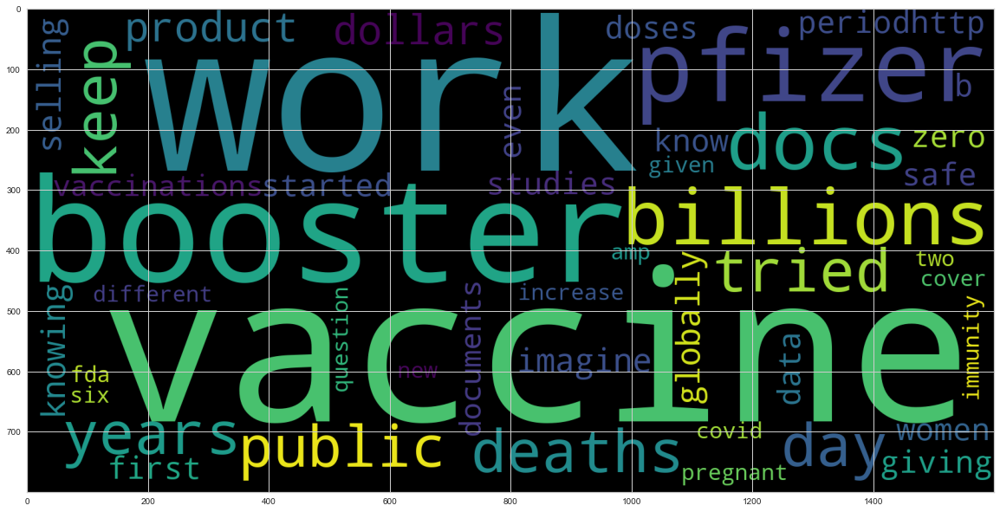

In [31]:
df = frequentWords(keyWord)

C:\Users\jaseb\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



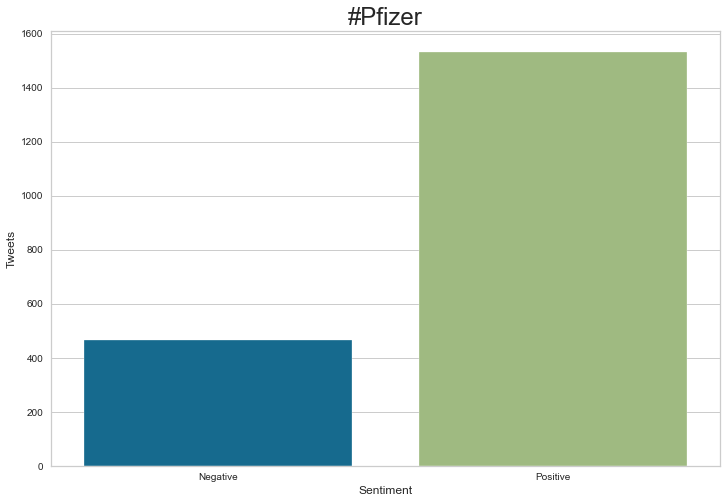

In [32]:
visual(df,keyWord)

Negative Words Word Cloud


Positive Words Word Cloud


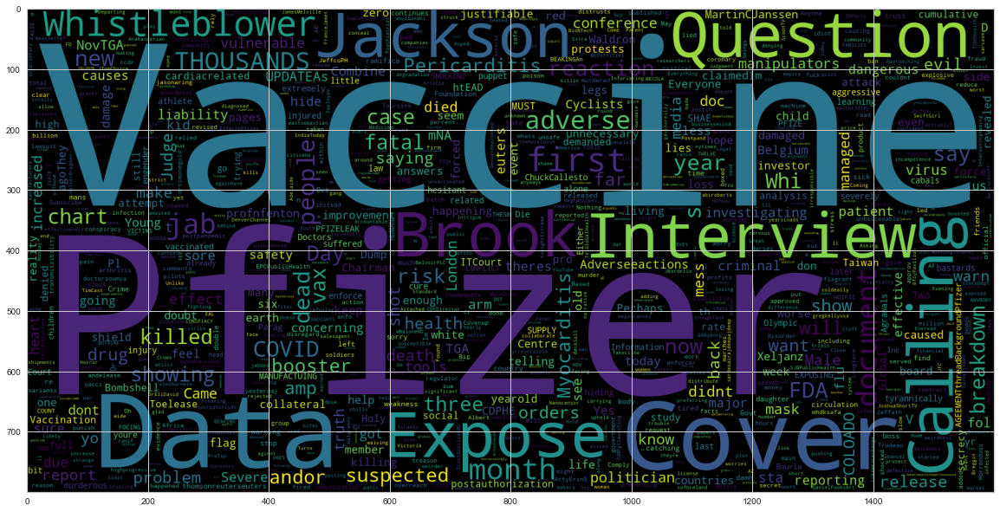

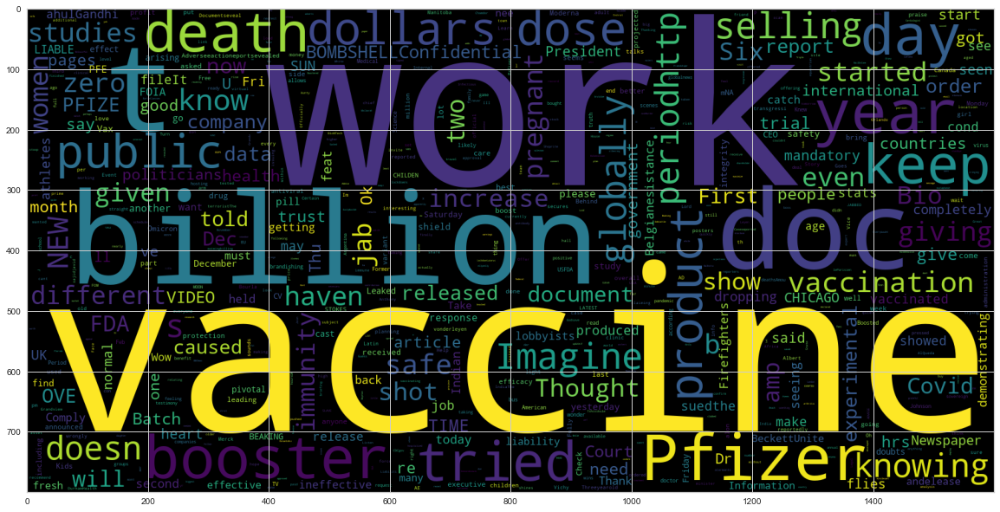

In [33]:
wordCloud(df)

In [34]:
tweetSource(df)

,source,count
0,Twitter Web App,634
1,Twitter for Android,622
2,Twitter for iPhone,571
3,Twitter for iPad,84
4,TweetDeck,19
5,Retweetteuse,11
6,TweetCaster for Android,7
7,Instagram,6
8,Buffer,6
9,WordPress.com,4


In [35]:
tweetLocation(df)

,location,count
0,location Unknown,779
1,Australia,24
2,United States,22
3,Canada,19
4,London,16
5,🍄🎸🥃West Of Here ❄🏂🌲,14
6,"London, England",14
7,"Miami, FL",12
8,UK,12
9,Belgium 🇧🇪🇪🇺,11


In [36]:
tweetUser(df)

,screen_name,count
0,Speemy,14
1,4Tchat,11
2,vaccineflstate,11
3,Farnakyboy,7
4,rose78787,6
5,mOvOmnivisiOn,6
6,PeterConstant,6
7,0xMinimalist,6
8,Johan44p,5
9,CallingVisser,5


In [37]:
tweetsPerDay(df)

In [38]:
unigram_df=ngram_df(df['text'],(1,1),20)
bigram_df=ngram_df(df['text'],(2,2),20)
trigram_df=ngram_df(df['text'],(3,3),20)
displayNgram(unigram_df,bigram_df,trigram_df)

In [39]:
violinPLot(df)

Naive Bayes:
Train accuracy 94.50%
Test accuracy 83.75%
Accuracy Score:
0.8375
Confusion Matrix:


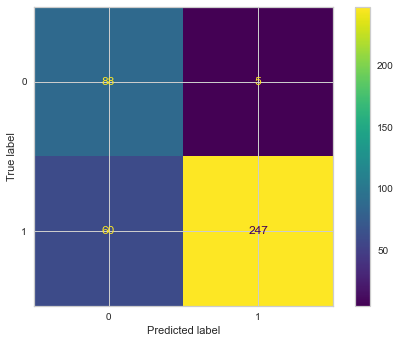

Classification Report:


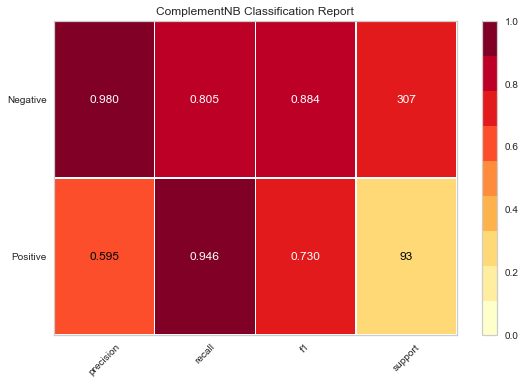



Random Forest Classification:
Train accuracy 76.62%
Test accuracy 76.75%
Accuracy Score:
0.7675
Confusion Matrix:


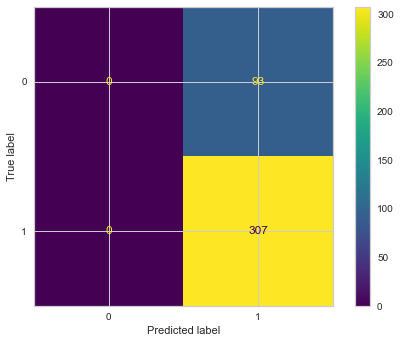

Classification Report:


C:\Users\jaseb\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



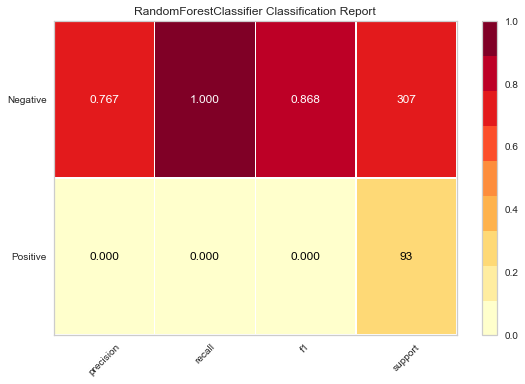



SVM:
Train accuracy 98.81%
Test accuracy 92.50%
Accuracy Score:
0.925
Confusion Matrix:


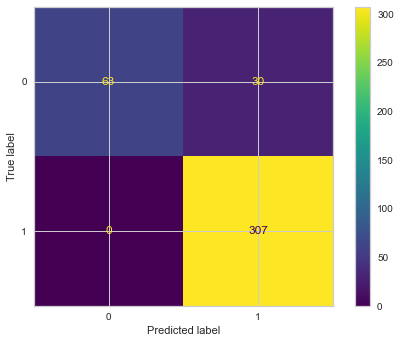

Classification Report:


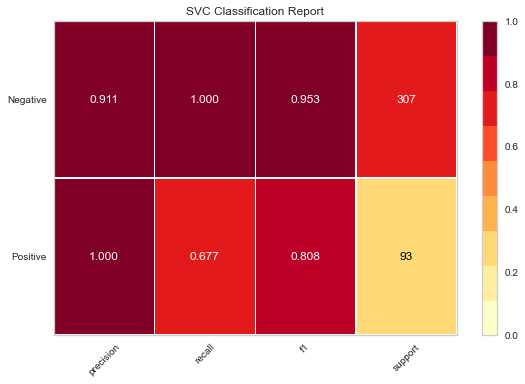

In [40]:
modelFile = modelPreparation(df)

In [41]:
testdf = df.iloc[0:10]
testdf

,Unnamed: 0,tweet id,time of tweet,user id,text,location,source,screen_name,Sentiment,After Stop word removal,tweet_date,text_length
0,0,1467160337161932803,2021-12-04 15:54:17,363321854,Moderna vs Pfizer what first headtohead vaccin...,"Walnut Creek, California",Twitter Web App,BoomerBaby54,1,moderna vs pfizer first headtohead vaccine ana...,2021-12-04,9
1,1,1467160029157634048,2021-12-04 15:53:04,22839557,stats Fri Dec Jabs hrs Thu All doses …,South Africa,Twitter for iPhone,RAITHFoundation,1,stats fri dec jabs hrs thu doses …,2021-12-04,9
2,2,1467159808558125060,2021-12-04 15:52:11,3425797251,MODENA INC We entered a put option strike pri...,"New York, NY",Zapier.com,whale_tips,0,modena inc entered put option strike price lim...,2021-12-04,20
3,3,1467159766266834951,2021-12-04 15:52:01,726508902859186176,Working on getting my,location Unknown,Twitter for iPhone,dastan_project,1,working getting,2021-12-04,4
4,4,1467159655763742723,2021-12-04 15:51:35,1230618108768833538,Working on getting my,"Los Angeles, CA",Twitter for iPhone,Fred_Parvaneh,1,working getting,2021-12-04,4
5,5,1467158871408005120,2021-12-04 15:48:28,40557226,NEW—Six different boosters are safe and incr...,Washington DC,Twitter for iPhone,lgcuervoamore,1,new—six different boosters safe increase immun...,2021-12-04,16
6,6,1467158772699340804,2021-12-04 15:48:04,495518357,Grandview Kids amp DurhamHealth will be host...,Durham Region,Twitter for Android,SunstrumMa,1,grandview kids amp durhamhealth hosting virtua...,2021-12-04,19
7,7,1467158667338428420,2021-12-04 15:47:39,1254473504273072130,Walkin clinic at Silsden Medical Centre tomorr...,location Unknown,Twitter Web App,AwcModality,1,walkin clinic silsden medical centre tomorrow ...,2021-12-04,19
8,8,1467158330502168578,2021-12-04 15:46:19,490328587,…claiming the vaccine is slightly better than,Brugge,Twitter for iPad,avcvdb,1,…claiming vaccine slightly better,2021-12-04,7
9,9,1467157147989467149,2021-12-04 15:41:37,1179809116371456000,VIDEO The Belgianesistance Firefighters dem...,"England, United Kingdom",Twitter for iPhone,Shazzie_L,1,video belgianesistance firefighters demonstrat...,2021-12-04,9


In [42]:
testModel(modelFile,testdf)

ComplementNB()
Naive Bayes:
[0 1 0 1 1 1 1 1 1 1]


Random Forest Classification:
[1 1 1 1 1 1 1 1 1 1]


SVM:
[1 1 0 1 1 1 1 1 1 1]


<ipython-input-25-2cbef85a952f>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-25-2cbef85a952f>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Tweets related to Covaxin

In [91]:
keyWord = input("\nEnter Covid vaccine name:")
extractTweets(keyWord)


Enter Covid vaccine name:#Covaxin
RT @SeanOCo35477166: @GuyCreal @POTUS Everyone knows that Pfizer ponies up tens of millions to buy approval @US_FDA every year. They paid 6…
RT @B1llyTh2K3d: It truly says something that troves of people around the world want #COVAXIN @BharatBiotech not just citizens in the US. P…
RT @SenguptaShomi: @DurgeshKhedeka2 @AmbLindnerIndia The uncertainty related to this matter is really not acceptable after who's approval.…
RT @BatJordan: I spent 30 years of my life serving communities and this Country.  It kind of itches me the wrong way when I see injustice a…
RT @ElmoBlatch03: #CovidVaccine #COVAXIN a traditional vaccine for #Covid_19 . Currently has 10 peer reviewed publications to support its s…
We have lost our goddamned minds! #COVAXIN IT WONT KILL YOU IN THE WINTER! https://t.co/EsbkoVfV1e
I think @Ocugen will surprise investors with a huge smile this upcoming week. #Covaxin
One of the duties/responsibilites: 

- Utilize data analysis to establish s

@DrTomori #Covaxin Whole-Virion Inactivated SARS-CoV-2 Vaccine (BBV152). Safe.
@Boghuma #Covaxin Whole-Virion Inactivated SARS-CoV-2 Vaccine (BBV152). Safe.
@CNET I’d like to get #Covaxin, a traditional(non mRNA) vaccine alternative, similar to the Polio vaccine in use fo… https://t.co/zarTsGMfmK
@DataDrivenMD #Covaxin Whole-Virion Inactivated SARS-CoV-2 Vaccine (BBV152). Safe.
RT @B1llyTh2K3d: You're crazy if you think the government isn't already involved in #COVAXIN $OCGN https://t.co/3OOyKvBgBm
@Laurel_BC #Covaxin Whole-Virion Inactivated SARS-CoV-2 Vaccine (BBV152). Safe.
@LCasalino88 #Covaxin Whole-Virion Inactivated SARS-CoV-2 Vaccine (BBV152). Safe.
@DataDrivenMD #Covaxin Whole-Virion Inactivated SARS-CoV-2 Vaccine (BBV152). Safe.
@angusreidforum #Covaxin Whole-Virion Inactivated SARS-CoV-2 Vaccine (BBV152). Safe.
@ANI #Covaxin Whole-Virion Inactivated SARS-CoV-2 Vaccine (BBV152). Safe.
@ClaysonMonyela @OfficialMasisi #Covaxin Whole-Virion Inactivated SARS-CoV-2 Vaccine (BBV152

RT @SeanOCo35477166: @US_FDA @pfizer @POTUS @RandPaul @RepThomasMassie @FoxNews @CNN @EpochTimes India has 4x the population of America &amp; 1…
RT @bhvml: Covaxin may have edge over Covishield in tackling Omicron: Experts @BharatBiotech #Omicron #Omicronindia  #COVID19 #SARSCoV2 #co…
RT @jacksawtrader: we have a lot of people in America waiting on #COVAXIN just so you know incase you were unaware @US_FDA @CDCgov @NIH and…
Shades of WHO... "addt'l info has been requested." Why is @CDSCO_INDIA_INF delaying approval of Covaxin for kids 2… https://t.co/tyhXhL7JSM
@GovCanHealth @YourAlberta @CanadianPM 

What happens when the gig is up

 and everyone doesnt want to take a y of… https://t.co/qufKUiSW8T
RT @elephunk101: "Those Who Took #Covaxin Don't Have to Worry About #Omicron, Here's Why:"

 #Vaccigen #HealthCanada @WHO $ocgn $ocugen #oc…
Do you want to be protected from the oMI variant? Non mRNA - does not use fetal tissue and has been given to 250 mi… https://t.co/r1zDUMA7SY
RT @Average

The Reaction of People who got Covishield after reading Covaxin is more effective against Omicron...… https://t.co/wcQj0D9zyD
RT @B1llyTh2K3d: Friday close to Monday open $OCGN #COVAXIN 

All on news of approval-of-use in a completely different country. https://t.c…
RT @B1llyTh2K3d: Friday close to Monday open $OCGN #COVAXIN 

All on news of approval-of-use in a completely different country. https://t.c…
Covaxin may have edge over Covishield in tackling Omicron

#covaxin  https://t.co/ZUyNYqNui6
Ahhaha approve @Ocugen /@BharatBiotech  #COVAXIN that’s @WHO approved and u won’t have these issues!!!… https://t.co/LXoVEmRMny
@US_FDA @FDA Why have you folks halted the ONLY effective vaccine against Delta, #Covaxin ?? The answer: @US_FDA is… https://t.co/2CYPuTRCub
RT @RockStarPreach: Covid-19: Covaxin may be more effective against new variant, says ICMR $OCGN #COVAXIN  https://t.co/G7DHSCe94e
RT @DrSwatiShow: Increasing production of Covaxin is critical @apnnewsindia #covaxin #Omicron #Omic

45+ #URBAN #Bengaluru #CovidVaccine Availability for 04/12 at 04:30PM
FREE Slots 0
PAID Slots 
#COVISHIELD - Dose1:… https://t.co/YCIeRwKYLm
@DrTedros @WHO @UN_PGA #COVAXIN it's so obvious !!!!
RT @Babyyyoddaa: @NavroopSingh_ My last dose (2nd) covaxin was on 8th June 2021.After 6 months see the result .I dnt think we need booster.…
RT @drankitgupta37: The potential for greatness and making a change lives within each of us. Today, all that is required to make a change i…
RT @drankitgupta37: The potential for greatness and making a change lives within each of us. Today, all that is required to make a change i…
RT @MeghBulletin: Canada will allow entry to persons vaccinated with #COVAXIN vaccine from today.
@tariqtramboo Can you share the antibodies details of anyone who has taken the #COVAXIN booster jab
It’s high time to focus on developing whole virus 🦠 particle vaccines. The current vaccines are just a part of the… https://t.co/iCq07cFJ0N
18-44 #BBMP #Bengaluru #CovidVaccine Availabi

RT @AverageJoe143: @POTUS Still with all vax Jabs we still get covid whats does it tell you mrna does not work that good 3rd, 4th 5th how m…
45+ #BBMP #Bengaluru #CovidVaccine Availability for 04/12 at 12:30PM
FREE Slots 0
PAID Slots 
#COVISHIELD - Dose1:5… https://t.co/34gE40KHJ3
45+ #URBAN #Bengaluru #CovidVaccine Availability for 04/12 at 12:30PM
FREE Slots 0
PAID Slots 
#COVISHIELD - Dose1:… https://t.co/8WjkzKUHZU
RT @B1llyTh2K3d: Remember when it comes time to vote, these 3 @RandPaul @RepThomasMassie @LeaderMcConnell 
Want you to LITERALLY DIE $OCGN…
RT @jacksawtrader: here we are, almost a year later the @NIH helps co-develop #COVAXIN with an amazing adjuvant helping increase its overal…
RT @steved76152722: @RepThomasMassie @pikesrevenge @jacksawtrader To, many, sir, this is literally about saving lives not tickets. Mention…
RT @drankitgupta37: The potential for greatness and making a change lives within each of us. Today, all that is required to make a change i…
RT @drankitgupt

RT @jacksawtrader: @RepThomasMassie we need you to push for approval of #COVAXIN if you want to be a representative that goes down in histo…
RT @srijanpalsingh: If you were to ask me now which vaccine to take.. it would be #COVAXIN 

All other vaccines are using spike protein to…
RT @BatJordan: I spent 30 years of my life serving communities and this Country.  It kind of itches me the wrong way when I see injustice a…
RT @india_narrative: Made in India 🇮🇳 #Covaxin is a whole virion-inactivated vaccine 💉. It covers the entire virus, so it can work against…
RT @jras98: USA would benefit even more if they allowed #Covaxin to be used here!
RT @mikalche: Now that the FDA application will be DELAYED for $NVAX the ONLY vaccine that is available is #COVAXIN $OCGN. @B1llyTh2K3d 

B…
RT @MeghBulletin: Canada will allow entry to persons vaccinated with #COVAXIN vaccine from today.
RT @elephunk101: "Covishield, #Covaxin can act against new variant: Experts"

Read more at:
https://t.co/nPZ21P6pzA



RT @ElmoBlatch03: Why is it that we do not have one traditional #CovidVaccine option in the #USA ? #COVAXIN is ready. Wouldn’t we want the…
RT @xanracketboyfan: @NIHDirector @POTUS Hopefully President Biden understands now that there's a vaccine available and ready to bring back…
@MSNBC #Covaxin is a traditional(non mRNA) vaccine alternative, like the Polio vaccine, that’s been administered to… https://t.co/oRGCwXGc8O
RT @bert070784: @NIH @POTUS India 🇮🇳  flatten the curve while we still have 2000+ people dying everyday . We deserve better , we deserve #C…
18-44 #BBMP #Bengaluru #CovidVaccine Availability for 04/12 at 07:00AM
FREE Slots 
#COVISHIELD - Dose1:8609, Dose2:… https://t.co/12Am98Ng5v
18-44 #URBAN #Bengaluru #CovidVaccine Availability for 04/12 at 07:00AM
FREE Slots 0
PAID Slots 
#COVISHIELD - Dose… https://t.co/gOzVzUGyoL
18-44 #RURAL #Bengaluru #CovidVaccine Availability for 04/12 at 07:00AM
FREE Slots 
#COVISHIELD - Dose1:107, Dose2:… https://t.co/JwHmcZ1DpY
RT @bert070784

Rate limit reached. Sleeping for: 628


RT @FullTimeDreamir: @NIHDirector @POTUS I sincerely hope #Covaxin was discussed!
RT @Gustavo74001799: @NIHDirector @POTUS SIR PLEASE HELP SAVE THE USA, You know #COVAXIN IS THE SOLUTION 👍🏽
@NIHDirector @POTUS Hope you filled him in about miracle Vax #covaxin. We know you know!!
RT @SeanOCo35477166: @NIHDirector @POTUS Dr. Collins, tens of millions of Americans want #COVAXIN for themselves as well as their children.…
RT @Gustavo74001799: @NIHDirector @POTUS SIR PLEASE HELP SAVE THE USA, You know #COVAXIN IS THE SOLUTION 👍🏽
RT @AwComputers: @Ocugen #COVAXIN  news come on
RT @DustinNorstedt: @NIHDirector @POTUS we need #Covaxin, now!
RT @B1llyTh2K3d: "If you know..." $OCGN #COVAXIN 

Things take time. We are at the finish line. https://t.co/Njnn5kYBCt
RT @VotraV: @TodayHeadline42 #covaxin is best vaccine administered to 130 million people and works better for omicron as per scientific res…
@jerryTh10163886 @JesseKellyDC #covaxin is best vaccine administered to 130 million people and work

RT @CraigGordon8: @POTUS #Covaxin is the only vaccine that was clinical test results for the Delta Variant @US_FDA @CDCgov @CDCDirector @NI…
RT @B1llyTh2K3d: And for anyone who thinks me going after these 3 @RandPaul @RepThomasMassie @LeaderMcConnell will do anything negative for…
RT @B1llyTh2K3d: We'll get our endorsements for #COVAXIN don't you worry. And it won't come from people who claim to be smart @RandPaul @Re…
RT @B1llyTh2K3d: Remember when it comes time to vote, these 3 @RandPaul @RepThomasMassie @LeaderMcConnell 
Want you to LITERALLY DIE $OCGN…
RT @B1llyTh2K3d: These 3 @RandPaul @RepThomasMassie @LeaderMcConnell 

Actively want you to die from COVID. Remember that when all is said…
RT @B1llyTh2K3d: This absolute scum @RepThomasMassie will tweet and retweet ALL DAMN DAY while your taxpayer dollars pay him to do so and h…
RT @HieuTrantheMAN: This is why I feel we need to speak up to the corruptions in our country! Bloomberg got bought out by Pfizer and their…
RT @HieuTrantheM

These 3 @RandPaul @RepThomasMassie @LeaderMcConnell 

Actively want you to die from COVID. Remember that when all i… https://t.co/E6VlxSBSjO
RT @B1llyTh2K3d: This absolute scum @RepThomasMassie will tweet and retweet ALL DAMN DAY while your taxpayer dollars pay him to do so and h…
RT @B1llyTh2K3d: Oh hey look at you go @RepThomasMassie 

STILL pushing for "natural immunity" 

Those hundreds of deaths everyday... Where…
This absolute scum @RepThomasMassie will tweet and retweet ALL DAMN DAY while your taxpayer dollars pay him to do s… https://t.co/cZHMlHDlVD
RT @B1llyTh2K3d: We'll get our endorsements for #COVAXIN don't you worry. And it won't come from people who claim to be smart @RandPaul @Re…
@RepThomasMassie And by the way, #COVAXIN is NOT a ticker.
RT @IndiaSpend: “Inactivated virus vaccines like #Covaxin may be more protective against a variant with spike protein mutations as they’d h…
RT @elephunk101: "Why #Covaxin May be More Effective Against #Omicron than Other #Vaccines"

#V

RT @Itallmakesens: @GovCanHealth Only the inactivated vaccines like #COVAXIN which have a much broader exposure because they are using the…
@potus &amp; @US_FDA we NEED safe vaccine options, and now for under 5 as indicated below. #COVAXIN has been safely adm… https://t.co/Dd6Wh7MOGc
@GovCanHealth Only the inactivated vaccines like #COVAXIN which have a much broader exposure because they are using… https://t.co/EDhfSgFXDU
@GovCanHealth Only the inactivated vaccines like #COVAXIN which have a much broader exposure because they are using… https://t.co/ZvjNu4XAnm
@GovCanHealth Only the inactivated vaccines like #COVAXIN which have a much broader exposure because they are using… https://t.co/y9prnHM1qL
@GovCanHealth Only the inactivated vaccines like #COVAXIN which have a much broader exposure because they are using… https://t.co/XXjbF2zrjP
@GovCanHealth Only the inactivated vaccines like #COVAXIN which have a much broader exposure because they are using… https://t.co/16x8qbgRsg
@GovCanHea

Stop the #BigPharmacorruption  #vaccineracism #savelivesnotmoney #killsallvariants #covaxinapproval  @US_FDA… https://t.co/KSNdKRo7GZ
RT @mikalche: $OCGN WHAT A FANTASTIC PRICE FOR THIS GIFT. #OCGN #OCUGEN #COVAXIN https://t.co/zR8MqnGneZ
Why is it that we do not have one traditional #CovidVaccine option in the #USA ? #COVAXIN is ready. Wouldn’t we wan… https://t.co/pYyidMXnbK
RT @B1llyTh2K3d: More from the vault. $OCGN #COVAXIN 

Almost 5 months ago, our current situation was predicted here. "Raises concerns of p…
@smerconish Any lock down measures the US may choose to employ should not be passed until there are more vaccine ch… https://t.co/23AqtKiX8c
RT @DilSe_Nice: Indian's Govt should take necessary steps and start a program, so that NRI, Indian living and working abroad, can take Made…
@GOPLeader Why are the powers to be bending over backwards for the mRNA shots that are proving to be less and less… https://t.co/SYSe8oYDF4
@RepDonaldsPress @kimKBaltimore Why are the powers to be 

@US_FDA #COVAXIN #COVAXIN #COVAXIN #COVAXIN #Covaxinapproval #COVAXIN American parents will NOT be jabbing their ch… https://t.co/ssB6eJpPef
RT @B1llyTh2K3d: Things are a-changing $OCGN #COVAXIN https://t.co/JhVwWVqQfY
RT @JayWHDH: $OCGN #Covaxin NEWS

@FDA prepares for quick review of omicron vaccines, drugs, WSJ says

Five states in U.S., including NY an…
. @nytimes #omicron prompts swift reconsideration of boosters among scientists #Covaxin @ocugen $ocgn… https://t.co/sxnArPBj1c
@US_FDA You corrupt scoundrels need to dig deep, dig out whatever might be left resembling integrity, &amp; approve the… https://t.co/S5kVbYgJWu
RT @JayWHDH: $OCGN #Covaxin NEWS

@FDA prepares for quick review of omicron vaccines, drugs, WSJ says

Five states in U.S., including NY an…
RT @RockStarPreach: #COVAXIN $OCGN 
Only ONE Vax was asked by the ⁦@US_FDA⁩ to conduct LIVE TESTING ON DELTA. #COVAXIN IS FORMULATED FOR VA…
@US_FDA @POTUS @RandPaul @RepThomasMassie @FoxNews @CNN @Ocugen @BharatBiotech #COVAXI

RT @B1llyTh2K3d: White-board sh*t $OCGN #COVAXIN 
Because of COVID's ability to screw with ur T-cells, this was likely one of the main reas…
RT @B1llyTh2K3d: "If you know..." $OCGN #COVAXIN 

Things take time. We are at the finish line. https://t.co/Njnn5kYBCt
RT @Amy07330614: Hoping #Covaxin will be here soon! @CNBC @CNN @FoxNews @jimcramer @ABC  
Might have a new vaccine soon- we’ll see✅✅✅🇺🇸👏🏻 $…
RT @B1llyTh2K3d: Folder upon folder of DD that I've sat on simply because it's redundant to share when it all points to the same ultimate o…
RT @44mozart: #OCGN #COVAXIN  IMPRESSIVE https://t.co/4oLWGMQjHM
RT @Amy07330614: I wonder if #COVAXIN will get @BARDA ??  @Ocugen $OCGN
RT @Mayelinthegoat: I have a dream that one day we will be covid free #COVID19 #COVAXIN #VaccineEquity #OmicronVariant @Ocugen @WHO @POTUS…
RT @elephunk101: "Why #Covaxin May be More Effective Against #Omicron than Other #Vaccines"

#Vaccigen #HealthCanada @WHO $ocgn $ocugen #oc…
RT @nodude504_fox: ✅Lets keep spreading

$OCGN U.S. FDA aiming for speedy review of Omicron vaccines and drugs - WSJ #COVAXIN https://t.co/6gZ79NSE4q
RT @B1llyTh2K3d: White-board sh*t $OCGN #COVAXIN 
Because of COVID's ability to screw with ur T-cells, this was likely one of the main reas…
RT @Amy07330614: I wonder if #COVAXIN will get @BARDA ??  @Ocugen $OCGN
RT @elephunk101: "Why #Covaxin May be More Effective Against #Omicron than Other #Vaccines"

#Vaccigen #HealthCanada @WHO $ocgn $ocugen #oc…
RT @MCWhiteowl: Dear @US_FDA 

Please support U.S. Citizens &amp; help the 🌎 @BharatBiotech @Ocugen 
#Covaxin vs #Omicron 
Covaxin = Safe &amp; Eff…
RT @B1llyTh2K3d: "If you know..." $OCGN #COVAXIN 

Things take time. We are at the finish line. https://t.co/Njnn5kYBCt
Join Localwaala and explore your locality with us. 

https://t.co/KdhZb2NywB

#covid #share #help #helpeachother… https://t.co/nUvqnDOIot
RT @dravirmani: 2/ksi #Omicorn the #Ksi (spelled #Xi) variant of the #Wuhan #Virus will be #trumped by #Covaxin 😎
✅Lets keep sprea

RT @SenguptaShomi: @DrSJaishankar Respected sir, can you please help us with any kind of update of Covaxin approval status in Germany? Many…
RT @paurasaniruddha: #vaccinate kids before starting schools. What happened to #COVAXIN for kids in #india. Sending kids to school without…
RT @IndianEmbJkt: Another consignment of Covid-19 #covovax vaccine from @SerumInstIndia reaches Indonesia, thus, “recovering together, and…
Another consignment of Covid-19 #covovax vaccine from @SerumInstIndia reaches Indonesia, thus, “recovering together… https://t.co/aOuBNqIsg9
@YardleyShooting @pennyone Sorry to hear this, the only side effect from both doses of #Covaxin I experienced was s… https://t.co/ktM0J7vtGG
Prepare for #Omicron surge, WHO warns Asia-Pacific nations - https://t.co/em79ID6tEC 
Get your news featured use… https://t.co/hAsajnNRuc
45+ #BBMP #Bengaluru #CovidVaccine Availability for 03/12 at 03:30PM
FREE Slots 0
PAID Slots 
#COVISHIELD - Dose1:5… https://t.co/PIsBUcjCPO
45+ #URBAN #Bengal

RT @grady30438708: $OCGN #Covaxin is the only vaccine with safety data for children under 5. https://t.co/savYiB4Y19
RT @paapazaan: @mukeshmarda 🤣🤣, So, Rest of the doses in #India Should be of #COVAXIN Only, i suppose. Then is it Bye bye #AstraZeneca 😉,
G…
According to #ICMR experts #Omicron will have a lesser chance of evading #Covaxin as it is a "virion-inactivated va… https://t.co/FnetGBuREt
RT @paapazaan: @mukeshmarda 🤣🤣, So, Rest of the doses in #India Should be of #COVAXIN Only, i suppose. Then is it Bye bye #AstraZeneca 😉,
G…
@mukeshmarda 🤣🤣, So, Rest of the doses in #India Should be of #COVAXIN Only, i suppose. Then is it Bye bye… https://t.co/2Lkb9q4SOq
@YardleyShooting @pennyone Sorry to hear this, the only side effect from both doses of #Covaxin I experienced was s… https://t.co/SfAv1JaCGq
RT @B1llyTh2K3d: Sometimes the best thing to do on a day like today is absolutely nothing. $OCGN #COVAXIN if you're not good at day-trading…
RT @RockStarPreach: #COVAXIN $OCGN 
Only ONE V

RT @raguas: @NIHDirector @POTUS @NIH With the amount of politicization the mRNA vaccines have been under in the US, #Covaxin needs to be di…
RT @IUsa2021: @NIHDirector @POTUS @NIH please let me remind you sir of your own tweet just a few short weeks ago!!! think about the variant…
RT @FullTimeDreamir: @NIHDirector @POTUS @NIH Please tell @POTUS about #covaxin I have a blood condition and cannot take the available vacc…
RT @Nomad510: @NIHDirector @POTUS @NIH We need #Covaxin.  @US_FDA seems to have incentive to slow walk approval
RT @KingPacoBlanco: @NIHDirector @POTUS @NIH I hope you discuss #COVAXIN with @POTUS, and how the NIH helped with the adjuvant. Currently a…
✅Lets keep spreading the word! @CNN @CNBC @ABC @FoxNews @USATODAY @WSJ @washingtonpost @nypost @OANN @EpochTimes… https://t.co/fxSvxTukgx
RT @IUsa2021: @NIHDirector @POTUS @NIH Hopefully you will bring up and discuss #COVAXIN . why is it being slow walked by the @US_FDA . Appr…
RT @Aegean888: @NIHDirector @POTUS @NIH Hopef

RT @DNeurosx: A tiny needle of #Covishield or #COVAXIN is the most potent weapon against this new age war of a deadly disease and misinform…
45+ #BBMP #Bengaluru #CovidVaccine Availability for 03/12 at 07:30AM
FREE Slots 0
PAID Slots 
#COVISHIELD - Dose1:3… https://t.co/rGzDXrxnbO
45+ #URBAN #Bengaluru #CovidVaccine Availability for 03/12 at 07:30AM
FREE Slots 0
PAID Slots 
#COVISHIELD - Dose1:… https://t.co/7UDZFES2S7
RT @Nismike1: @ADawnC We can only hope. So many Canadians have been waiting for a traditional vaccine for covid. #Novavax, #Vaccigen/#Covax…
@grassosteve good evening Steve, I’m a big fan of you in fast money, 

Any thoughts on Ocgn ocugen
 
@US_FDA

 #Covaxin vs #Omicron
RT @Amy07330614: Hoping #Covaxin will be here soon! @CNBC @CNN @FoxNews @jimcramer @ABC  
Might have a new vaccine soon- we’ll see✅✅✅🇺🇸👏🏻 $…
RT @bhaiyafromup: @MeghBulletin #COVAXIN  would prove to be effective against all variants coz this is the only vaccine which is being deve…
@NIH Spread the knowle

RT @grady30438708: $OCGN #Covaxin is the only vaccine with safety data for children under 5. https://t.co/savYiB4Y19
RT @B1llyTh2K3d: Should see a general market-wide rebound beginning tomorrow $OCGN #COVAXIN
RT @Mayelinthegoat: I have a dream that one day we will be covid free #COVID19 #COVAXIN #VaccineEquity #OmicronVariant @Ocugen @WHO @POTUS…
RT @DNeurosx: #COVAXIN is likely to be most effective against newer strains as per ICMR and #Covishield is successful in dodging Covid dise…
@POTUS We already know we can't get out this pandemic without approving further, better working vaccines. 
The situ… https://t.co/Y2ci9ExlfY
RT @doc_holliday50: @DanRather It’s time to reconsider our strategy &amp; provide Americans vaccine options other than mRNA. Look at India’s co…
RT @steved76152722: @POTUS kids under 5....#COVAXIN  from @ocugen is safe for 2+. lets go @us_FDA and @govcanhealth - our parents want to S…
RT @steved76152722: @POTUS kids under 5....#COVAXIN  from @ocugen is safe for 2+. l

RT @FullTimeDreamir: @NIHDirector @POTUS @NIH Please tell @POTUS about #covaxin I have a blood condition and cannot take the available vacc…
RT @mikalche: $OCGN is the ONLY vaccine that is the closest to FDA approval for children under 5.  Few understand this.
#COVAXIN #OCGN #OCU…
RT @Doann0412: @NIHDirector @POTUS @NIH Stop FDA corruption.  Approve #COVAXIN - our lives depend on it!!!
RT @IUsa2021: @NIHDirector @POTUS @NIH Hopefully you will bring up and discuss #COVAXIN . why is it being slow walked by the @US_FDA . Appr…
RT @IUsa2021: @NIHDirector @POTUS @NIH please let me remind you sir of your own tweet just a few short weeks ago!!! think about the variant…
RT @Amy07330614: @NIHDirector @POTUS @NIH Fill them in on #COVAXIN emergency listing is sitting on @US_FDA  DESK- they need to  stop. Hidin…
RT @B1llyTh2K3d: Should see a general market-wide rebound beginning tomorrow $OCGN #COVAXIN
RT @DNeurosx: A tiny needle of #Covishield or #COVAXIN is the most potent weapon against this ne

RT @mikalche: $OCGN is the ONLY vaccine that is the closest to FDA approval for children under 5.  Few understand this.
#COVAXIN #OCGN #OCU…
RT @Amy07330614: $OCGN Biden WAS  at NIH today talking about vaccines  - the head of NIH tweeted  about #covaxin last week - connect the do…
@US_FDA Talking ’bout the present.. 
Let’s talk about #COVAXIN #covaxinforkids #covaxinapproval 
…we have the right… https://t.co/jFRSDAiOFj
$OCGN Biden WAS  at NIH today talking about vaccines  - the head of NIH tweeted  about #covaxin last week - connect the dots. ✅✅
$OCGN #Covaxin @POTUS as well as other 🇺🇸 politicians didn’t mentioned but they all now about #Covaxin &amp; they want… https://t.co/sUeMOvEQcg
@NIHDirector @POTUS @NIH Show him India’s Covid #’s 📉compared to ours. @POTUS needs to rethink his strategy &amp; provi… https://t.co/YKmTNJbM1Z
@POTUS #COVAXIN needs approval from fda to vaccinate kids 2+
RT @_AnonymousHero_: #Covaxin is effective against the South African strain of Covid-19 or 501Y.V2

https://t.co/JbmDYdgjr2

@BharatBiotech @DrKrishnaElla @SuchitraElla 
This is redemption!!! Despite a media hit job… https://t.co/kgxwX1WZ10
RT @elephunk101: @NIH @POTUS We need #COVAXIN!!
@NIH @POTUS @NIH @POTUS @NIHDirector We need #COVAXIN #Covaxinapproval . Stop messing around.
RT @B1llyTh2K3d: Saying some interesting things. $OCGN #COVAXIN
RT @B1llyTh2K3d: True. Pfizer won't even be able to submit an EUA for that cohort til a few months into 2022. Moderna may never be able to…
@GovCanHealth Is approval for Covaxin coming? If your motive is to have people get vaccinated then you should offer… https://t.co/D00WM9zkr8
@POTUS Approve #Covaxin !
@Craig_A_Spencer way too stagnant. We need alternatives and offers have to be found for everyone who distrusts… https://t.co/Trq2Kc7G4d
RT @RockStarPreach: #COVAXIN $OCGN 
Only ONE Vax was asked by the ⁦@US_FDA⁩ to conduct LIVE TESTING ON DELTA. #COVAXIN IS FORMULATED FOR VA…
RT @B1llyTh2K3d: True. Pfizer won't even be able to submit an EUA for

RT @BrandonE2X: @NIHDirector @POTUS @NIH Vaccine Hesitancy got you down?
 
Try #COVAXIN. A traditional vaccine that is safe and effective.…
RT @THUWEALTHY: @NIHDirector @POTUS @NIH #COVAXIN please share your scientific knowledge about the safest traditional vaccine. It’s been ad…
RT @TheRELawyer_NYC: @NIHDirector @POTUS @NIH @NIHDirector you NEED to boast to @POTUS about the NIH’s role in developing the adjuvant for…
RT @bert070784: @NIHDirector @POTUS @NIH Dr. Francis @NIHDirector pls tell to @POTUS we need #COVAXIN asap. India  🇮🇳 flatten the curve alr…
RT @IUsa2021: @NIHDirector @POTUS @NIH look at all the replies to this tweet. every single one about #COVAXIN . you can cement your legacy…
RT @B1llyTh2K3d: Sometimes the best thing to do on a day like today is absolutely nothing. $OCGN #COVAXIN if you're not good at day-trading…
RT @IUsa2021: @NIHDirector @POTUS @NIH Cases cont to inc around the world they keep dropping in India which has the 2nd highest pop in the…
RT @Doann0412: @N

If you would like to see #COVAXIN in the USA, please leave Mr Collins a positive tweet asking politely to discuss w… https://t.co/JWyryhOOzV
RT @mikalche: $OCGN LAST CHANCE @B1llyTh2K3d @PJ_Matlock @ripster47 @manpreetkailon @notoriousalerts @stocks2the @SpacTraderinTra @Mini_Tra…
RT @mikalche: $OCGN LAST CHANCE @B1llyTh2K3d @PJ_Matlock @ripster47 @manpreetkailon @notoriousalerts @stocks2the @SpacTraderinTra @Mini_Tra…
@Tim_Walzt @RepDeanPhillips
@Ilhan @RepAngieCraig @RepTomEmmer @US_FDA
@POTUS @CDCgov @CDCDirector
@HHSGov… https://t.co/Ia4bFcjtxv
RT @mikalche: $OCGN LAST CHANCE @B1llyTh2K3d @PJ_Matlock @ripster47 @manpreetkailon @notoriousalerts @stocks2the @SpacTraderinTra @Mini_Tra…
RT @mikalche: $OCGN LAST CHANCE @B1llyTh2K3d @PJ_Matlock @ripster47 @manpreetkailon @notoriousalerts @stocks2the @SpacTraderinTra @Mini_Tra…
@Tim_Walzt @RepDeanPhillips
@Ilhan @RepAngieCraig @RepTomEmmer @US_FDA
@POTUS @CDCgov @CDCDirector
@HHSGov… https://t.co/iWZmKkPNjk
@Tim_Walzt @RepDeanPhillips
@Il

RT @KingPacoBlanco: @cnnbrk @CDCDirector @HouseDemocrats @SenateDems The @POTUS is announcing the support of vaccines for children under 5.…
RT @steved76152722: @US_FDA word on @Ocugen pediatric EUA submission for #COVAXIN any day. 

@GovCanHealth has been reviewing and going bac…
RT @RockStarPreach: $OCGN #COVAXIN 
SMART MONEY KNOWS
Thanks, @LuckyMagicDust https://t.co/Zakx2TmluC
$OCGN #COVAXIN 
SMART MONEY KNOWS
Thanks, @LuckyMagicDust https://t.co/Zakx2TmluC
RT @Danilo95003066: @US_FDA It is also important to APPROVE #COVAXIN🚨 
SUPERIOR SAFETY. #covaxin efficient. inactivated. traditional. 

#co…
RT @doc_holliday50: @US_FDA Why delay #Covaxin? https://t.co/2oV2eg2qUu
RT @elephunk101: ICMR official explains why #Covaxin may have edge against #Omicron

#Vaccigen #HealthCanada @WHO $ocgn $ocugen #ocgn #ocug…
RT @SenguptaShomi: @eoiberlin do we have any insight on the covaxin approval status in Germany? #Covaxinapproval #Germany #Covaxin
RT @elephunk101: @greg_travis Would like to point

RT @edrneelesh: #Covaxin, being a whole virion vaccine, could work better, while there are chances of #Omicron escaping targeted vaccines s…
RT @DNeurosx: A tiny needle of #Covishield or #COVAXIN is the most potent weapon against this new age war of a deadly disease and misinform…
RT @mikalche: $OCGN 🗣️BUY THE GIFT #COVAXIN
RT @mikalche: $OCGN 🗣️BUY THE GIFT #COVAXIN
RT @mikalche: $OCGN 🗣️BUY THE GIFT #COVAXIN
RT @mikalche: $OCGN 🗣️BUY THE GIFT #COVAXIN
RT @mikalche: $OCGN 🗣️BUY THE GIFT #COVAXIN
$OCGN 🗣️BUY THE GIFT #COVAXIN
RT @B1llyTh2K3d: Spreading the knowledge on #COVAXIN $OCGN https://t.co/BvgzPtZncK
“Inactivated virus vaccines like #Covaxin may be more protective against a variant with spike protein mutations as… https://t.co/TRcWprfC9w
RT @DNeurosx: #COVAXIN is likely to be most effective against newer strains as per ICMR and #Covishield is successful in dodging Covid dise…
#Covaxin, being a whole virion vaccine, could work better, while there are chances of #Omicron escaping 

In [92]:
eda(keyWord)

Data Frame head:


,tweet id,time of tweet,user id,text,location,source,screen_name
0,1467263255915728903,2021-12-04 22:43:15,828638127078141953,GuyCreal POTUS Everyone knows that Pfizer pon...,"Ohio, USA",Twitter for iPhone,GuyCreal
1,1467262658420383757,2021-12-04 22:40:52,1375955904647073800,It truly says something that troves of people...,NaN,Twitter for iPhone,rickyn1123
2,1467262338000633868,2021-12-04 22:39:36,806460071546716160,AmbLindnerIndia The uncertainty related to t...,NaN,Twitter for Android,abhishek_1022
3,1467261990217342977,2021-12-04 22:38:13,1375955904647073800,I spent years of my life serving communities...,NaN,Twitter for iPhone,rickyn1123
4,1467259926481358859,2021-12-04 22:30:01,1397684277031153668,a traditional vaccine for Currently has ...,NaN,Twitter for iPhone,ken84504255


Data Frame Tail:


,tweet id,time of tweet,user id,text,location,source,screen_name
1995,1466405352635699200,2021-12-02 13:54:15,1412477428497141760,A tiny needle of or is the most potent weap...,NaN,Twitter for Android,Tumbaaad2
1996,1466405111555448832,2021-12-02 13:53:17,498600055,Oh boy And youre all worried OCGN Nothing li...,Carson Ca,Twitter for Android,MarkMontojo
1997,1466404687813373957,2021-12-02 13:51:36,1438875865970987009,Made in India is a whole virioninactivated ...,NaN,Twitter for Android,KomalMahajan_
1998,1466404479461380098,2021-12-02 13:50:47,1456357158803709958,Easy there snowflakes it was simply a typo on ...,NaN,Twitter Web App,B1llyTh2K3d
1999,1466403897799553025,2021-12-02 13:48:28,1427289765804711936,A tiny needle of or is the most potent weap...,NaN,Twitter for Android,SNG92705026


Shape of DataFrame:
(2000, 7)


Total tweets in this data: 2000
Total Unique Users in this data: 580
Info of DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   tweet id       2000 non-null   int64 
 1   time of tweet  2000 non-null   object
 2   user id        2000 non-null   int64 
 3   text           2000 non-null   object
 4   location       879 non-null    object
 5   source         2000 non-null   object
 6   screen_name    2000 non-null   object
dtypes: int64(2), object(5)
memory usage: 109.5+ KB
None


Data Types of DataFrame:
tweet id          int64
time of tweet    object
user id           int64
text             object
location         object
source           object
screen_name      object
dtype: object


Describe Dataframe:
           tweet id       user id
count  2.000000e+03  2.000000e+03
mean   1.466770e+18  9.264731e+

,tweet id,time of tweet,user id,text,location,source,screen_name
0,1467263255915728903,2021-12-04 22:43:15,828638127078141953,GuyCreal POTUS Everyone knows that Pfizer pon...,"Ohio, USA",Twitter for iPhone,GuyCreal
1,1467262658420383757,2021-12-04 22:40:52,1375955904647073800,It truly says something that troves of people...,location Unknown,Twitter for iPhone,rickyn1123
2,1467262338000633868,2021-12-04 22:39:36,806460071546716160,AmbLindnerIndia The uncertainty related to t...,location Unknown,Twitter for Android,abhishek_1022
3,1467261990217342977,2021-12-04 22:38:13,1375955904647073800,I spent years of my life serving communities...,location Unknown,Twitter for iPhone,rickyn1123
4,1467259926481358859,2021-12-04 22:30:01,1397684277031153668,a traditional vaccine for Currently has ...,location Unknown,Twitter for iPhone,ken84504255


In [93]:
analyzeSentiment(keyWord)

,Unnamed: 0,tweet id,time of tweet,user id,text,location,source,screen_name,Sentiment
0,0,1467263255915728903,2021-12-04 22:43:15,828638127078141953,GuyCreal POTUS Everyone knows that Pfizer pon...,"Ohio, USA",Twitter for iPhone,GuyCreal,Positive
1,1,1467262658420383757,2021-12-04 22:40:52,1375955904647073800,It truly says something that troves of people...,location Unknown,Twitter for iPhone,rickyn1123,Positive
2,2,1467262338000633868,2021-12-04 22:39:36,806460071546716160,AmbLindnerIndia The uncertainty related to t...,location Unknown,Twitter for Android,abhishek_1022,Negative
3,3,1467261990217342977,2021-12-04 22:38:13,1375955904647073800,I spent years of my life serving communities...,location Unknown,Twitter for iPhone,rickyn1123,Negative
4,4,1467259926481358859,2021-12-04 22:30:01,1397684277031153668,a traditional vaccine for Currently has ...,location Unknown,Twitter for iPhone,ken84504255,Positive
...,...,...,...,...,...,...,...,...,...
1995,1995,1466405352635699200,2021-12-02 13:54:15,1412477428497141760,A tiny needle of or is the most potent weap...,location Unknown,Twitter for Android,Tumbaaad2,Negative
1996,1996,1466405111555448832,2021-12-02 13:53:17,498600055,Oh boy And youre all worried OCGN Nothing li...,Carson Ca,Twitter for Android,MarkMontojo,Negative
1997,1997,1466404687813373957,2021-12-02 13:51:36,1438875865970987009,Made in India is a whole virioninactivated ...,location Unknown,Twitter for Android,KomalMahajan_,Positive
1998,1998,1466404479461380098,2021-12-02 13:50:47,1456357158803709958,Easy there snowflakes it was simply a typo on ...,location Unknown,Twitter Web App,B1llyTh2K3d,Positive


              Word  Frequency of Word
0             ocgn                447
1          vaccine                387
2            potus                302
3                …                248
4         vaccines                232
5                ’                207
6            usfda                180
7      nihdirector                178
8            slots                169
9      inactivated                154
10              us                153
11             nih                151
12          ocugen                143
13            like                135
14            need                128
15             fda                115
16             get                110
17    availability                110
18         covaxin                106
19             may                104
20    govcanhealth                101
21  epthomasmassie                 97
22             amp                 97
23            safe                 95
24        approval                 88
25          

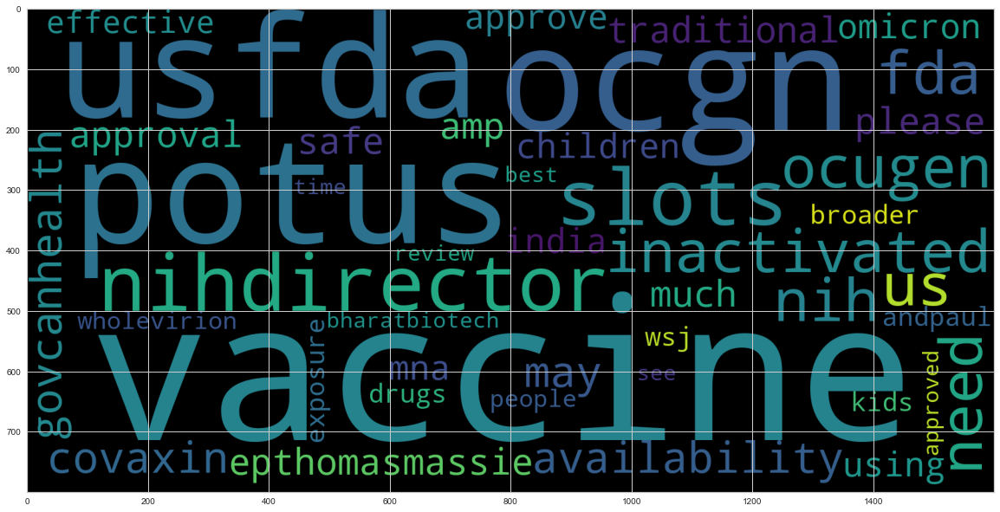

In [94]:
df = frequentWords(keyWord)

C:\Users\jaseb\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



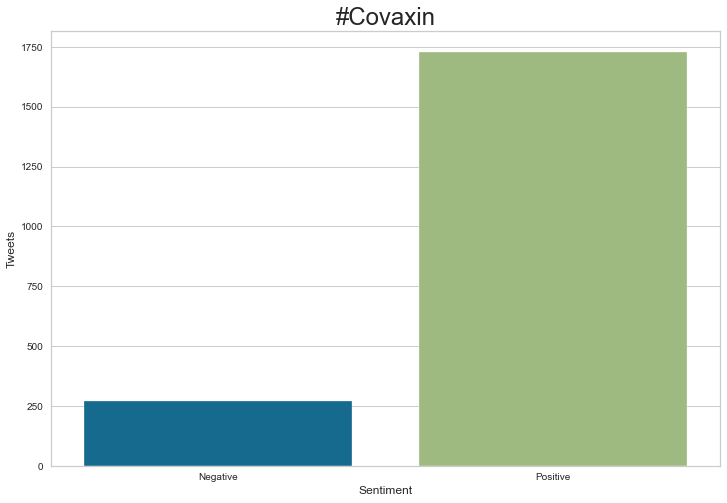

In [95]:
visual(df,keyWord)

Negative Words Word Cloud


Positive Words Word Cloud


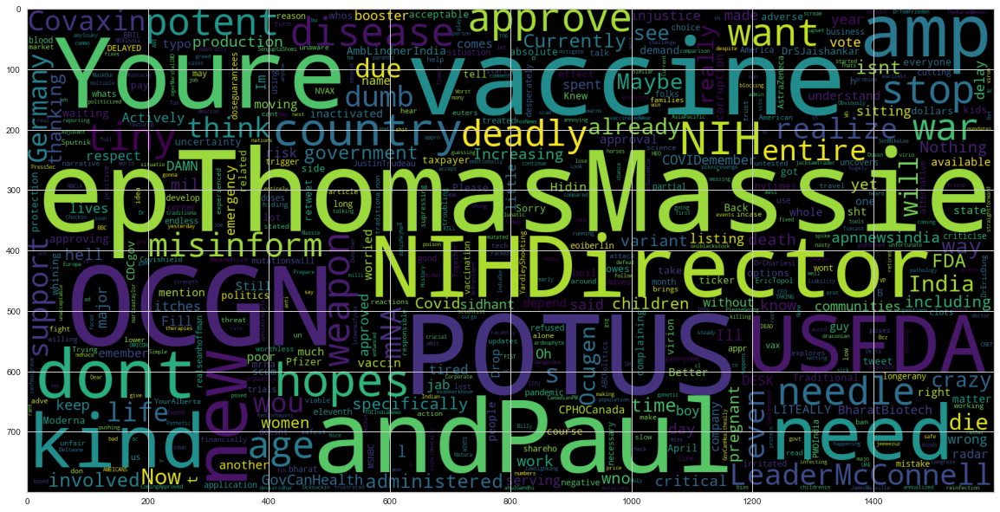

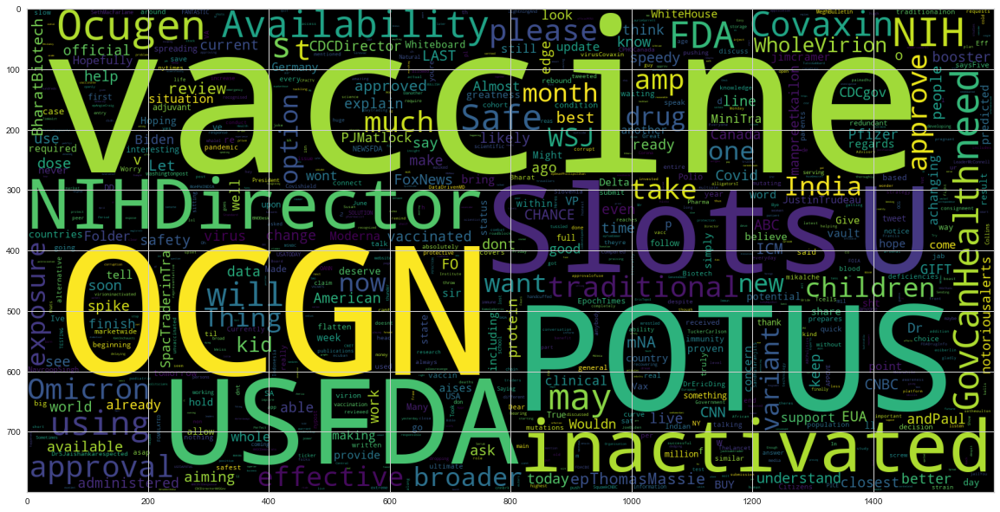

In [96]:
wordCloud(df)

In [97]:
tweetSource(df)

,source,count
0,Twitter for iPhone,959
1,Twitter for Android,563
2,Twitter Web App,306
3,VaxBlr,110
4,Twitter for iPad,21
5,Gambiste,16
6,TweetDeck,4
7,LinkedIn,3
8,Social-Pull-Staging,2
9,Retweetteuse,2


In [98]:
tweetLocation(df)

,location,count
0,location Unknown,1121
1,"Bengaluru, India",111
2,Angola,66
3,"California, USA",58
4,"Tampa, FL",34
5,"Ohio, USA",34
6,"Los Angeles, CA",30
7,United States,29
8,India,23
9,stratosphere,17


In [99]:
tweetUser(df)

,screen_name,count
0,vaxblr,110
1,grady30438708,105
2,MrcioLG1,66
3,Itallmakesens,60
4,Linhduo69960076,57
5,Gustavo74001799,45
6,doc_holliday50,41
7,B1llyTh2K3d,35
8,RobMaso91885780,33
9,CraigGordon8,30


In [100]:
tweetsPerDay(df)

In [101]:
unigram_df=ngram_df(df['text'],(1,1),20)
bigram_df=ngram_df(df['text'],(2,2),20)
trigram_df=ngram_df(df['text'],(3,3),20)
displayNgram(unigram_df,bigram_df,trigram_df)

In [102]:
violinPLot(df)

Naive Bayes:
Train accuracy 94.31%
Test accuracy 86.00%
Accuracy Score:
0.86
Confusion Matrix:


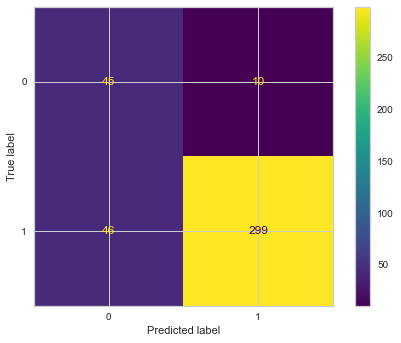

Classification Report:


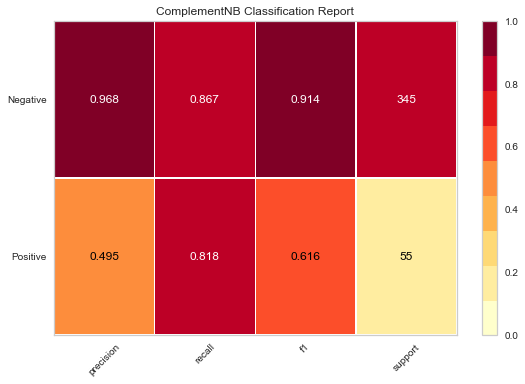



Random Forest Classification:
Train accuracy 86.56%
Test accuracy 86.25%
Accuracy Score:
0.8625
Confusion Matrix:


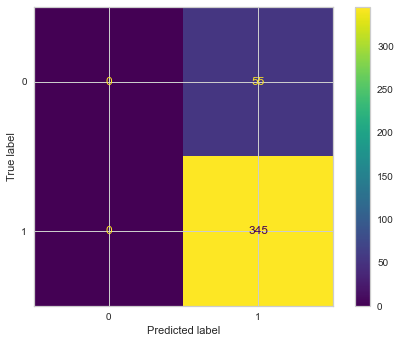

Classification Report:


C:\Users\jaseb\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



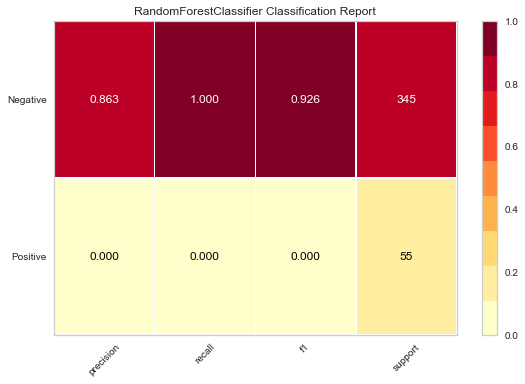



SVM:
Train accuracy 98.44%
Test accuracy 93.50%
Accuracy Score:
0.935
Confusion Matrix:


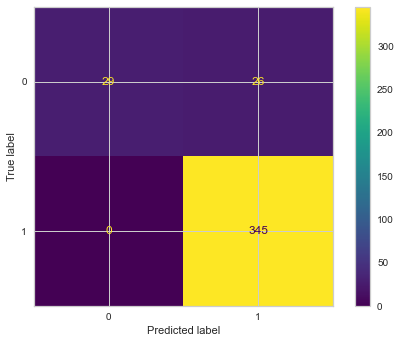

Classification Report:


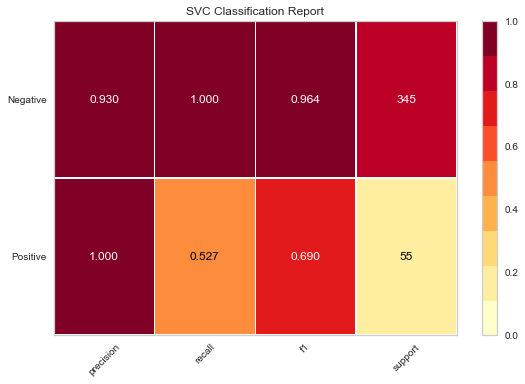

In [103]:
modelFile = modelPreparation(df)

In [104]:
testdf = df.iloc[0:10]
testdf

,Unnamed: 0,tweet id,time of tweet,user id,text,location,source,screen_name,Sentiment,After Stop word removal,tweet_date,text_length
0,0,1467263255915728903,2021-12-04 22:43:15,828638127078141953,GuyCreal POTUS Everyone knows that Pfizer pon...,"Ohio, USA",Twitter for iPhone,GuyCreal,1,guycreal potus everyone knows pfizer ponies te...,2021-12-04,20
1,1,1467262658420383757,2021-12-04 22:40:52,1375955904647073800,It truly says something that troves of people...,location Unknown,Twitter for iPhone,rickyn1123,1,truly says something troves people around worl...,2021-12-04,20
2,2,1467262338000633868,2021-12-04 22:39:36,806460071546716160,AmbLindnerIndia The uncertainty related to t...,location Unknown,Twitter for Android,abhishek_1022,0,amblindnerindia uncertainty related matter rea...,2021-12-04,14
3,3,1467261990217342977,2021-12-04 22:38:13,1375955904647073800,I spent years of my life serving communities...,location Unknown,Twitter for iPhone,rickyn1123,0,spent years life serving communities country k...,2021-12-04,24
4,4,1467259926481358859,2021-12-04 22:30:01,1397684277031153668,a traditional vaccine for Currently has ...,location Unknown,Twitter for iPhone,ken84504255,1,traditional vaccine currently peer reviewed pu...,2021-12-04,13
5,5,1467259906101186560,2021-12-04 22:29:56,1456365100697219086,We have lost our goddamned minds IT WONT KILL...,location Unknown,Twitter for iPhone,FullTimeDreamir,0,lost goddamned minds wont kill winte,2021-12-04,13
6,6,1467257451560927233,2021-12-04 22:20:11,1365125787544735749,I think Ocugen will surprise investors with a ...,"Los Angeles, CA",Twitter Web App,SupremeJameson,1,think ocugen surprise investors huge smile upc...,2021-12-04,13
7,7,1467257164435955712,2021-12-04 22:19:02,1365125787544735749,One of the dutiesresponsibilites Utilize data...,"Los Angeles, CA",Twitter Web App,SupremeJameson,1,dutiesresponsibilites utilize data analysis es...,2021-12-04,15
8,8,1467257072702013442,2021-12-04 22:18:41,1365125787544735749,Ocugen posted this job available weeks ago b...,"Los Angeles, CA",Twitter Web App,SupremeJameson,1,ocugen posted job available weeks ago posting ...,2021-12-04,21
9,9,1467253498383413257,2021-12-04 22:04:28,1352762523540455424,POTUS NIHDirector USFDA FoxNews CNN elonmusk I...,location Unknown,Twitter for Android,SeanOCo35477166,1,potus nihdirector usfda foxnews cnn elonmusk i...,2021-12-04,15


In [105]:
testModel(modelFile,testdf)

ComplementNB()
Naive Bayes:
[1 1 0 0 1 0 0 0 1 1]


Random Forest Classification:
[1 1 1 1 1 1 1 1 1 1]


SVM:
[1 1 0 0 1 1 1 1 1 1]


<ipython-input-25-2cbef85a952f>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-25-2cbef85a952f>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Tweets related to Astra Zeneca

In [106]:
keyWord = input("\nEnter Covid vaccine name:")
extractTweets(keyWord)


Enter Covid vaccine name:#AstraZeneca
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or 

RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @WithyGrove: VIDEO: The Belgian Resistance 🇧🇪 : Firefighters demonstrating against mandatory jabs 💉 . https://t.co/Se9A3HGe38 #Belgium…
RT @WithyGrove: VIDEO: The Belgian Resistance 🇧🇪 : Firefighters demonstrating against mandatory jabs 💉 . https://t.co/Se9A3HGe38 #Belgium…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @jamesjpdrake: A prescient BBC article in March this year asked if the decision by some countries to suspend the #AstraZeneca vaccine af…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @TheHinduScience: A multi-institutional study has revealed for the first time the mechanism responsible for blood clots arising from thr…
RT @WithyGrove: V

RT @WithyGrove: VIDEO: The Belgian Resistance 🇧🇪 : Firefighters demonstrating against mandatory jabs 💉 . https://t.co/Se9A3HGe38 #Belgium…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @si_mcav: I'm looking to learn about people's experience with the #pfizer booster after getting #AstraZeneca for shots 1 and 2. If this…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk

RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireT

RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireT

RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireTalk: SCIENTISTS #AstraZeneca vaccine acts like a magnet and attracts platelets which body mistakes for a threat and attacks, t…
RT @HighWireT

RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @teampolstrat: #Polstrat explores why this travel ban may be unfair how much of a risk the new variant poses.

#COVID19 #100CroreVaccina…
RT @teampolstrat: #Polstrat lists the countries where the variant has been detected and why african leaders find the #travelban unjust.

#C…
#Polstrat lists the countries where the variant has been detected and why african leaders find the #travelban unjus… https://t.co/rqeOd18dKl
RT @EVanderclooten: #Omicron:
OHOHOH !!!! #SPELLINGMISTAKE  #fautedorthographe #WHO #UN #EU 
#Macron #Merkel #vonderleyen #WEF #France #Kla…
#Polstrat explores why this travel ban may be unfair how much of a risk the new variant poses.

#COVID19… https://t.co/n1hh8U2BvQ
Just one more and ill stop #covid #vaccine #booster #jab #AstraZeneca
#myocarditis

  https://t.co/qgSZ5AKXF9 #findyourthing #redbubble
@Gerard39delaney @sara_kayat 

This is hilarious BUT ALSO FURTHER ANGERING

#VaccineEquity #vaccines #COVAX #patents #Pfizer #Moderna #AstraZeneca… https://t.co/lo4fEEgrIz
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
𝙁𝙪𝙡𝙡𝙮 𝙫𝙖𝙭𝙭𝙚𝙙 💉

We travelled in the early morning, back and forth, 2 days in a row just to get our second shot of A… https://t.co/aM1Jrnc7j2
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
RT @OffGuardi

RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @Vaccinologist: A team of scientists in #Cardiff and the #US believe they have identified "the trigger" that leads to EXTREMELY RARE blo…
RT @Vaccinologist: A team of scientists in #Cardiff and the #US believe they have identified "the trigger" that leads to EXTREMELY RARE blo…
RT @powerfromspace1: Scientists find trigger for rare #AstraZeneca #Covid19 #vaccine clots https://t.co/ywzJIByRU8
RT @Vaccinologist: A team of scientists in #Cardiff and the #US believe they have identified "the trigger" that leads to EXTREMELY RARE blo…
A team of scientists in #Cardiff and the #US believe they have identified "the trigger" that leads to EXTREMELY RAR… https://t.co/mtS5LnYnIi
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it 

@vonderLeyen + #macron20h ⬆️
look like 2 #Manchurian politicians 
@WHO stubbornly IGNORE 
reality of #Pfizer/… https://t.co/eKhRIDvQBv
RT @RobertM31441195: #Vaccinations work 
Make sure you have a #COVID19Vaccine when it's offered.
#COVID19 #AstraZeneca #AstraZenecaVaccine…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
The victim - Anthony Rio 💔
The crime - thrombosis from Astra Zeneca
#AstraZeneca #VaccineSideEffects https://t.co/9EpFV2bsyb
What's happened to the #AstraZeneca vaccine 🤔 #CovidVaccine #COVID19
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses

This medicine has been given ‘conditional approval’. This means that there is more evidence to come about this medi… https://t.co/S82xLEWWqv
RT @TrasElValle_OBC: "#PedaZitosDeVuelta (III)" con #RaquelEspuelas:

https://t.co/PJs6oBIlya

#FinEstadoDeAlarma #ToqueDeQueda #Covid19 #C…
RT @jjaranaz94: "En 'stand-by(e)'" (#TEVDAdeVerano):

https://t.co/OqJWFKOCTI

#FinEstadoDeAlarma #FinToqueDeQueda #Mascarilla #Covid19 #Co…
RT @jjaranaz94: "#PedaZitosDeVuelta (III)" con #RaquelEspuelas:

https://t.co/ouLWfsiuB3

#EstadoDeAlarma #FinToqueDeQueda #Covid19 #Covid_…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @Farnakyboy: 😊 I see protests and white red flags. No, this is not #Belarus!  People in  #Austria seem to have had enough from the force…
As of 28 Octo

RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @Bez___: #AstraZeneca admits their #Vaccine gives you blood clots.

#DoNotComply #NewVariant #Omicron #Covid #Covid19 #CoronaVirus #Lock…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @garetheve

RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
The question YOU have to ask politicians and medical professionals, the question science should ask #Pfizer,… https://t.co/8fbW6tLYgb
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We wi

RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
Hi @DHA_Dubai - Pls let us know the plans for the booster shot of people who took #AstraZeneca 💉
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my

RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve

RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @OffGuardi

COVID-19: #Bloodclots from #Astrazeneca jab killed mother, coroner finds | UK News | Sky News - the news says only… https://t.co/eAORIWnpfE
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
#COVID Trigger of rare blood clots with #AstraZeneca jab found by scientists - BBC News https://t.co/apstlTYpQE
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
Booster dose 

#AstraZeneca 
#CovidVaccine
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…


RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @USAmbMex: During the North American Leaders Summit, the U.S. reaffirmed its commitment to support Mexico in the fight against #COVID19.…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @WIONews: Due to cases of blood clot formation observed after administering #AstraZeneca #Covid vaccine, many countries had stopped use…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @elephunk101: ICMR official explains why #Covaxin may have edge against #Omicron

#Vaccigen #HealthCanada @WHO $ocgn $ocugen #ocgn #ocug…
RT @htlifeands

RT @WackAndre: https://t.co/yt9dfSnssP

#RIP🙏

⚠️Woman, 51, #AstraZeneca vaccine caused her death.

Mother-of-two Michelle Barlow, 51, from…
RT @elephunk101: ICMR official explains why #Covaxin may have edge against #Omicron

#Vaccigen #HealthCanada @WHO $ocgn $ocugen #ocgn #ocug…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @TheLancet

RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @TheLancet

Rate limit reached. Sleeping for: 687


RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
RT @TheLancet: NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or #Pfizer-Bio…
NEW—Six different COVID-19 boosters are safe and increase immunity when given after two doses of #AstraZeneca or… https://t.co/4QeRXVHI1T
RT @garetheve: W

RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
Some local government units would have to explain the spoilage of "a few hundred doses" of #AstraZeneca vaccine tha… https://t.co/2BYC91Pfsb
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @OffGuardi

RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
@kentindell @UxbEconomist07 @ThreePeaceSweet @ocrossborder @DCBMEP @NadineDorries @BBC @BBCNews… https://t.co/H2E45fkXGG
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out w

RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve

RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve

RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve

RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
Now look at this 👀 🔥 💉 💉

👇👇👇👇
#Covid #Covid_19 #CovidVaccine #COVID19Vaccine #COVID19 #vaccineinjuries #vac… https://t.co/jbzMZMcQrQ
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @garetheve: We wi

RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
RT @TrasElValle_OBC: "#PedaZitosDeVuelta (III)" con #RaquelEspuelas:

https://t.co/PJs6oBZWWK

#FinEstadoDeAlarma #ToqueDeQueda #Covid19 #C…
RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
RT @TrasElValle_OBC: "En 'stand-by(e)'"(#TEVDAdeVerano):

https://t.co/VX3ucLi3jf

#FinEstadoDeAlarma #FinToqueDeQueda #Mascarilla #Covid19…
@Mardan_DC @GovtofPakistan @HealthKPGovt why #Moderna and #AstraZeneca are not available in MARDAN vaccination cent… https://t.co/Z5kwHeevWw
RT @jjaranaz94: "En 'stand-by(e)'" (#TEVDAdeVerano):

https://t.co/OqJWFKOCTI

#EstadoDeAlarma #ToqueDeQueda #Mascarilla #Covid19 #Covid_19…
RT @jjaranaz94: "#PedaZitosDeVuelta (III)" con #RaquelEspuelas:

https://t.co/ouLWfsA5ZD

#EstadoDeAlarma #FinToqueDeQueda #Covid19 #Covid_…
RT @OffGuardi

RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
RT @OffGuardian0: Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is spread…
Quite a journey the #AstraZeneca #clotshot has taken:

"that isn't happening"

"everyone who says its happening is… https://t.co/69OJnI5u9y
RT @garetheve:

@POTUS New variant is mild in Africa as usual, but it can be very lethal when it reaches Europe &amp; America as histor… https://t.co/IVjDhIyD1p
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
#trigger #rare #Blood
#clots #AstraZeneca  #CovidVaccine #CovidVaccines
#CoronaVaccine #found #by
#Scientists… https://t.co/EqflQXE878
@ndtv - aren't #AstraZeneca and #Covishield the same? What prompted you guys not to mention the term which is more… https://t.co/3OfhNNBwgq
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
#coronavirus #COVID__19 #antibodytest #facemasks #variantecovid  #vaccines #nanotechnology  #therapy #FDA #antibody… https://t.co/Ofo32Sf5bf
RT @garetheve: We will find out why it happened to you my beautiful Lisa.

And one day, someone at #AstraZeneca or in Gov @sajidjavid might…
I had my #COVID-

Apart from the fact blood clots after #AstraZeneca is NOT extremely rare. 73 deaths doesn't encompass those who hav… https://t.co/foiMAQDTlk
RT @elephunk101: ICMR official explains why #Covaxin may have edge against #Omicron

#Vaccigen #HealthCanada @WHO $ocgn $ocugen #ocgn #ocug…
RT @TheVoxWolf: Sorry am I reading this right? #AstraZeneca was pulled in many countries after reports of blood clots. Yet here they are ma…
RT @KathyConWom: How stupid do they want to make people feel for saying yes to AZ jab without having noticed this 👇#astrazeneca  https://t.…
RT @USAmbMex: During the North American Leaders Summit, the U.S. reaffirmed its commitment to support Mexico in the fight against #COVID19.…
ICMR official explains why #Covaxin may have edge against #Omicron

#Vaccigen #HealthCanada @WHO $ocgn $ocugen… https://t.co/rs1MoL9L8c
RT @USAmbMex: During the North American Leaders Summit, the U.S. reaffirmed its commitment to support Mexico in the fight against #COVID19.…
RT @KathyConWom: H

#AstraZeneca #COVID19 #vaccine interacts with CAR and PF4 with implications for #thrombosis #clots with… https://t.co/p4Rvms4a74
@JulianneH66 I got a similar reaction with my first jab but not my second #AstraZeneca Mystery.
RT @FreedomAllian11: "A 'wonderful and loving' mum-of-two died from complications of the #AstraZeneca #coronavirus vaccine, a coroner has r…
The number of Covid-19 cases today, 02 December 2021.
Remember to observe safety and protective measures when you’r… https://t.co/47p1G3ldi8
RT @top_grafisch: #VaccineMakers bribed the European Commissioner?

https://t.co/PsUMzCvJu4

#StellaKyriakides
#EuropeanUnion
#EuropeanComm…
"A CRAZY MESS"!! Pfizer Whistleblower SLAMS Vaccine Trials https://t.co/lnmIxy5eQB via @YouTube I wonder if this is… https://t.co/F0Q4eWBYW5
RT @top_grafisch: #VaccineMakers bribed the European Commissioner?

https://t.co/PsUMzCvJu4

#StellaKyriakides
#EuropeanUnion
#EuropeanComm…
RT @top_grafisch: #VaccineMakers bribed the European Commissioner?

ht

@BBCBreakfast The #Medicines and Healthcare products Regulatory Agency (MHRA) recommended both the #AstraZeneca and… https://t.co/c8L76V1pUc
@journosooz @bpolitics The #Medicines and Healthcare products Regulatory Agency (MHRA) recommended both the… https://t.co/kZP4hVtVYn
@itvnews A vaccine that was made in a short space of time, regardless of trials done, all Adverse Reactions to it s… https://t.co/9mWrZDlYwu
RT @BreakingNewsKE: KENYA receives 2.2mn #AstraZeneca vaccine doses from the German government to boost the country's inoculation drive. ht…
@moderna_tx I would like a #AZ @BorisJohnson 
The #Medicines and Healthcare products Regulatory Agency (MHRA) recom… https://t.co/A83lrAImay
#thursdaymorning  #AstraZeneca @BorisJohnson 
The #Medicines and Healthcare products Regulatory Agency (MHRA) recom… https://t.co/aZ7ahpXxPW
BBC News - Covid: Trigger of rare blood clots with AstraZeneca jab found by scientists

#Covid_19 #CovidVaccines… https://t.co/qynZi6Yve1
Disgusting not one #Astr

In [107]:
eda(keyWord)

Data Frame head:


,tweet id,time of tweet,user id,text,location,source,screen_name
0,1467270829566304263,2021-12-04 23:13:20,1352671357461553153,SCIENTISTS vaccine acts like a magnet and at...,🇨🇦#PPC,Twitter for Android,Caro89943577
1,1467269099285798925,2021-12-04 23:06:28,3161567978,SCIENTISTS vaccine acts like a magnet and at...,"Alaska, USA",Twitter for iPhone,meccamaggie
2,1467268851612237828,2021-12-04 23:05:29,1450934701187870725,SCIENTISTS vaccine acts like a magnet and at...,NaN,Twitter for iPhone,LightHouse051
3,1467268324975329287,2021-12-04 23:03:23,1266834866135601153,SCIENTISTS vaccine acts like a magnet and at...,NC,Twitter for Android,Kreutzjr1
4,1467268125683032065,2021-12-04 23:02:36,876025282137870336,SCIENTISTS vaccine acts like a magnet and at...,NaN,Twitter Web App,yankoboyadzhiev


Data Frame Tail:


,tweet id,time of tweet,user id,text,location,source,screen_name
1995,1466307857419227146,2021-12-02 07:26:50,2723322337,Postvaccination survey for monitoring the side...,"Riyadh, Saudi Arabia",Twitter Web App,smj_journal
1996,1466307275010760705,2021-12-02 07:24:31,241041805,Good news re Astra Cardiff Uni scientists h...,Dublin,Twitter for iPad,PaulSommerville
1997,1466307101437923339,2021-12-02 07:23:50,1457055525590470663,Another article on the,NaN,Twitter for Android,Jenn030303
1998,1466306936211714048,2021-12-02 07:23:10,862768470072676352,Very interesting Scientists believe they have...,Global,TweetDeck,forexflowlive
1999,1466306735770157062,2021-12-02 07:22:23,21183938,Very interesting Scientists believe they have...,"City of London, London - Re-tweet does not mea...",Twitter Web App,mhewson_CMC


Shape of DataFrame:
(2000, 7)


Total tweets in this data: 2000
Total Unique Users in this data: 1856
Info of DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   tweet id       2000 non-null   int64 
 1   time of tweet  2000 non-null   object
 2   user id        2000 non-null   int64 
 3   text           2000 non-null   object
 4   location       1184 non-null   object
 5   source         2000 non-null   object
 6   screen_name    2000 non-null   object
dtypes: int64(2), object(5)
memory usage: 109.5+ KB
None


Data Types of DataFrame:
tweet id          int64
time of tweet    object
user id           int64
text             object
location         object
source           object
screen_name      object
dtype: object


Describe Dataframe:
           tweet id       user id
count  2.000000e+03  2.000000e+03
mean   1.466709e+18  5.623135e

,tweet id,time of tweet,user id,text,location,source,screen_name
0,1467270829566304263,2021-12-04 23:13:20,1352671357461553153,SCIENTISTS vaccine acts like a magnet and at...,🇨🇦#PPC,Twitter for Android,Caro89943577
1,1467269099285798925,2021-12-04 23:06:28,3161567978,SCIENTISTS vaccine acts like a magnet and at...,"Alaska, USA",Twitter for iPhone,meccamaggie
2,1467268851612237828,2021-12-04 23:05:29,1450934701187870725,SCIENTISTS vaccine acts like a magnet and at...,location Unknown,Twitter for iPhone,LightHouse051
3,1467268324975329287,2021-12-04 23:03:23,1266834866135601153,SCIENTISTS vaccine acts like a magnet and at...,NC,Twitter for Android,Kreutzjr1
4,1467268125683032065,2021-12-04 23:02:36,876025282137870336,SCIENTISTS vaccine acts like a magnet and at...,location Unknown,Twitter Web App,yankoboyadzhiev


In [108]:
analyzeSentiment(keyWord)

,Unnamed: 0,tweet id,time of tweet,user id,text,location,source,screen_name,Sentiment
0,0,1467270829566304263,2021-12-04 23:13:20,1352671357461553153,SCIENTISTS vaccine acts like a magnet and at...,🇨🇦#PPC,Twitter for Android,Caro89943577,Negative
1,1,1467269099285798925,2021-12-04 23:06:28,3161567978,SCIENTISTS vaccine acts like a magnet and at...,"Alaska, USA",Twitter for iPhone,meccamaggie,Negative
2,2,1467268851612237828,2021-12-04 23:05:29,1450934701187870725,SCIENTISTS vaccine acts like a magnet and at...,location Unknown,Twitter for iPhone,LightHouse051,Negative
3,3,1467268324975329287,2021-12-04 23:03:23,1266834866135601153,SCIENTISTS vaccine acts like a magnet and at...,NC,Twitter for Android,Kreutzjr1,Negative
4,4,1467268125683032065,2021-12-04 23:02:36,876025282137870336,SCIENTISTS vaccine acts like a magnet and at...,location Unknown,Twitter Web App,yankoboyadzhiev,Negative
...,...,...,...,...,...,...,...,...,...
1995,1995,1466307857419227146,2021-12-02 07:26:50,2723322337,Postvaccination survey for monitoring the side...,"Riyadh, Saudi Arabia",Twitter Web App,smj_journal,Positive
1996,1996,1466307275010760705,2021-12-02 07:24:31,241041805,Good news re Astra Cardiff Uni scientists h...,Dublin,Twitter for iPad,PaulSommerville,Positive
1997,1997,1466307101437923339,2021-12-02 07:23:50,1457055525590470663,Another article on the,location Unknown,Twitter for Android,Jenn030303,Positive
1998,1998,1466306936211714048,2021-12-02 07:23:10,862768470072676352,Very interesting Scientists believe they have...,Global,TweetDeck,forexflowlive,Positive


                 Word  Frequency of Word
0                find                769
1            happened                757
2             someone                755
3                 gov                755
4          sajidjavid                754
5           beautiful                753
6             lisaand                753
7                 day                753
8              might…                752
9             vaccine                348
10         scientists                334
11               like                260
12                  …                258
13               acts                254
14             magnet                254
15           attracts                253
16          platelets                252
17             threat                250
18                 t…                250
19               body                249
20           mistakes                249
21            attacks                249
22              doses                190
23           boo

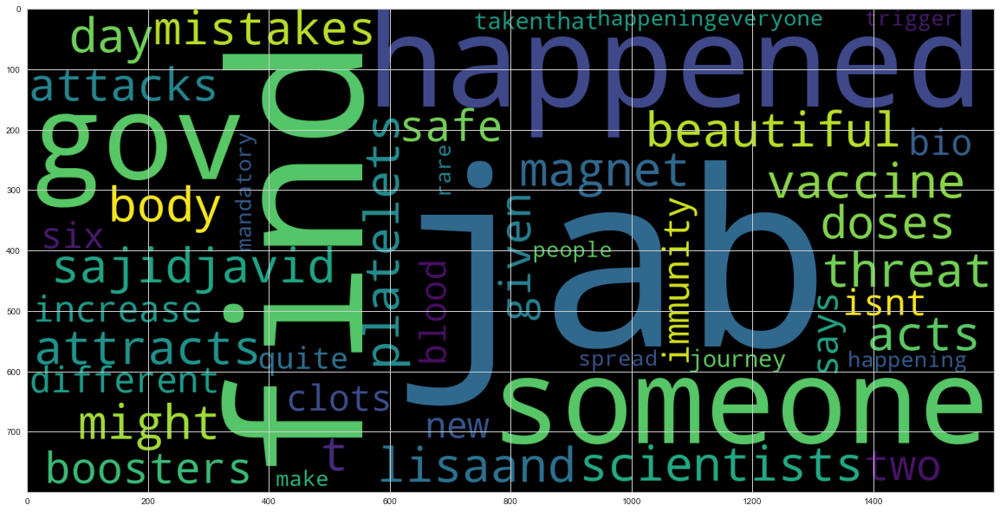

In [109]:
df = frequentWords(keyWord)

C:\Users\jaseb\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



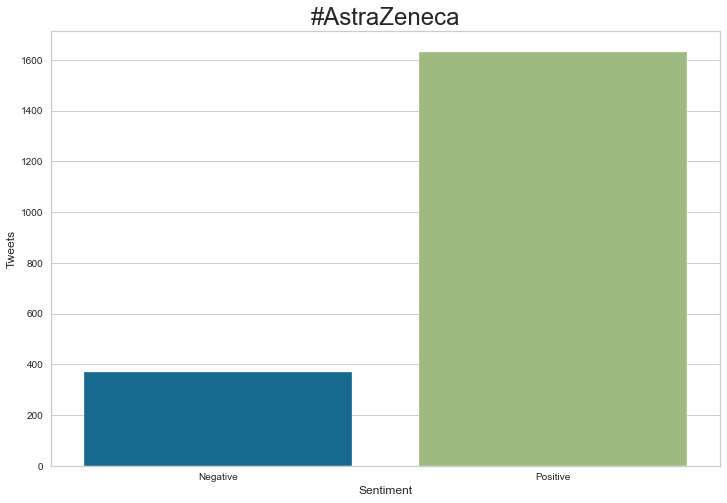

In [110]:
visual(df,keyWord)

Negative Words Word Cloud


Positive Words Word Cloud


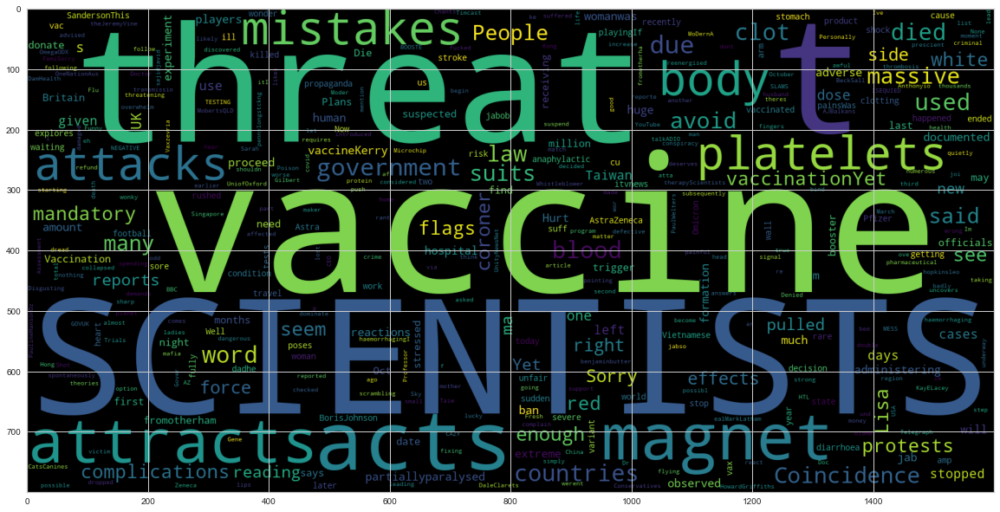

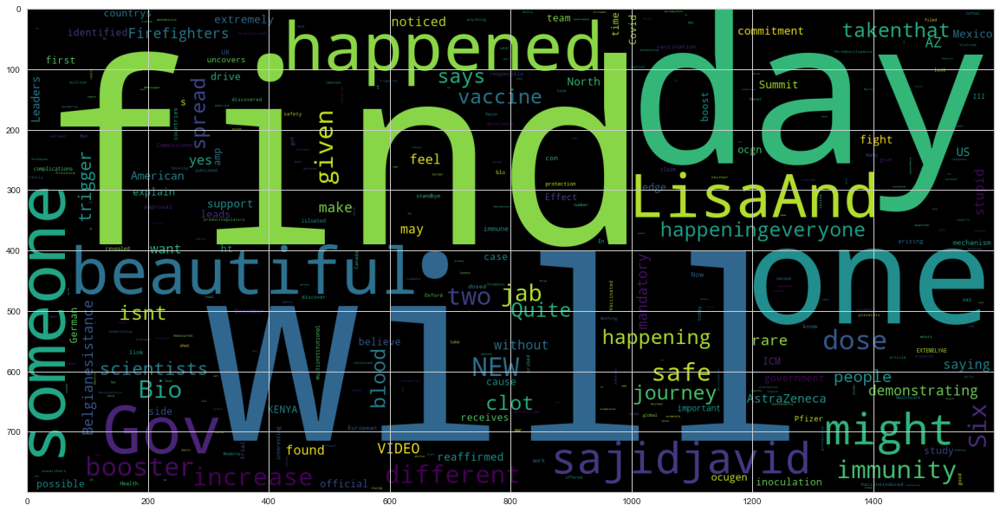

In [111]:
wordCloud(df)

In [112]:
tweetSource(df)

,source,count
0,Twitter for Android,707
1,Twitter for iPhone,612
2,Twitter Web App,501
3,Twitter for iPad,103
4,TweetDeck,24
5,Hootsuite Inc.,6
6,Retweetteuse,5
7,dlvr.it,4
8,Buffer,3
9,Echofon,3


In [113]:
tweetLocation(df)

,location,count
0,location Unknown,816
1,"England, United Kingdom",38
2,United Kingdom,35
3,UK,34
4,"London, England",29
5,London,22
6,England,14
7,India,11
8,United States,9
9,"North West, England",8


In [114]:
tweetUser(df)

,screen_name,count
0,TrasElValle_OBC,9
1,jjaranaz94,9
2,nigethugrug,9
3,vobb_io,8
4,AnimationPoser,8
5,MirkoCiminiello,6
6,FreedomAllian11,6
7,claudiociminiel,6
8,Carolicen,5
9,4Tchat,5


In [115]:
tweetsPerDay(df)

In [116]:
unigram_df=ngram_df(df['text'],(1,1),20)
bigram_df=ngram_df(df['text'],(2,2),20)
trigram_df=ngram_df(df['text'],(3,3),20)
displayNgram(unigram_df,bigram_df,trigram_df)

In [117]:
violinPLot(df)

Naive Bayes:
Train accuracy 95.25%
Test accuracy 90.75%
Accuracy Score:
0.9075
Confusion Matrix:


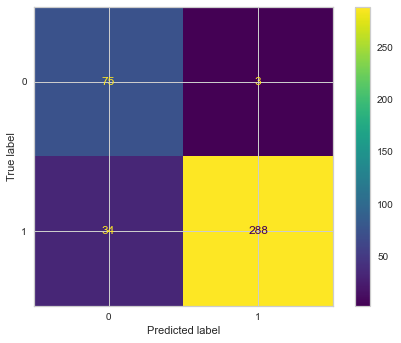

Classification Report:


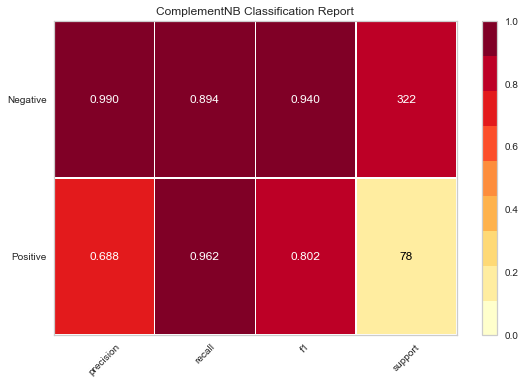



Random Forest Classification:
Train accuracy 93.88%
Test accuracy 94.75%
Accuracy Score:
0.9475
Confusion Matrix:


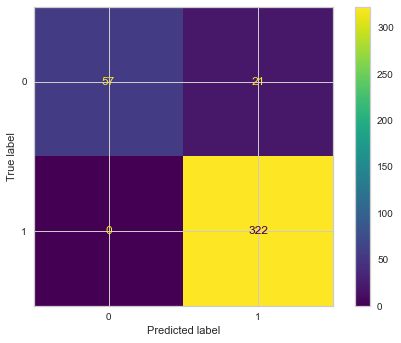

Classification Report:


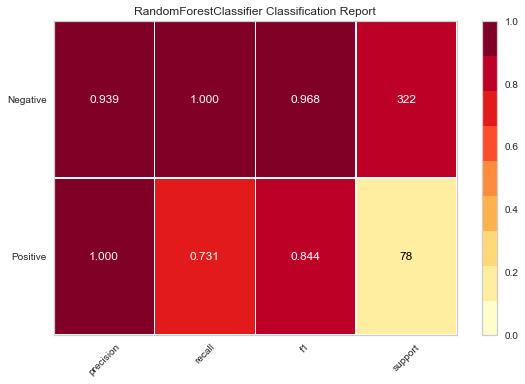



SVM:
Train accuracy 99.38%
Test accuracy 98.25%
Accuracy Score:
0.9825
Confusion Matrix:


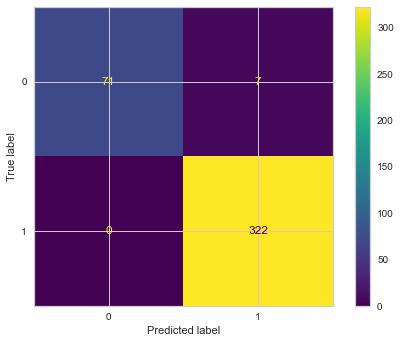

Classification Report:


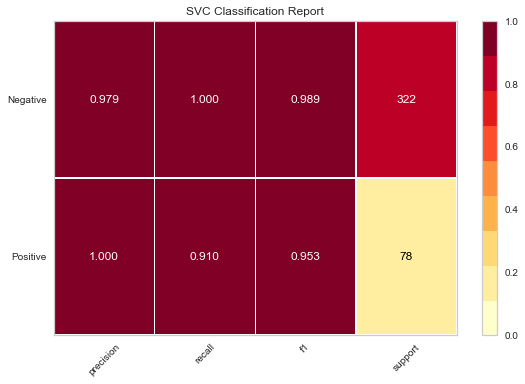

In [118]:
modelFile = modelPreparation(df)

In [119]:
testdf = df.iloc[0:10]
testdf

,Unnamed: 0,tweet id,time of tweet,user id,text,location,source,screen_name,Sentiment,After Stop word removal,tweet_date,text_length
0,0,1467270829566304263,2021-12-04 23:13:20,1352671357461553153,SCIENTISTS vaccine acts like a magnet and at...,🇨🇦#PPC,Twitter for Android,Caro89943577,0,scientists vaccine acts like magnet attracts p...,2021-12-04,18
1,1,1467269099285798925,2021-12-04 23:06:28,3161567978,SCIENTISTS vaccine acts like a magnet and at...,"Alaska, USA",Twitter for iPhone,meccamaggie,0,scientists vaccine acts like magnet attracts p...,2021-12-04,18
2,2,1467268851612237828,2021-12-04 23:05:29,1450934701187870725,SCIENTISTS vaccine acts like a magnet and at...,location Unknown,Twitter for iPhone,LightHouse051,0,scientists vaccine acts like magnet attracts p...,2021-12-04,18
3,3,1467268324975329287,2021-12-04 23:03:23,1266834866135601153,SCIENTISTS vaccine acts like a magnet and at...,NC,Twitter for Android,Kreutzjr1,0,scientists vaccine acts like magnet attracts p...,2021-12-04,18
4,4,1467268125683032065,2021-12-04 23:02:36,876025282137870336,SCIENTISTS vaccine acts like a magnet and at...,location Unknown,Twitter Web App,yankoboyadzhiev,0,scientists vaccine acts like magnet attracts p...,2021-12-04,18
5,5,1467267642767597568,2021-12-04 23:00:41,441086510,SCIENTISTS vaccine acts like a magnet and at...,"Stark county, Ohio",Twitter for Android,Trishpel,0,scientists vaccine acts like magnet attracts p...,2021-12-04,18
6,6,1467267195419963400,2021-12-04 22:58:54,33242358,We will find out why it happened to you my be...,"Aberdare, South Wales 🏡",Twitter for Android,VicHughes92,1,find happened beautiful lisaand day someone go...,2021-12-04,21
7,7,1467266249176592391,2021-12-04 22:55:08,1308019801428766732,SCIENTISTS vaccine acts like a magnet and at...,"Sheffield, England",Twitter for iPad,doremouse291,0,scientists vaccine acts like magnet attracts p...,2021-12-04,18
8,8,1467265855989899266,2021-12-04 22:53:35,788894540350521348,A womanwas left partiallyparalysed due to the...,location Unknown,Twitter for iPhone,wiok11,0,womanwas left partiallyparalysed due side effe...,2021-12-04,14
9,9,1467265484320092165,2021-12-04 22:52:06,2273859230,SCIENTISTS vaccine acts like a magnet and at...,location Unknown,Twitter for Android,PLHenny,0,scientists vaccine acts like magnet attracts p...,2021-12-04,18


In [120]:
testModel(modelFile,testdf)

ComplementNB()
Naive Bayes:
[0 0 0 0 0 0 1 0 0 0]


Random Forest Classification:
[0 0 0 0 0 0 1 0 1 0]


SVM:
[0 0 0 0 0 0 1 0 0 0]


<ipython-input-25-2cbef85a952f>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-25-2cbef85a952f>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Tweets Rekated to Johnson and Johnson

In [61]:
keyWord = input("\nEnter Covid vaccine name:")
extractTweets(keyWord)


Enter Covid vaccine name:#Janssen
RT @jjaranaz94: "#PedaZitosDeVuelta (III)" con #RaquelEspuelas:

https://t.co/ouLWfsA5ZD

#FinEstadoDeAlarma #ToqueDeQueda #Covid19 #Covid_…
RT @jjaranaz94: "En 'stand-by(e)'" (#TEVDAdeVerano):

https://t.co/OqJWFKOCTI

#FinEstadoDeAlarma #FinToqueDeQueda #FinMascarilla #Covid19…
RT @Hayburysearch: Janssen taps Tempus' AI and real-world data library for cancer drug discovery https://t.co/SjiXVtC9i9 #ClinicalTrialsSof…
Janssen taps Tempus' AI and real-world data library for cancer drug discovery https://t.co/SjiXVtC9i9… https://t.co/fbuYfeJq82
RT @C19vaxS: #Pfizer  #Moderna #Janssen #AstraZeneca #FactCheck #VaccineIssues #Fauci  #Biden  #lies 

#MSM really needs to report the trut…
#Pfizer  #Moderna #Janssen #AstraZeneca #FactCheck #VaccineIssues #Fauci  #Biden  #lies 

#MSM really needs to repo… https://t.co/KN0fRxS6cz
#Janssen vaccine is made from a mysterious adenovirus that’s genetically edited to not reproduce, which might happe… https://t.co/bhVm

RT @TrasElValle_OBC: "En 'stand-by(e)'" (#TEVDAdeVerano):

https://t.co/VX3ucLi3jf

#EstadoDeAlarma #ToqueDeQueda #Mascarilla #Covid19 #Cov…
RT @jjaranaz94: "En 'stand-by(e)'" (#TEVDAdeVerano):

https://t.co/OqJWFKOCTI

#FinEstadoDeAlarma #FinToqueDeQueda #FinMascarilla #Covid19…
I want my booster. Asap. #Janssen
'Though this be madness, yet there is method in it.'
If you harboured any doubts about whether there is or isn't a… https://t.co/Ro0kRT4Q5A
@Suzierizzo1 Not triple... Double
Received #janssen in March and #moderna booster last month.  Interesting how the… https://t.co/soYjpAiK3Q
My appointment for the #vaccine is on Wednesday at 4:30 pm. I don't know if I'm getting the #phizer or #janssen… https://t.co/iHiTmgewym
#EMA evaluating data on booster dose of #COVID19Vaccine #Janssen https://t.co/y2Oy0Q5yCc #ranewsema #viglya4growth
To anyone who got the J&amp;J vaccine in the spring: please consider getting your booster soon. Our pharmacist stated t… https://t.co/Nf6FXkAnAo
RT @jjar

In [62]:
eda(keyWord)

Data Frame head:


,tweet id,time of tweet,user id,text,location,source,screen_name
0,1467152920223399944,2021-12-04 15:24:49,237785012,III con …,NaN,Twitter for Android,jjaranaz94
1,1467152848421064705,2021-12-04 15:24:32,237785012,En standbye …,NaN,Twitter for Android,jjaranaz94
2,1467132529899495427,2021-12-04 14:03:47,36117076,Janssen taps Tempus AI and realworld data lib...,Bangalore,Twitter for Android,parvez1
3,1467116727792283651,2021-12-04 13:01:00,2860693607,Janssen taps Tempus AI and realworld data libr...,"Brighton, UK",Hootsuite Inc.,Hayburysearch
4,1466924072114266114,2021-12-04 00:15:27,950060335620268037,really needs to report the trut…,"Los Angeles, CA",Cal Fact Check,CalFactCheck


Data Frame Tail:


,tweet id,time of tweet,user id,text,location,source,screen_name
107,1464333136884604933,2021-11-26 20:40:00,1129103926354165760,I’m SUPE excited to announce our very first g...,NaN,Twitter for iPhone,PdCyclist
108,1464229744312991746,2021-11-26 13:49:09,24250499,Already months overdue for my booster roinnsl...,"Monaghan, Ireland",Twitter for iPhone,kyleeesi
109,1464208997901168649,2021-11-26 12:26:43,1376341703972429824,of the total population of India has received...,Singapore,Twitter Web App,SaaraghT
110,1464198402619719690,2021-11-26 11:44:37,796432481289437184,NIAC recommends boosters for everyone aged an...,"Dublin City, Ireland",Twitter for iPhone,BarryAndrewsMEP
111,1464142719945695247,2021-11-26 08:03:21,1463060563076935686,the best way to fight against global warming i...,NaN,Twitter for iPhone,MellMass94


Shape of DataFrame:
(112, 7)


Total tweets in this data: 112
Total Unique Users in this data: 63
Info of DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112 entries, 0 to 111
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   tweet id       112 non-null    int64 
 1   time of tweet  112 non-null    object
 2   user id        112 non-null    int64 
 3   text           112 non-null    object
 4   location       55 non-null     object
 5   source         112 non-null    object
 6   screen_name    112 non-null    object
dtypes: int64(2), object(5)
memory usage: 6.2+ KB
None


Data Types of DataFrame:
tweet id          int64
time of tweet    object
user id           int64
text             object
location         object
source           object
screen_name      object
dtype: object


Describe Dataframe:
           tweet id       user id
count  1.120000e+02  1.120000e+02
mean   1.465785e+18  4.840240e+17
std 

,tweet id,time of tweet,user id,text,location,source,screen_name
0,1467152920223399944,2021-12-04 15:24:49,237785012,III con …,location Unknown,Twitter for Android,jjaranaz94
1,1467152848421064705,2021-12-04 15:24:32,237785012,En standbye …,location Unknown,Twitter for Android,jjaranaz94
2,1467132529899495427,2021-12-04 14:03:47,36117076,Janssen taps Tempus AI and realworld data lib...,Bangalore,Twitter for Android,parvez1
3,1467116727792283651,2021-12-04 13:01:00,2860693607,Janssen taps Tempus AI and realworld data libr...,"Brighton, UK",Hootsuite Inc.,Hayburysearch
4,1466924072114266114,2021-12-04 00:15:27,950060335620268037,really needs to report the trut…,"Los Angeles, CA",Cal Fact Check,CalFactCheck


In [63]:
analyzeSentiment(keyWord)

,Unnamed: 0,tweet id,time of tweet,user id,text,location,source,screen_name,Sentiment
0,0,1467152920223399944,2021-12-04 15:24:49,237785012,III con …,location Unknown,Twitter for Android,jjaranaz94,Positive
1,1,1467152848421064705,2021-12-04 15:24:32,237785012,En standbye …,location Unknown,Twitter for Android,jjaranaz94,Positive
2,2,1467132529899495427,2021-12-04 14:03:47,36117076,Janssen taps Tempus AI and realworld data lib...,Bangalore,Twitter for Android,parvez1,Negative
3,3,1467116727792283651,2021-12-04 13:01:00,2860693607,Janssen taps Tempus AI and realworld data libr...,"Brighton, UK",Hootsuite Inc.,Hayburysearch,Negative
4,4,1466924072114266114,2021-12-04 00:15:27,950060335620268037,really needs to report the trut…,"Los Angeles, CA",Cal Fact Check,CalFactCheck,Positive
...,...,...,...,...,...,...,...,...,...
107,107,1464333136884604933,2021-11-26 20:40:00,1129103926354165760,I’m SUPE excited to announce our very first g...,location Unknown,Twitter for iPhone,PdCyclist,Positive
108,108,1464229744312991746,2021-11-26 13:49:09,24250499,Already months overdue for my booster roinnsl...,"Monaghan, Ireland",Twitter for iPhone,kyleeesi,Positive
109,109,1464208997901168649,2021-11-26 12:26:43,1376341703972429824,of the total population of India has received...,Singapore,Twitter Web App,SaaraghT,Positive
110,110,1464198402619719690,2021-11-26 11:44:37,796432481289437184,NIAC recommends boosters for everyone aged an...,"Dublin City, Ireland",Twitter for iPhone,BarryAndrewsMEP,Positive


                  Word  Frequency of Word
0                    …                 54
1                  iii                 23
2             standbye                 15
3              vaccine                 11
4                  amp                  8
5              booster                  8
6              variant                  6
7              janssen                  5
8                 data                  5
9             vaccines                  5
10                need                  5
11             johnson                  5
12                 new                  5
13                   ’                  4
14         netherlands                  4
15           searching                  4
16          government                  4
17                dose                  4
18                last                  4
19              people                  4
20           discovery                  3
21              really                  3
22               years            

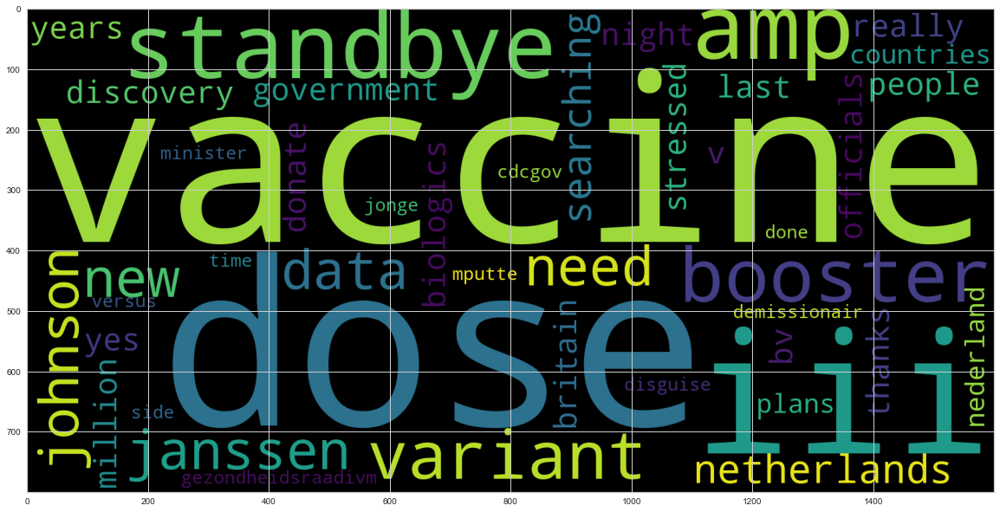

In [64]:
df = frequentWords(keyWord)

C:\Users\jaseb\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



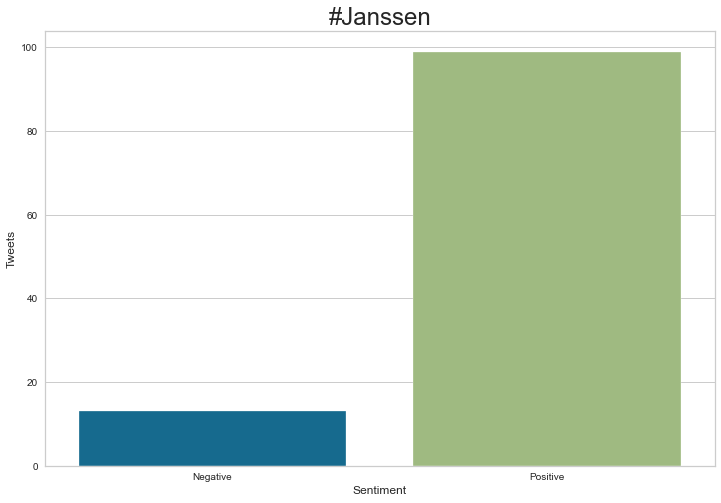

In [65]:
visual(df,keyWord)

Negative Words Word Cloud


Positive Words Word Cloud


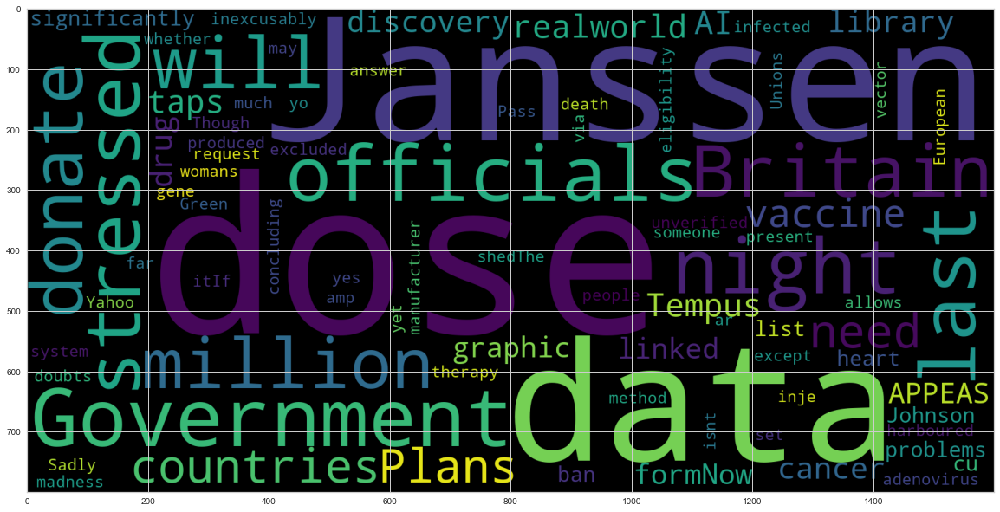

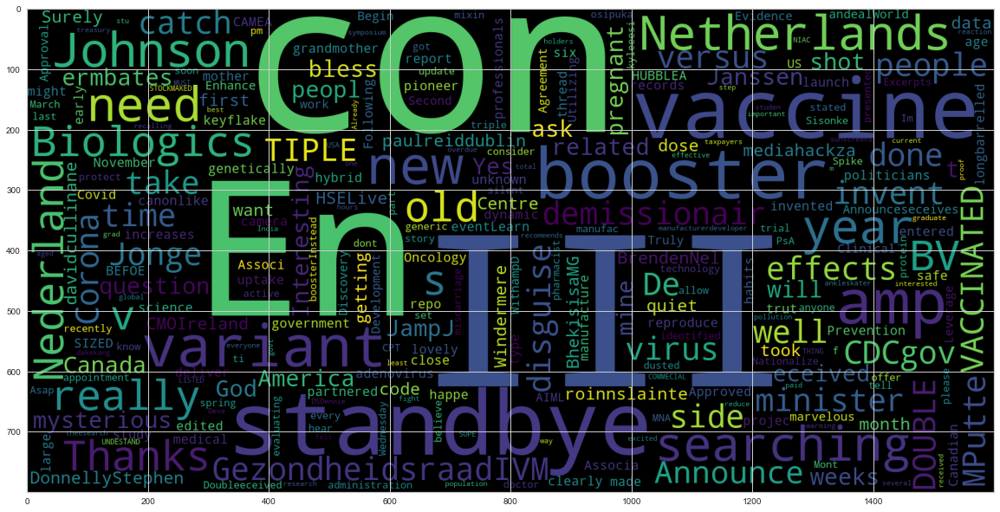

In [66]:
wordCloud(df)

In [67]:
tweetSource(df)

,source,count
0,Twitter for Android,46
1,Twitter Web App,29
2,Twitter for iPhone,19
3,Troi URL Plug-in,7
4,Twitter for iPad,3
5,TweetDeck,2
6,Sprout Social,1
7,Tweetbot for iΟS,1
8,Hootsuite Inc.,1
9,Retweetteuse,1


In [68]:
tweetLocation(df)

,location,count
0,location Unknown,57
1,the Netherlands,4
2,Australia,4
3,Joe Biden is a pedophile,3
4,"Stockholm, Sweden",3
5,"Los Angeles, CA",2
6,"Florida, USA",2
7,Ireland,2
8,"Amsterdam, the Netherlands",1
9,"Queensland, Australia",1


In [69]:
tweetUser(df)

,screen_name,count
0,jjaranaz94,20
1,TrasElValle_OBC,18
2,CLSServicesJobs,4
3,1stOncology,3
4,WilliamCobbett4,3
5,crippapy,3
6,FionaHoareau,3
7,FiorediNotte33,2
8,gr8musicvenues,2
9,wijnazoetermeer,1


In [70]:
tweetsPerDay(df)

In [71]:
unigram_df=ngram_df(df['text'],(1,1),20)
bigram_df=ngram_df(df['text'],(2,2),20)
trigram_df=ngram_df(df['text'],(3,3),20)
displayNgram(unigram_df,bigram_df,trigram_df)

In [72]:
violinPLot(df)

Naive Bayes:
Train accuracy 100.00%
Test accuracy 65.22%
Accuracy Score:
0.6521739130434783
Confusion Matrix:


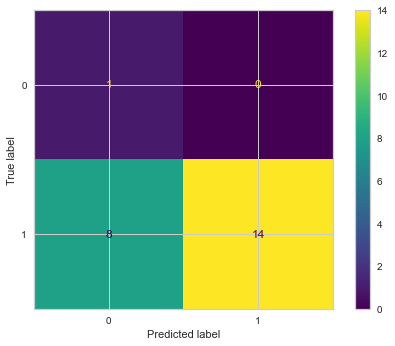

Classification Report:


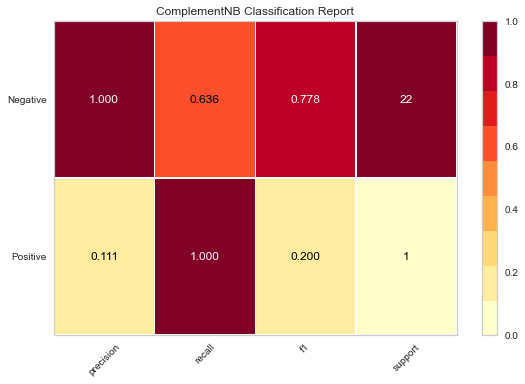



Random Forest Classification:
Train accuracy 89.89%
Test accuracy 95.65%
Accuracy Score:
0.9565217391304348
Confusion Matrix:


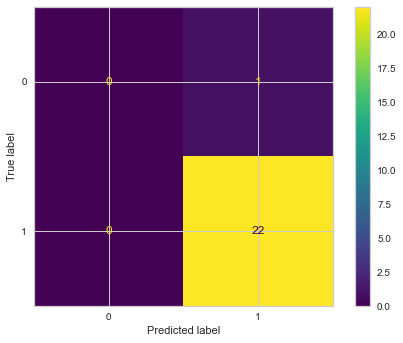

Classification Report:


C:\Users\jaseb\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



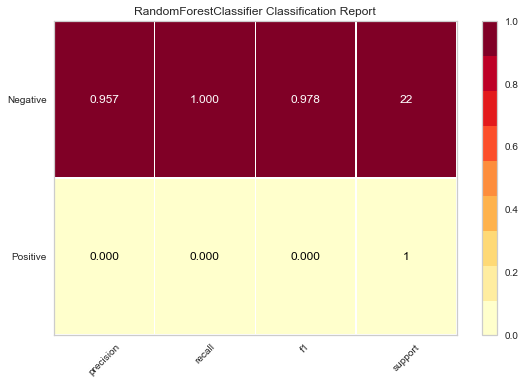



SVM:
Train accuracy 100.00%
Test accuracy 100.00%
Accuracy Score:
1.0
Confusion Matrix:


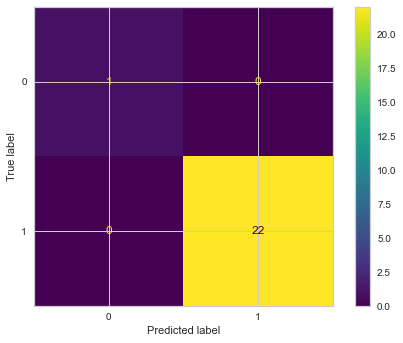

Classification Report:


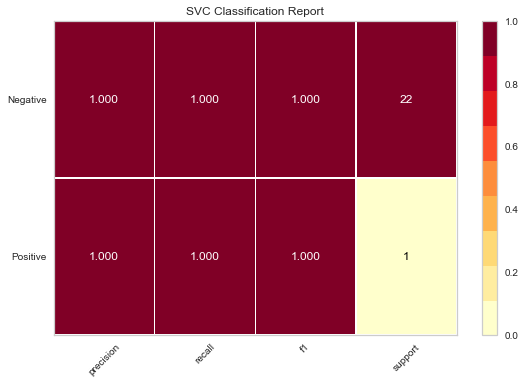

In [73]:
modelFile = modelPreparation(df)

In [74]:
testdf = df.iloc[0:10]
testdf

,Unnamed: 0,tweet id,time of tweet,user id,text,location,source,screen_name,Sentiment,After Stop word removal,tweet_date,text_length
0,0,1467152920223399944,2021-12-04 15:24:49,237785012,III con …,location Unknown,Twitter for Android,jjaranaz94,1,iii …,2021-12-04,3
1,1,1467152848421064705,2021-12-04 15:24:32,237785012,En standbye …,location Unknown,Twitter for Android,jjaranaz94,1,standbye …,2021-12-04,3
2,2,1467132529899495427,2021-12-04 14:03:47,36117076,Janssen taps Tempus AI and realworld data lib...,Bangalore,Twitter for Android,parvez1,0,janssen taps tempus realworld data library can...,2021-12-04,13
3,3,1467116727792283651,2021-12-04 13:01:00,2860693607,Janssen taps Tempus AI and realworld data libr...,"Brighton, UK",Hootsuite Inc.,Hayburysearch,0,janssen taps tempus realworld data library can...,2021-12-04,12
4,4,1466924072114266114,2021-12-04 00:15:27,950060335620268037,really needs to report the trut…,"Los Angeles, CA",Cal Fact Check,CalFactCheck,1,really needs report trut…,2021-12-04,6
5,5,1466916414921584643,2021-12-03 23:45:01,1441525915410894851,really needs to repo…,Everywhere,Twitter Web App,C19vaxS,1,really needs repo…,2021-12-03,4
6,6,1466841279732621322,2021-12-03 18:46:28,1136355965295611904,vaccine is made from a mysterious adenovirus ...,location Unknown,Twitter Web App,crippapy,1,vaccine made mysterious adenovirus ’ genetical...,2021-12-03,16
7,7,1466804968296521730,2021-12-03 16:22:11,178263338,keyflake In early of November me years old my...,"Sliven , Bulgaria",Twitter Web App,DimitarMishonov,1,keyflake early november years old lovely mothe...,2021-12-03,18
8,8,1466796066087526401,2021-12-03 15:46:48,962663499129409540,III con …,location Unknown,Twitter for Android,TrasElValle_OBC,1,iii …,2021-12-03,3
9,9,1466795370265165824,2021-12-03 15:44:02,374434796,For Vaccines amp Prevention in the Netherl...,the Netherlands,Troi URL Plug-in,CLSServicesJobs,1,vaccines amp prevention netherlands searching ...,2021-12-03,13


In [75]:
testModel(modelFile,testdf)

ComplementNB()
Naive Bayes:
[1 1 0 0 1 1 1 0 1 1]


Random Forest Classification:
[1 1 1 1 1 1 1 1 1 1]


SVM:
[1 1 0 0 1 1 1 1 1 1]


<ipython-input-25-2cbef85a952f>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-25-2cbef85a952f>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

